# Libraries

In [1]:
import numpy as np
import pandas as pd
import gc
import keras
import os
import shutil
import matplotlib.pyplot as plt
import cv2
import random

import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold

from skimage.transform import resize
import tensorflow as tf
import keras.backend as K
from keras.losses import binary_crossentropy

from keras.preprocessing.image import load_img
from keras import Model
from keras.callbacks import  ModelCheckpoint
from keras.layers import *
from keras.utils.vis_utils import plot_model
from keras import layers
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import *
from keras.callbacks import *
from keras.activations import sigmoid, tanh
import random
from keras.metrics import *
from sklearn.metrics import f1_score
from keras.layers import *


from PIL import Image
import tensorflow_addons as tfa 
from statistics import mean

# Set Parameters

In [2]:
img_dims= 256
batch_= 8
seed_ = 3+21+35+40+63
class_type = 'categorical' #binary/categorical
lr_ = 1e-4

seg_notclass= 1    #seg: 1, class: 0

# Metrics and Loss Functions

In [3]:
def precision(y_true, y_pred): 
    """Precision metric. Only computes a batch-wise average of precision. Computes the precision, a metric for multi-label classification of how many selected items are relevant. 
-    """ 
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) 
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1))) 
    precision = true_positives / (predicted_positives + K.epsilon()) 
    return precision 

def recall(y_true, y_pred): 
    """Recall metric. 
-    Only computes a batch-wise average of recall. Computes the recall, a metric for multi-label classification of how many relevant items are selected. 
-    """ 
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1))) 
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1))) 
    recall = true_positives / (possible_positives + K.epsilon()) 
    return recall 

def fbeta_score(y_true, y_pred, beta=1.0): 

    """Computes the F score.  
-    The F score is the weighted harmonic mean of precision and recall. 
-    Here it is only computed as a batch-wise average, not globally. 
-    This is useful for multi-label classification, where input samples can be 
-    classified as sets of labels. By only using accuracy (precision) a model 
-    would achieve a perfect score by simply assigning every class to every 
-    input. In order to avoid this, a metric should penalize incorrect class 
-    assignments as well (recall). The F-beta score (ranged from 0.0 to 1.0) 
-    computes this, as a weighted mean of the proportion of correct class 
-    assignments vs. the proportion of incorrect class assignments.  
-    With beta = 1, this is equivalent to a F-measure. With beta < 1, assigning 
-    correct classes becomes more important, and with beta > 1 the metric is 
-    instead weighted towards penalizing incorrect class assignments. 
-    """ 
    if beta < 0: 
        raise ValueError('The lowest choosable beta is zero (only precision).') 

    # If there are no true positives, fix the F score at 0 like sklearn. 
    if K.sum(K.round(K.clip(y_true, 0.0, 1.0))) == 0: 

        return 0.0 
    p = precision(y_true, y_pred) 
    r = recall(y_true, y_pred) 
    bb = beta*beta
    fbeta_score = (1 + bb) * (p * r) / (bb * p + r + K.epsilon()) 
    return fbeta_score 


def dice_coef(y_true, y_pred):
    smooth=1
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred)
    
    return (2.0 * intersection + smooth) / (union + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    return dice_coef_loss(y_true, y_pred) + bce(y_true, y_pred)

def iou(y_true, y_pred): #Jaccard Index
    smooth=1
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def mcc(y_true, y_pred): #matthews_correlation
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_pred_neg = 1 - y_pred_pos

    y_pos = K.round(K.clip(y_true, 0, 1))
    y_neg = 1 - y_pos

    tp = K.sum(y_pos * y_pred_pos)
    tn = K.sum(y_neg * y_pred_neg)

    fp = K.sum(y_neg * y_pred_pos)
    fn = K.sum(y_pos * y_pred_neg)

    numerator = (tp * tn - fp * fn)
    denominator = K.sqrt((tp + fp) * (tp + fn) * (tn + fp) * (tn + fn))

    return numerator / (denominator + K.epsilon())


def fmeasure(y_true, y_pred): 
    """Computes the f-measure, the harmonic mean of precision and recall. 
    Here it is only computed as a batch-wise average, not globally. 
    """ 
    return fbeta_score(y_true, y_pred, beta=1.0) 

def fbeta_loss(y_true, y_pred): 
    """Computes the f-measure, the harmonic mean of precision and recall. 
    Here it is only computed as a batch-wise average, not globally. 
    """ 
    return 1.0- fbeta_score(y_true, y_pred, beta=2.0) 

def XOR_Error(y_true, y_pred):
    num = K.sum(K.abs(y_true-y_pred))
    den = K.sum(y_true)
    return num/(den+K.epsilon())

def XOR_Error_Thresh(y_true, y_pred):
    y_pred_thresh = tf.cast(y_pred + 0.5, tf.int32)
    y_pred_thresh = tf.cast(y_pred_thresh, tf.float32)
    num = K.sum(K.abs(y_true-y_pred_thresh))
    den = K.sum(y_true)
    return num/(den+K.epsilon())

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

# Baseine Models

## Vanilla CNN

In [ ]:
X0 = Input((img_dims, img_dims, 3))
X=X0
for i in range(4):
  X = Conv2D(32*(2**(i)), 3, padding='same', activation='relu')(X)
  X = MaxPool2D((2,2))(X)


# x = GlobalAveragePooling2D()(model.get_layer('conv4_block6_out').output) 
x = GlobalAveragePooling2D()(X)
x = Dense(x.shape[-1], 'relu')(x)
x = Dense(128, 'relu')(x)
if class_type=='binary':
  x = Dense(1, 'sigmoid')(x)
else:
  x = Dense(7, 'softmax')(x)

if not seg_notclass:
  model = Model(X0, x)
  model.compile(loss= class_type+'_crossentropy',#'categorical_crossentropy', 
                optimizer= tf.keras.optimizers.Adam(learning_rate=lr_),
                metrics=['accuracy',
                         #tf.keras.metrics.Precision(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.Recall(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.AUC(num_thresholds=11)
                         precision,
                         recall,    
                        #  fbeta_score
                ])
  model.summary()

## ResNet
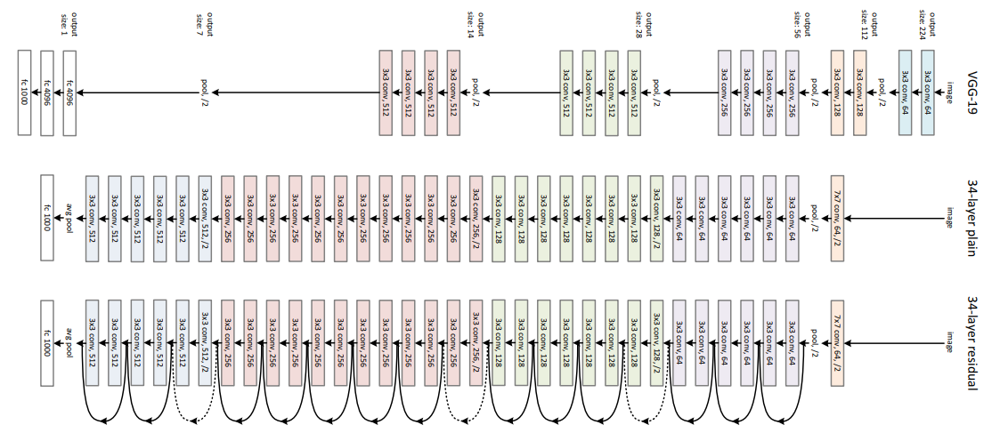

In [ ]:
model = tf.keras.applications.ResNet50(   # 50, 101, 152
    include_top=False,
    weights="imagenet",
    input_shape=(img_dims, img_dims, 3),
    pooling=None,
    classes=2,
)


# x = GlobalAveragePooling2D()(model.get_layer('conv4_block6_out').output) 
x = GlobalAveragePooling2D()(model.output)
x = Dense(512, 'relu')(x)
x = Dense(128, 'relu')(x)
if class_type=='binary':
  x = Dense(1, 'sigmoid')(x)
else:
  x = Dense(7, 'softmax')(x)


if not seg_notclass:
  model = Model(model.input, x)
  model.compile(loss= class_type+'_crossentropy',#'categorical_crossentropy', 
                optimizer= tf.keras.optimizers.Adam(learning_rate=lr_),
                metrics=['accuracy',
                         #tf.keras.metrics.Precision(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.Recall(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.AUC(num_thresholds=11)
                         precision,
                         recall,    
                        #  fbeta_score
                ])
  model.summary()

## EfficientNet
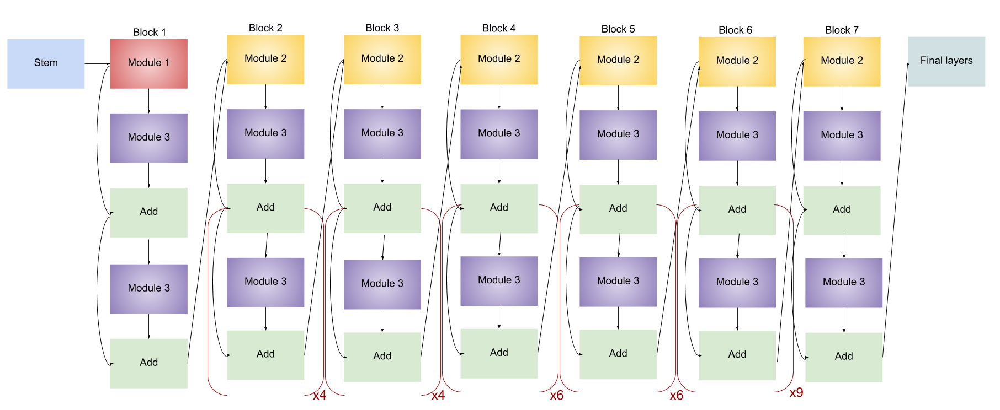

In [ ]:
model = tf.keras.applications.EfficientNetB2(
    include_top=False,
    weights="imagenet",
    input_shape=(img_dims, img_dims, 3),
    pooling=None,
    classes=2,
)


x = GlobalAveragePooling2D()(model.get_layer('block6a_expand_activation').output) #EffB2,B3, B4
# x = GlobalAveragePooling2D()(model.output)
x = Dense(512, 'relu')(x)
x = Dense(128, 'relu')(x)
if class_type=='binary':
  x = Dense(1, 'sigmoid')(x)
else:
  x = Dense(7, 'softmax')(x)

if not seg_notclass:
  model = Model(model.input, x)
  model.compile(loss= class_type+'_crossentropy',#'categorical_crossentropy', 
                optimizer= tf.keras.optimizers.Adam(learning_rate=lr_),
                metrics=['accuracy',
                         #tf.keras.metrics.Precision(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.Recall(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.AUC(num_thresholds=11)
                         precision,
                         recall,    
                        #  fbeta_score
                ])
  model.summary()

In [ ]:
plot_model(model, show_shapes=True)

##DenseNet
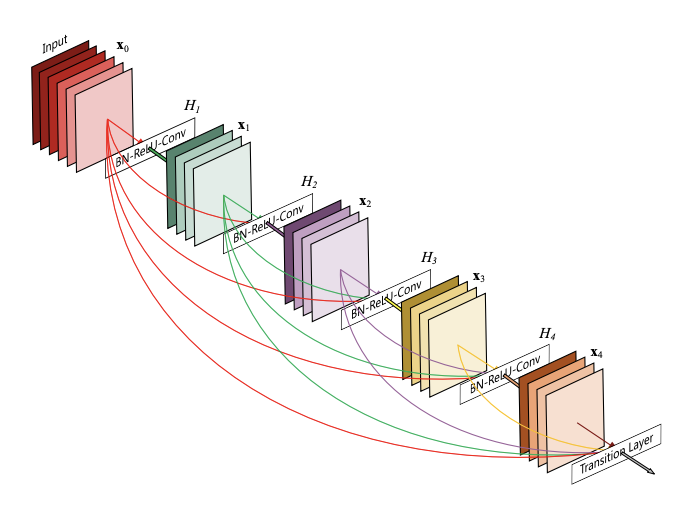

In [ ]:
model = tf.keras.applications.DenseNet169(  #Versions: 121, 169, 201
    include_top=False,
    weights="imagenet",
    input_shape=(img_dims, img_dims, 3),
    pooling=None,
)

# x = GlobalAveragePooling2D()(model.get_layer('pool4_conv').output) # DenseNet121
x = GlobalAveragePooling2D()(model.output)
x = Dense(512, 'relu')(x)
x = Dense(128, 'relu')(x)
if class_type=='binary':
  x = Dense(1, 'sigmoid')(x)
else:
  x = Dense(7, 'softmax')(x)

if not seg_notclass:
  model = Model(model.input, x)
  model.compile(loss= class_type+'_crossentropy',#'categorical_crossentropy', 
                optimizer= tf.keras.optimizers.Adam(learning_rate=lr_),
                metrics=['accuracy',
                         #tf.keras.metrics.Precision(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.Recall(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.AUC(num_thresholds=11)
                         precision,
                         recall,                         
                         fmeasure,
                        #  fbeta_score
                ])
  model.summary()

## Inception Net
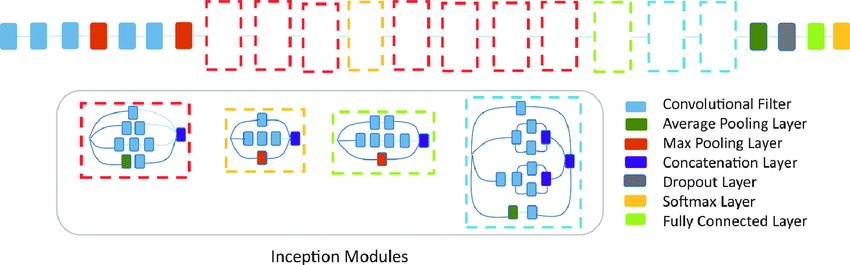

In [ ]:
model = tf.keras.applications.InceptionV3(  
    include_top=False,
    weights="imagenet",
    input_shape=(img_dims, img_dims, 3),
    pooling=None,
)

x = GlobalAveragePooling2D()(model.layers[-83].output) # InceptionNet
# x = GlobalAveragePooling2D()(model.output)
x = Dense(512, 'relu')(x)
x = Dense(128, 'relu')(x)
if class_type=='binary':
  x = Dense(1, 'sigmoid')(x)
else:
  x = Dense(7, 'softmax')(x)

if not seg_notclass:
  model = Model(model.input, x)
  model.compile(loss= class_type+'_crossentropy',#'categorical_crossentropy', 
                optimizer= tf.keras.optimizers.Adam(learning_rate=lr_),
                metrics=['accuracy',
                         #tf.keras.metrics.Precision(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.Recall(thresholds=0.5, class_id= 3),
                         #tf.keras.metrics.AUC(num_thresholds=11)
                         precision,
                         recall,                         
                         fmeasure,
                        #  fbeta_score
                ])
  model.summary()

## U-Net
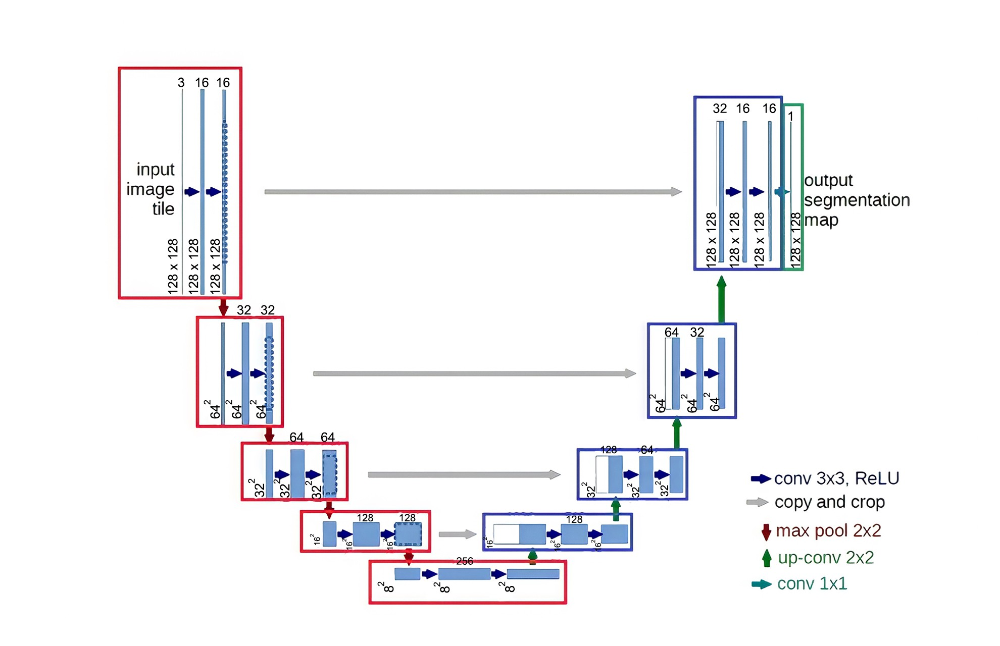

In [ ]:
def unet(img_dims, start_neurons):

    input_layer = Input((img_dims, img_dims, 3))
    conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_a')(input_layer)
    conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_b')(conv1)
    pool1 = MaxPooling2D((2, 2), name='pool1')(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_a')(pool1)
    conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_b')(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='conv3_a')(pool2)
    conv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='conv3_b')(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='conv4_a')(pool3)
    conv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='conv4_b')(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons * 16, (3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons * 16, (3, 3), activation="relu", padding="same")(convm)
    
    deconv4 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same", name='deconv4_c')(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='deconv4_b')(uconv4)
    uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='deconv4_a')(uconv4)

    deconv3 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same", name='deconv3_c')(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='deconv3_b')(uconv3)
    uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='deconv3_a')(uconv3)

    deconv2 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same", name='deconv2_c')(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='deconv2_b')(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='deconv2_a')(uconv2)

    deconv1 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same", name='deconv1_c')(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='deconv1_b')(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='deconv1_a')(uconv1)
    
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid", name='out_')(uconv1)

    model = Model(input_layer, output_layer)
    model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                  optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                     beta_1=0.9,
                                                     beta_2=0.999,
                                                     epsilon=None,
                                                     amsgrad=False),
                  metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])
    
    return model


if seg_notclass:
  model = unet(img_dims, 16)
  model.summary()

## U-Net++
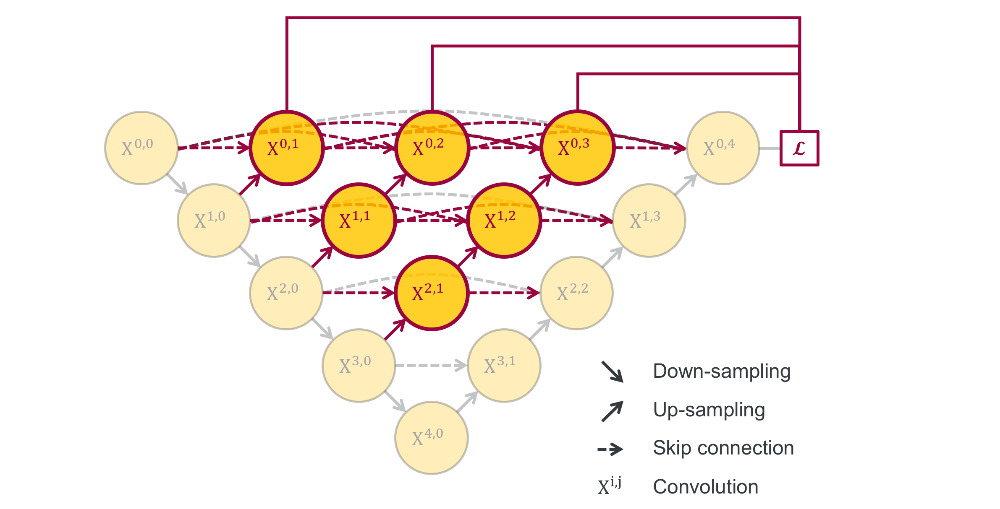

In [ ]:
def conv2d(filters: int):
    return Conv2D(filters=filters,
                  kernel_size=(3, 3),
                  padding='same')


def conv2dtranspose(filters: int):
    return Conv2DTranspose(filters=filters,
                           kernel_size=(2, 2),
                           strides=(2, 2),
                           padding='same')


def UNetPP(number_of_filters):
        model_input = Input((img_dims, img_dims, 3))
        x00 = conv2d(filters=int(16 * number_of_filters))(model_input)
        x00 = BatchNormalization()(x00)
        x00 = LeakyReLU(0.01)(x00)
        x00 = Dropout(0.2)(x00)
        x00 = conv2d(filters=int(16 * number_of_filters))(x00)
        x00 = BatchNormalization()(x00)
        x00 = LeakyReLU(0.01)(x00)
        x00 = Dropout(0.2)(x00)
        p0 = MaxPooling2D(pool_size=(2, 2))(x00)

        x10 = conv2d(filters=int(32 * number_of_filters))(p0)
        x10 = BatchNormalization()(x10)
        x10 = LeakyReLU(0.01)(x10)
        x10 = Dropout(0.2)(x10)
        x10 = conv2d(filters=int(32 * number_of_filters))(x10)
        x10 = BatchNormalization()(x10)
        x10 = LeakyReLU(0.01)(x10)
        x10 = Dropout(0.2)(x10)
        p1 = MaxPooling2D(pool_size=(2, 2))(x10)

        x01 = conv2dtranspose(int(16 * number_of_filters))(x10)
        x01 = concatenate([x00, x01])
        x01 = conv2d(filters=int(16 * number_of_filters))(x01)
        x01 = BatchNormalization()(x01)
        x01 = LeakyReLU(0.01)(x01)
        x01 = conv2d(filters=int(16 * number_of_filters))(x01)
        x01 = BatchNormalization()(x01)
        x01 = LeakyReLU(0.01)(x01)
        x01 = Dropout(0.2)(x01)

        x20 = conv2d(filters=int(64 * number_of_filters))(p1)
        x20 = BatchNormalization()(x20)
        x20 = LeakyReLU(0.01)(x20)
        x20 = Dropout(0.2)(x20)
        x20 = conv2d(filters=int(64 * number_of_filters))(x20)
        x20 = BatchNormalization()(x20)
        x20 = LeakyReLU(0.01)(x20)
        x20 = Dropout(0.2)(x20)
        p2 = MaxPooling2D(pool_size=(2, 2))(x20)

        x11 = conv2dtranspose(int(16 * number_of_filters))(x20)
        x11 = concatenate([x10, x11])
        x11 = conv2d(filters=int(16 * number_of_filters))(x11)
        x11 = BatchNormalization()(x11)
        x11 = LeakyReLU(0.01)(x11)
        x11 = conv2d(filters=int(16 * number_of_filters))(x11)
        x11 = BatchNormalization()(x11)
        x11 = LeakyReLU(0.01)(x11)
        x11 = Dropout(0.2)(x11)

        x02 = conv2dtranspose(int(16 * number_of_filters))(x11)
        x02 = concatenate([x00, x01, x02])
        x02 = conv2d(filters=int(16 * number_of_filters))(x02)
        x02 = BatchNormalization()(x02)
        x02 = LeakyReLU(0.01)(x02)
        x02 = conv2d(filters=int(16 * number_of_filters))(x02)
        x02 = BatchNormalization()(x02)
        x02 = LeakyReLU(0.01)(x02)
        x02 = Dropout(0.2)(x02)

        x30 = conv2d(filters=int(128 * number_of_filters))(p2)
        x30 = BatchNormalization()(x30)
        x30 = LeakyReLU(0.01)(x30)
        x30 = Dropout(0.2)(x30)
        x30 = conv2d(filters=int(128 * number_of_filters))(x30)
        x30 = BatchNormalization()(x30)
        x30 = LeakyReLU(0.01)(x30)
        x30 = Dropout(0.2)(x30)
        p3 = MaxPooling2D(pool_size=(2, 2))(x30)

        x21 = conv2dtranspose(int(16 * number_of_filters))(x30)
        x21 = concatenate([x20, x21])
        x21 = conv2d(filters=int(16 * number_of_filters))(x21)
        x21 = BatchNormalization()(x21)
        x21 = LeakyReLU(0.01)(x21)
        x21 = conv2d(filters=int(16 * number_of_filters))(x21)
        x21 = BatchNormalization()(x21)
        x21 = LeakyReLU(0.01)(x21)
        x21 = Dropout(0.2)(x21)

        x12 = conv2dtranspose(int(16 * number_of_filters))(x21)
        x12 = concatenate([x10, x11, x12])
        x12 = conv2d(filters=int(16 * number_of_filters))(x12)
        x12 = BatchNormalization()(x12)
        x12 = LeakyReLU(0.01)(x12)
        x12 = conv2d(filters=int(16 * number_of_filters))(x12)
        x12 = BatchNormalization()(x12)
        x12 = LeakyReLU(0.01)(x12)
        x12 = Dropout(0.2)(x12)

        x03 = conv2dtranspose(int(16 * number_of_filters))(x12)
        x03 = concatenate([x00, x01, x02, x03])
        x03 = conv2d(filters=int(16 * number_of_filters))(x03)
        x03 = BatchNormalization()(x03)
        x03 = LeakyReLU(0.01)(x03)
        x03 = conv2d(filters=int(16 * number_of_filters))(x03)
        x03 = BatchNormalization()(x03)
        x03 = LeakyReLU(0.01)(x03)
        x03 = Dropout(0.2)(x03)

        m = conv2d(filters=int(256 * number_of_filters))(p3)
        m = BatchNormalization()(m)
        m = LeakyReLU(0.01)(m)
        m = conv2d(filters=int(256 * number_of_filters))(m)
        m = BatchNormalization()(m)
        m = LeakyReLU(0.01)(m)
        m = Dropout(0.2)(m)

        x31 = conv2dtranspose(int(128 * number_of_filters))(m)
        x31 = concatenate([x31, x30])
        x31 = conv2d(filters=int(128 * number_of_filters))(x31)
        x31 = BatchNormalization()(x31)
        x31 = LeakyReLU(0.01)(x31)
        x31 = conv2d(filters=int(128 * number_of_filters))(x31)
        x31 = BatchNormalization()(x31)
        x31 = LeakyReLU(0.01)(x31)
        x31 = Dropout(0.2)(x31)

        x22 = conv2dtranspose(int(64 * number_of_filters))(x31)
        x22 = concatenate([x22, x20, x21])
        x22 = conv2d(filters=int(64 * number_of_filters))(x22)
        x22 = BatchNormalization()(x22)
        x22 = LeakyReLU(0.01)(x22)
        x22 = conv2d(filters=int(64 * number_of_filters))(x22)
        x22 = BatchNormalization()(x22)
        x22 = LeakyReLU(0.01)(x22)
        x22 = Dropout(0.2)(x22)

        x13 = conv2dtranspose(int(32 * number_of_filters))(x22)
        x13 = concatenate([x13, x10, x11, x12])
        x13 = conv2d(filters=int(32 * number_of_filters))(x13)
        x13 = BatchNormalization()(x13)
        x13 = LeakyReLU(0.01)(x13)
        x13 = conv2d(filters=int(32 * number_of_filters))(x13)
        x13 = BatchNormalization()(x13)
        x13 = LeakyReLU(0.01)(x13)
        x13 = Dropout(0.2)(x13)

        x04 = conv2dtranspose(int(16 * number_of_filters))(x13)
        x04 = concatenate([x04, x00, x01, x02, x03], axis=3)
        x04 = conv2d(filters=int(16 * number_of_filters))(x04)
        x04 = BatchNormalization()(x04)
        x04 = LeakyReLU(0.01)(x04)
        x04 = conv2d(filters=int(16 * number_of_filters))(x04)
        x04 = BatchNormalization()(x04)
        x04 = LeakyReLU(0.01)(x04)
        x04 = Dropout(0.2)(x04)

        output = Conv2D(1, kernel_size=(1, 1), activation='sigmoid')(x04)

        model = Model(model_input, output)
        model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                  optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                     beta_1=0.9,
                                                     beta_2=0.999,
                                                     epsilon=None,
                                                     amsgrad=False),
                  metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])
    
        return model
        
if seg_notclass:
  model = UNetPP(2)
  model.summary()


## U-Net++ Modded

In [ ]:
def conv2d(filters: int):
    return Conv2D(filters=filters,
                  kernel_size=(3, 3),
                  padding='same')


def conv2dtranspose(filters: int):
    return Conv2DTranspose(filters=filters,
                           kernel_size=(2, 2),
                           strides=(2, 2),
                           padding='same')


def UNetPP_mod(number_of_filters):
        model_input = Input((img_dims, img_dims, 3))
        x00 = conv2d(filters=int(16 * number_of_filters))(model_input)                                 
        x00 = BatchNormalization()(x00)
        x00 = LeakyReLU(0.01)(x00)
        x00 = Dropout(0.2)(x00)
        x00 = conv2d(filters=int(16 * number_of_filters))(x00)   
        x00 = BatchNormalization()(x00)
        x00 = LeakyReLU(0.01)(x00)
        x00 = Dropout(0.2)(x00)
        p00 = MaxPooling2D(pool_size=(2, 2))(x00)                 

        x10 = conv2d(filters=int(32 * number_of_filters))(p00)
        x10 = BatchNormalization()(x10)
        x10 = LeakyReLU(0.01)(x10)
        x10 = Dropout(0.2)(x10)
        x10 = conv2d(filters=int(32 * number_of_filters))(x10)
        x10 = BatchNormalization()(x10)
        x10 = LeakyReLU(0.01)(x10)
        x10 = Dropout(0.2)(x10)
        p10 = MaxPooling2D(pool_size=(2, 2))(x10)                 

        x01 = conv2dtranspose(int(16 * number_of_filters))(x10)  
        x01 = concatenate([x00, x01], axis=3)                             
        x01 = conv2d(filters=int(16 * number_of_filters))(x01)   
        x01 = BatchNormalization()(x01)
        x01 = LeakyReLU(0.01)(x01)
        x01 = conv2d(filters=int(16 * number_of_filters))(x01)   
        x01 = BatchNormalization()(x01)
        x01 = LeakyReLU(0.01)(x01)
        x01 = Dropout(0.2)(x01)                                   
        p01 = MaxPooling2D(pool_size=(2, 2))(x01)

        x20 = conv2d(filters=int(64 * number_of_filters))(p10)
        x20 = BatchNormalization()(x20)
        x20 = LeakyReLU(0.01)(x20)
        x20 = Dropout(0.2)(x20)
        x20 = conv2d(filters=int(64 * number_of_filters))(x20)
        x20 = BatchNormalization()(x20)
        x20 = LeakyReLU(0.01)(x20)
        x20 = Dropout(0.2)(x20)
        p20 = MaxPooling2D(pool_size=(2, 2))(x20)

        x11 = conv2dtranspose(int(16 * number_of_filters))(x20)
        x11 = concatenate([p01, x10, x11], axis=3)
        x11 = conv2d(filters=int(16 * number_of_filters))(x11)
        x11 = BatchNormalization()(x11)
        x11 = LeakyReLU(0.01)(x11)
        x11 = conv2d(filters=int(16 * number_of_filters))(x11)
        x11 = BatchNormalization()(x11)
        x11 = LeakyReLU(0.01)(x11)
        x11 = Dropout(0.2)(x11)
        p11 = MaxPooling2D(pool_size=(2, 2))(x11)

        x02 = conv2dtranspose(int(16 * number_of_filters))(x11)
        x02 = concatenate([x00, x01, x02], axis=3)
        x02 = conv2d(filters=int(16 * number_of_filters))(x02)
        x02 = BatchNormalization()(x02)
        x02 = LeakyReLU(0.01)(x02)
        x02 = conv2d(filters=int(16 * number_of_filters))(x02)
        x02 = BatchNormalization()(x02)
        x02 = LeakyReLU(0.01)(x02)
        x02 = Dropout(0.2)(x02)
        p02 = MaxPooling2D(pool_size=(2, 2))(x02)

        x30 = conv2d(filters=int(128 * number_of_filters))(p20)
        x30 = BatchNormalization()(x30)
        x30 = LeakyReLU(0.01)(x30)
        x30 = Dropout(0.2)(x30)
        x30 = conv2d(filters=int(128 * number_of_filters))(x30)
        x30 = BatchNormalization()(x30)
        x30 = LeakyReLU(0.01)(x30)
        x30 = Dropout(0.2)(x30)
        p30 = MaxPooling2D(pool_size=(2, 2))(x30)

        x21 = conv2dtranspose(int(16 * number_of_filters))(x30)
        x21 = concatenate([p11, x20, x21], axis=3)
        x21 = conv2d(filters=int(16 * number_of_filters))(x21)
        x21 = BatchNormalization()(x21)
        x21 = LeakyReLU(0.01)(x21)
        x21 = conv2d(filters=int(16 * number_of_filters))(x21)
        x21 = BatchNormalization()(x21)
        x21 = LeakyReLU(0.01)(x21)
        x21 = Dropout(0.2)(x21)
        p21 = MaxPooling2D(pool_size=(2, 2))(x21)

        x12 = conv2dtranspose(int(16 * number_of_filters))(x21)
        x12 = concatenate([p02, x10, x11, x12], axis=3)
        x12 = conv2d(filters=int(16 * number_of_filters))(x12)
        x12 = BatchNormalization()(x12)
        x12 = LeakyReLU(0.01)(x12)
        x12 = conv2d(filters=int(16 * number_of_filters))(x12)
        x12 = BatchNormalization()(x12)
        x12 = LeakyReLU(0.01)(x12)
        x12 = Dropout(0.2)(x12)
        p12 = MaxPooling2D(pool_size=(2, 2))(x12)

        x03 = conv2dtranspose(int(16 * number_of_filters))(x12)
        x03 = concatenate([x00, x01, x02, x03], axis=3)
        x03 = conv2d(filters=int(16 * number_of_filters))(x03)
        x03 = BatchNormalization()(x03)
        x03 = LeakyReLU(0.01)(x03)
        x03 = conv2d(filters=int(16 * number_of_filters))(x03)
        x03 = BatchNormalization()(x03)
        x03 = LeakyReLU(0.01)(x03)
        x03 = Dropout(0.2)(x03)
        p03 = MaxPooling2D(pool_size=(2, 2))(x03)

        m = conv2d(filters=int(256 * number_of_filters))(p30)
        m = BatchNormalization()(m)
        m = LeakyReLU(0.01)(m)
        m = conv2d(filters=int(256 * number_of_filters))(m)
        m = BatchNormalization()(m)
        m = LeakyReLU(0.01)(m)
        m = Dropout(0.2)(m)

        x31 = conv2dtranspose(int(128 * number_of_filters))(m)
        x31 = concatenate([p21, x31, x30], axis=3)
        x31 = conv2d(filters=int(128 * number_of_filters))(x31)
        x31 = BatchNormalization()(x31)
        x31 = LeakyReLU(0.01)(x31)
        x31 = conv2d(filters=int(128 * number_of_filters))(x31)
        x31 = BatchNormalization()(x31)
        x31 = LeakyReLU(0.01)(x31)
        x31 = Dropout(0.2)(x31)

        x22 = conv2dtranspose(int(64 * number_of_filters))(x31)
        x22 = concatenate([p12, x22, x20, x21], axis=3)
        x22 = conv2d(filters=int(64 * number_of_filters))(x22)
        x22 = BatchNormalization()(x22)
        x22 = LeakyReLU(0.01)(x22)
        x22 = conv2d(filters=int(64 * number_of_filters))(x22)
        x22 = BatchNormalization()(x22)
        x22 = LeakyReLU(0.01)(x22)
        x22 = Dropout(0.2)(x22)

        x13 = conv2dtranspose(int(32 * number_of_filters))(x22)
        x13 = concatenate([p03, x13, x10, x11, x12], axis=3)
        x13 = conv2d(filters=int(32 * number_of_filters))(x13)
        x13 = BatchNormalization()(x13)
        x13 = LeakyReLU(0.01)(x13)
        x13 = conv2d(filters=int(32 * number_of_filters))(x13)
        x13 = BatchNormalization()(x13)
        x13 = LeakyReLU(0.01)(x13)
        x13 = Dropout(0.2)(x13)

        x04 = conv2dtranspose(int(16 * number_of_filters))(x13)
        x04 = concatenate([x04, x00, x01, x02, x03], axis=3)
        x04 = conv2d(filters=int(16 * number_of_filters))(x04)
        x04 = BatchNormalization()(x04)
        x04 = LeakyReLU(0.01)(x04)
        x04 = conv2d(filters=int(16 * number_of_filters))(x04)
        x04 = BatchNormalization()(x04)
        x04 = LeakyReLU(0.01)(x04)
        x04 = Dropout(0.2)(x04)

        output = Conv2D(1, kernel_size=(1, 1), activation='sigmoid')(x04)
        print(output.shape)

        model = Model(model_input, output)
        model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                  optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                     beta_1=0.9,
                                                     beta_2=0.999,
                                                     epsilon=None,
                                                     amsgrad=False),
                  metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])
    
        return model
        
if seg_notclass:
    model = UNetPP_mod(2)
    model.summary()

## UNetPP Mod 2

In [ ]:
def conv2d(filters: int):
    return Conv2D(filters=filters,
                  kernel_size=(3, 3),
                  padding='same')


def conv2dtranspose(filters: int):
    return Conv2DTranspose(filters=filters,
                           kernel_size=(2, 2),
                           strides=(2, 2),
                           padding='same')


def block_operation(xij, level, number_of_filters):
    total_filters = int(16*number_of_filters*(2**level))
    
    xij = conv2d(filters=total_filters)(xij)                                 
    xij = BatchNormalization()(xij)
    xij = LeakyReLU(0.01)(xij)
    xij = Dropout(0.2)(xij)
    xij = conv2d(filters=total_filters)(xij)   
    xij = BatchNormalization()(xij)
    xij = LeakyReLU(0.01)(xij)
    xij = Dropout(0.2)(xij)
    
    return xij
    
def UNetPP_mod_2(number_of_filters):


    model_input = Input((img_dims, img_dims, 3))

    x00 = block_operation(model_input, 0, number_of_filters)
    d00 = MaxPooling2D(pool_size=(2, 2))(x00)   

    x10 = block_operation(d00, 1, number_of_filters)
    d10 = MaxPooling2D(pool_size=(2, 2))(x10)
    u10 = conv2dtranspose(int(16 * number_of_filters))(x10)

    x20 = block_operation(d10, 2, number_of_filters)
    d20 = MaxPooling2D(pool_size=(2, 2))(x20)
    u20 = conv2dtranspose(int(32 * number_of_filters))(x20)

    x30 = block_operation(d20, 3, number_of_filters)
    d30 = MaxPooling2D(pool_size=(2, 2))(x30)
    u30 = conv2dtranspose(int(64 * number_of_filters))(x30)

    x40 = block_operation(d30, 4, number_of_filters)
    u40 = conv2dtranspose(int(128 * number_of_filters))(x40)

    x41 = concatenate([d30, x40], axis=3)
    x41 = block_operation(x41, 4, number_of_filters)
    u41 = conv2dtranspose(int(128 * number_of_filters))(x41)

    x31 = concatenate([d20, x30, u40, u41], axis=3)
    x31 = block_operation(x31, 3, number_of_filters)
    d31 = MaxPooling2D(pool_size=(2, 2))(x31)
    u31 = conv2dtranspose(int(64 * number_of_filters))(x31)

    x21 = concatenate([d10, x20, u30, u31], axis=3)
    x21 = block_operation(x21, 2, number_of_filters)
    d21 = MaxPooling2D(pool_size=(2, 2))(x21)
    u21 = conv2dtranspose(int(32 * number_of_filters))(x21)

    x11 = concatenate([d00, x10, u20, u21], axis=3)
    x11 = block_operation(x11, 1, number_of_filters)
    d11 = MaxPooling2D(pool_size=(2, 2))(x11)
    u11 = conv2dtranspose(int(16 * number_of_filters))(x11)

    x01 = concatenate([x00, u10, u11], axis=3)
    x01 = block_operation(x01, 0, number_of_filters)
    d01 = MaxPooling2D(pool_size=(2, 2))(x01)

    x02 = concatenate([x01, u11], axis=3)
    x02 = block_operation(x02, 0, number_of_filters)
    d02 = MaxPooling2D(pool_size=(2, 2))(x02)

    x12 = concatenate([d02, d01, x11, u21], axis=3)
    x12 = block_operation(x12, 1, number_of_filters)
    d12 = MaxPooling2D(pool_size=(2, 2))(x12)
    u12 = conv2dtranspose(int(16 * number_of_filters))(x12)

    x22 = concatenate([d12, d11, x21, u31], axis=3)
    x22 = block_operation(x22, 2, number_of_filters)
    d22 = MaxPooling2D(pool_size=(2, 2))(x22)
    u22 = conv2dtranspose(int(32 * number_of_filters))(x22)

    x32 = concatenate([d22, d21, x31, u41], axis=3)
    x32 = block_operation(x32, 3, number_of_filters)
    d32 = MaxPooling2D(pool_size=(2, 2))(x32)
    u32 = conv2dtranspose(int(64 * number_of_filters))(x32)

    x42 = concatenate([d32, d31, x41], axis=3)
    x42 = block_operation(x42, 4, number_of_filters)
    u42 = conv2dtranspose(int(128 * number_of_filters))(x42)

    x43 = concatenate([d32, x42], axis=3)
    x43 = block_operation(x42, 4, number_of_filters)
    u43 = conv2dtranspose(int(128 * number_of_filters))(x42)

    x33 = concatenate([d22, x32, u42, u43], axis=3)
    x33 = block_operation(x33, 3, number_of_filters)
    u33 = conv2dtranspose(int(64 * number_of_filters))(x33)

    x23 = concatenate([d12, x22, u32, u33], axis=3)
    x23 = block_operation(x23, 2, number_of_filters)
    u23 = conv2dtranspose(int(32 * number_of_filters))(x23)

    x13 = concatenate([d02, x12, u22, u23], axis=3)
    x13 = block_operation(x13, 1, number_of_filters)
    u13 = conv2dtranspose(int(16 * number_of_filters))(x13)

    x03 = concatenate([x01, x02, u13], axis=3)
    x03 = block_operation(x03, 0, number_of_filters)

    output = Conv2D(1, kernel_size=(1, 1), activation='sigmoid')(x03)
    # print(output.shape)

    model = Model(model_input, output)
    model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                  optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                     beta_1=0.9,
                                                     beta_2=0.999,
                                                     epsilon=None,
                                                     amsgrad=False),
                  metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])
    
    return model
        
if seg_notclass:
    model = UNetPP_mod_2(2)
    model.summary()


## UNetPP Mod 3

In [ ]:
def conv2d(filters: int):
    return Conv2D(filters=filters,
                  kernel_size=(3, 3),
                  padding='same')


def conv2dtranspose(filters: int):
    return Conv2DTranspose(filters=filters,
                           kernel_size=(2, 2),
                           strides=(2, 2),
                           padding='same')


def block_operation(xij, level, number_of_filters):
    total_filters = int(8*number_of_filters*(2**level))
    
    xij = conv2d(filters=total_filters)(xij)                                 
    xij = BatchNormalization()(xij)
    xij = LeakyReLU(0.01)(xij)
    xij = Dropout(0.2)(xij)
    xij = conv2d(filters=total_filters)(xij)   
    xij = BatchNormalization()(xij)
    xij = LeakyReLU(0.01)(xij)
    xij = Dropout(0.2)(xij)
    
    return xij
    
def UNetPP_mod_3(number_of_filters):


    model_input = Input((img_dims, img_dims, 3))

    x00 = block_operation(model_input, 0, number_of_filters)
    d00 = MaxPooling2D(pool_size=(2, 2))(x00)   

    x10 = block_operation(d00, 1, number_of_filters)
    d10 = MaxPooling2D(pool_size=(2, 2))(x10)
    u10 = conv2dtranspose(int(8 * number_of_filters))(x10)

    x20 = block_operation(d10, 2, number_of_filters)
    d20 = MaxPooling2D(pool_size=(2, 2))(x20)
    u20 = conv2dtranspose(int(16 * number_of_filters))(x20)

    x30 = block_operation(d20, 3, number_of_filters)
    d30 = MaxPooling2D(pool_size=(2, 2))(x30)
    u30 = conv2dtranspose(int(32 * number_of_filters))(x30)

    x40 = block_operation(d30, 4, number_of_filters)
    u40 = conv2dtranspose(int(64 * number_of_filters))(x40)

    x41 = concatenate([d30, x40], axis=3)
    x41 = block_operation(x41, 4, number_of_filters)
    u41 = conv2dtranspose(int(64 * number_of_filters))(x41)

    x31 = concatenate([d20, x30, u40, u41], axis=3)
    x31 = block_operation(x31, 3, number_of_filters)
    d31 = MaxPooling2D(pool_size=(2, 2))(x31)
    u31 = conv2dtranspose(int(32 * number_of_filters))(x31)

    x21 = concatenate([d10, x20, u30, u31], axis=3)
    x21 = block_operation(x21, 2, number_of_filters)
    d21 = MaxPooling2D(pool_size=(2, 2))(x21)
    u21 = conv2dtranspose(int(16 * number_of_filters))(x21)

    x11 = concatenate([d00, x10, u20, u21], axis=3)
    x11 = block_operation(x11, 1, number_of_filters)
    d11 = MaxPooling2D(pool_size=(2, 2))(x11)
    u11 = conv2dtranspose(int(8 * number_of_filters))(x11)

    x01 = concatenate([x00, u10, u11], axis=3)
    x01 = block_operation(x01, 0, number_of_filters)
    d01 = MaxPooling2D(pool_size=(2, 2))(x01)

    x02 = concatenate([x00, x01, u11], axis=3)
    x02 = block_operation(x02, 0, number_of_filters)
    d02 = MaxPooling2D(pool_size=(2, 2))(x02)

    x12 = concatenate([d02, d01, x10, x11, u21], axis=3)
    x12 = block_operation(x12, 1, number_of_filters)
    d12 = MaxPooling2D(pool_size=(2, 2))(x12)
    u12 = conv2dtranspose(int(8 * number_of_filters))(x12)

    x22 = concatenate([d12, d11, x20, x21, u31], axis=3)
    x22 = block_operation(x22, 2, number_of_filters)
    d22 = MaxPooling2D(pool_size=(2, 2))(x22)
    u22 = conv2dtranspose(int(16 * number_of_filters))(x22)

    x32 = concatenate([d22, d21, x30, x31, u41], axis=3)
    x32 = block_operation(x32, 3, number_of_filters)
    d32 = MaxPooling2D(pool_size=(2, 2))(x32)
    u32 = conv2dtranspose(int(32 * number_of_filters))(x32)

    x42 = concatenate([d32, d31, x40, x41], axis=3)
    x42 = block_operation(x42, 4, number_of_filters)
    u42 = conv2dtranspose(int(64 * number_of_filters))(x42)

    x43 = concatenate([d32, x40, x41, x42], axis=3)
    x43 = block_operation(x42, 4, number_of_filters)
    u43 = conv2dtranspose(int(64 * number_of_filters))(x42)

    x33 = concatenate([d22, x30, x31, x32, u42, u43], axis=3)
    x33 = block_operation(x33, 3, number_of_filters)
    u33 = conv2dtranspose(int(32 * number_of_filters))(x33)

    x23 = concatenate([d12, x20, x21, x22, u32, u33], axis=3)
    x23 = block_operation(x23, 2, number_of_filters)
    u23 = conv2dtranspose(int(16 * number_of_filters))(x23)

    x13 = concatenate([d02, x10, x11, x12, u22, u23], axis=3)
    x13 = block_operation(x13, 1, number_of_filters)
    u13 = conv2dtranspose(int(8 * number_of_filters))(x13)

    x03 = concatenate([x01, x02, u13], axis=3)
    x03 = block_operation(x03, 0, number_of_filters)

    output = Conv2D(1, kernel_size=(1, 1), activation='sigmoid')(x03)
    # print(output.shape)

    model = Model(model_input, output)
    model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                  optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                     beta_1=0.9,
                                                     beta_2=0.999,
                                                     epsilon=None,
                                                     amsgrad=False),
                  metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])
    
    return model
        
if seg_notclass:
    model = UNetPP_mod_3(2)
    model.summary()


## FCN (Base Model : VGG) 
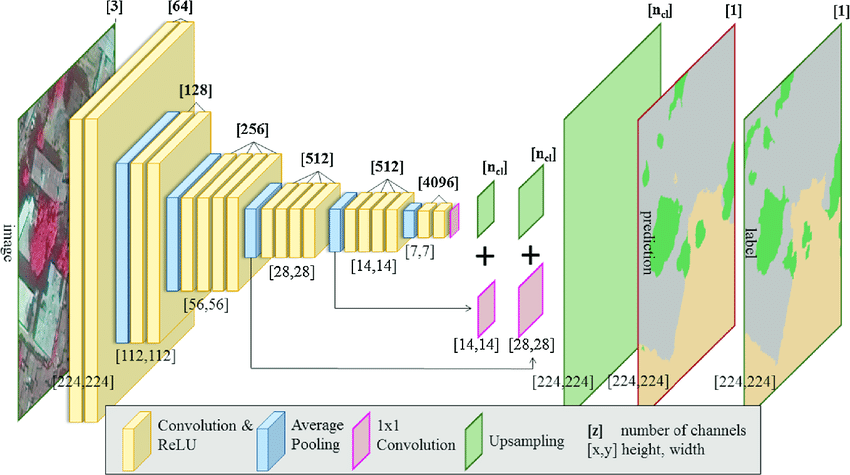

## PSPNet
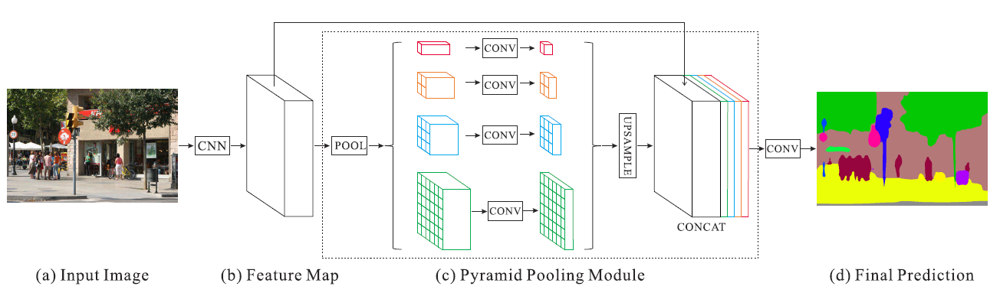

In [ ]:


def conv_block(X,filters,block):
    # resiudal block with dilated convolutions
    # add skip connection at last after doing convoluion operation to input X
    
    b = 'block_'+str(block)+'_'
    f1,f2,f3 = filters
    X_skip = X
    # block_a
    X = Convolution2D(filters=f1,kernel_size=(1,1),dilation_rate=(1,1),
                      padding='same',kernel_initializer='he_normal',name=b+'a')(X)
    X = BatchNormalization(name=b+'batch_norm_a')(X)
    X = LeakyReLU(alpha=0.2,name=b+'leakyrelu_a')(X)
    # block_b
    X = Convolution2D(filters=f2,kernel_size=(3,3),dilation_rate=(2,2),
                      padding='same',kernel_initializer='he_normal',name=b+'b')(X)
    X = BatchNormalization(name=b+'batch_norm_b')(X)
    X = LeakyReLU(alpha=0.2,name=b+'leakyrelu_b')(X)
    # block_c
    X = Convolution2D(filters=f3,kernel_size=(1,1),dilation_rate=(1,1),
                      padding='same',kernel_initializer='he_normal',name=b+'c')(X)
    X = BatchNormalization(name=b+'batch_norm_c')(X)
    # skip_conv
    X_skip = Convolution2D(filters=f3,kernel_size=(3,3),padding='same',name=b+'skip_conv')(X_skip)
    X_skip = BatchNormalization(name=b+'batch_norm_skip_conv')(X_skip)
    # block_c + skip_conv
    X = Add(name=b+'add')([X,X_skip])
    X = ReLU(name=b+'relu')(X)
    return X
    
def base_feature_maps(input_layer):
     # base covolution module to get input image feature maps 
    
     # block_1
      base = conv_block(input_layer,[32,32,64],'1')
      # block_2
      base = conv_block(base,[64,64,128],'2')
      # block_3
      base = conv_block(base,[128,128,256],'3')

      return base

def pyramid_feature_maps(input_layer):
    # pyramid pooling module
    
    base = base_feature_maps(input_layer)
    # red
    red = GlobalAveragePooling2D(name='red_pool')(base)
    red = tf.keras.layers.Reshape((1,1,256))(red)
    red = Convolution2D(filters=64,kernel_size=(1,1),name='red_1_by_1')(red)
    red = UpSampling2D(size=256,interpolation='bilinear',name='red_upsampling')(red)
    # yellow
    yellow = AveragePooling2D(pool_size=(2,2),name='yellow_pool')(base)
    yellow = Convolution2D(filters=64,kernel_size=(1,1),name='yellow_1_by_1')(yellow)
    yellow = UpSampling2D(size=2,interpolation='bilinear',name='yellow_upsampling')(yellow)
    # blue
    blue = AveragePooling2D(pool_size=(4,4),name='blue_pool')(base)
    blue = Convolution2D(filters=64,kernel_size=(1,1),name='blue_1_by_1')(blue)
    blue = UpSampling2D(size=4,interpolation='bilinear',name='blue_upsampling')(blue)
    # green
    green = AveragePooling2D(pool_size=(8,8),name='green_pool')(base)
    green = Convolution2D(filters=64,kernel_size=(1,1),name='green_1_by_1')(green)
    green = UpSampling2D(size=8,interpolation='bilinear',name='green_upsampling')(green)
    # base + red + yellow + blue + green
    return tf.keras.layers.concatenate([base,red,yellow,blue,green])

def last_conv_module(input_layer):
    X = pyramid_feature_maps(input_layer)
    X = Convolution2D(filters=1,kernel_size=3,padding='same',name='last_conv_3_by_3')(X)
    X = BatchNormalization(name='last_conv_3_by_3_batch_norm')(X)
    X = Activation('sigmoid',name='last_conv_relu')(X)
    # X = tf.keras.layers.Flatten(name='last_conv_flatten')(X)
    return X


X0 = Input((img_dims, img_dims, 3))
X = last_conv_module(X0)

if seg_notclass:
  model = Model(X0,X)
  model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                      beta_1=0.9,
                                                      beta_2=0.999,
                                                      epsilon=None,
                                                      amsgrad=False),
                metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])

  model.summary()

# Works From Papers

## Preliminaries : VNet, R2U-Net, TransUnet

In [ ]:
from tensorflow.keras.layers import Layer, MultiHeadAttention, LayerNormalization, Dense, Embedding
from tensorflow.image import extract_patches
from tensorflow import math



def decode_layer(X, channel, pool_size, unpool, kernel_size=3, 
                 activation='ReLU', batch_norm=False, name='decode'):
    '''
    An overall decode layer, based on either upsampling or trans conv.
    
    decode_layer(X, channel, pool_size, unpool, kernel_size=3,
                 activation='ReLU', batch_norm=False, name='decode')
    
    Input
    ----------
        X: input tensor.
        pool_size: the decoding factor.
        channel: (for trans conv only) number of convolution filters.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.           
        kernel_size: size of convolution kernels. 
                     If kernel_size='auto', then it equals to the `pool_size`.
        activation: one of the `tensorflow.keras.layers` interface, e.g., ReLU.
        batch_norm: True for batch normalization, False otherwise.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor.
    
    * The defaut: `kernel_size=3`, is suitable for `pool_size=2`.
    
    '''
    # parsers
    if unpool is False:
        # trans conv configurations
        bias_flag = not batch_norm
    
    elif unpool == 'nearest':
        # upsample2d configurations
        unpool = True
        interp = 'nearest'
    
    elif (unpool is True) or (unpool == 'bilinear'):
        # upsample2d configurations
        unpool = True
        interp = 'bilinear'
    
    else:
        raise ValueError('Invalid unpool keyword')
        
    if unpool:
        X = UpSampling2D(size=(pool_size, pool_size), interpolation=interp, name='{}_unpool'.format(name))(X)
    else:
        if kernel_size == 'auto':
            kernel_size = pool_size
            
        X = Conv2DTranspose(channel, kernel_size, strides=(pool_size, pool_size), 
                            padding='same', name='{}_trans_conv'.format(name))(X)
        
        # batch normalization
        if batch_norm:
            X = BatchNormalization(axis=3, name='{}_bn'.format(name))(X)
            
        # activation
        if activation is not None:
            activation_func = eval(activation)
            X = activation_func(name='{}_activation'.format(name))(X)
        
    return X

def encode_layer(X, channel, pool_size, pool, kernel_size='auto', 
                 activation='ReLU', batch_norm=False, name='encode'):
    '''
    An overall encode layer, based on one of the:
    (1) max-pooling, (2) average-pooling, (3) strided conv2d.
    
    encode_layer(X, channel, pool_size, pool, kernel_size='auto', 
                 activation='ReLU', batch_norm=False, name='encode')
    
    Input
    ----------
        X: input tensor.
        pool_size: the encoding factor.
        channel: (for strided conv only) number of convolution filters.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        kernel_size: size of convolution kernels. 
                     If kernel_size='auto', then it equals to the `pool_size`.
        activation: one of the `tensorflow.keras.layers` interface, e.g., ReLU.
        batch_norm: True for batch normalization, False otherwise.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor.
        
    '''
    # parsers
    if (pool in [False, True, 'max', 'ave']) is not True:
        raise ValueError('Invalid pool keyword')
        
    # maxpooling2d as default
    if pool is True:
        pool = 'max'
        
    elif pool is False:
        # stride conv configurations
        bias_flag = not batch_norm
    
    if pool == 'max':
        X = MaxPooling2D(pool_size=(pool_size, pool_size), name='{}_maxpool'.format(name))(X)
        
    elif pool == 'ave':
        X = AveragePooling2D(pool_size=(pool_size, pool_size), name='{}_avepool'.format(name))(X)
        
    else:
        if kernel_size == 'auto':
            kernel_size = pool_size
        
        # linear convolution with strides
        X = Conv2D(channel, kernel_size, strides=(pool_size, pool_size), 
                   padding='valid', use_bias=bias_flag, name='{}_stride_conv'.format(name))(X)
        
        # batch normalization
        if batch_norm:
            X = BatchNormalization(axis=3, name='{}_bn'.format(name))(X)
            
        # activation
        if activation is not None:
            activation_func = eval(activation)
            X = activation_func(name='{}_activation'.format(name))(X)
            
    return X


def CONV_stack(X, channel, kernel_size=3, stack_num=2, 
               dilation_rate=1, activation='ReLU', 
               batch_norm=False, name='conv_stack'):
    '''
    Stacked convolutional layers:
    (Convolutional layer --> batch normalization --> Activation)*stack_num
    
    CONV_stack(X, channel, kernel_size=3, stack_num=2, dilation_rate=1, activation='ReLU', 
               batch_norm=False, name='conv_stack')
    
    
    Input
    ----------
        X: input tensor.
        channel: number of convolution filters.
        kernel_size: size of 2-d convolution kernels.
        stack_num: number of stacked Conv2D-BN-Activation layers.
        dilation_rate: optional dilated convolution kernel.
        activation: one of the `tensorflow.keras.layers` interface, e.g., ReLU.
        batch_norm: True for batch normalization, False otherwise.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor
        
    '''
    
    bias_flag = not batch_norm
    
    # stacking Convolutional layers
    for i in range(stack_num):
        
        activation_func = eval(activation)
        
        # linear convolution
        X = Conv2D(channel, kernel_size, padding='same', use_bias=bias_flag, 
                   dilation_rate=dilation_rate, name='{}_{}'.format(name, i))(X)
        
        # batch normalization
        if batch_norm:
            X = BatchNormalization(axis=3, name='{}_{}_bn'.format(name, i))(X)
        
        # activation
        activation_func = eval(activation)
        X = activation_func(name='{}_{}_activation'.format(name, i))(X)
        
    return X


def vnet_left(X, channel, res_num, activation='ReLU', pool=True, batch_norm=False, name='left'):
    '''
    The encoder block of 2-d V-net.
    
    vnet_left(X, channel, res_num, activation='ReLU', pool=True, batch_norm=False, name='left')
    
    Input
    ----------
        X: input tensor.
        channel: number of convolution filters.
        res_num: number of convolutional layers within the residual path.
        activation: one of the `tensorflow.keras.layers` interface, e.g., 'ReLU'.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        batch_norm: True for batch normalization, False otherwise.
        name: name of the created keras layers.
        
    Output
    ----------
        X: output tensor.
        
    '''
    
    pool_size = 2

    X = encode_layer(X, channel, pool_size, pool, activation=activation, 
                     batch_norm=batch_norm, name='{}_encode'.format(name))
    
    if pool is not False:
        X = CONV_stack(X, channel, kernel_size=3, stack_num=1, dilation_rate=1, 
                       activation=activation, batch_norm=batch_norm, name='{}_pre_conv'.format(name))

    X = Res_CONV_stack(X, X, channel, res_num=res_num, activation=activation, 
                       batch_norm=batch_norm, name='{}_res_conv'.format(name))
    return X

def vnet_right(X, X_list, channel, res_num, activation='ReLU', unpool=True, batch_norm=False, name='right'):
    '''
    The decoder block of 2-d V-net.
    
    vnet_right(X, X_list, channel, res_num, activation='ReLU', unpool=True, batch_norm=False, name='right')
    
    Input
    ----------
        X: input tensor.
        X_list: a list of other tensors that connected to the input tensor.
        channel: number of convolution filters.
        stack_num: number of convolutional layers.
        res_num: number of convolutional layers within the residual path.
        activation: one of the `tensorflow.keras.layers` interface, e.g., 'ReLU'.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.
        batch_norm: True for batch normalization, False otherwise.
        name: name of the created keras layers.
        
    Output
    ----------
        X: output tensor.
    
    '''
    pool_size = 2
    
    X = decode_layer(X, channel, pool_size, unpool, 
                     activation=activation, batch_norm=batch_norm, name='{}_decode'.format(name))
    
    X_skip = X
    # print(X.shape)
    
    X = concatenate([X,]+X_list, axis=-1, name='{}_concat'.format(name))

    X = Conv2D(X_skip.shape[-1], 3, padding='same',activation=activation)(X)
    # print(X_skip.shape)
    X = Res_CONV_stack(X, X_skip, channel, res_num, activation=activation, 
                       batch_norm=batch_norm, name='{}_res_conv'.format(name))
    
    return X

def vnet_2d_base(input_tensor, filter_num, res_num_ini=1, res_num_max=3, 
                 activation='ReLU', batch_norm=False, pool=True, unpool=True, name='vnet'):
    '''
    The base of 2-d V-net.
    
    vnet_2d_base(input_tensor, filter_num, res_num_ini=1, res_num_max=3, 
                 activation='ReLU', batch_norm=False, pool=True, unpool=True, name='vnet')
    
    Milletari, F., Navab, N. and Ahmadi, S.A., 2016, October. V-net: Fully convolutional neural 
    networks for volumetric medical image segmentation. In 2016 fourth international conference 
    on 3D vision (3DV) (pp. 565-571). IEEE.
    
    The Two-dimensional version is inspired by:
    https://github.com/FENGShuanglang/2D-Vnet-Keras
    
    Input
    ----------
        input_tensor: the input tensor of the base, e.g., `keras.layers.Inpyt((None, None, 3))`.
        filter_num: a list that defines the number of filters for each \
                    down- and upsampling levels. e.g., `[64, 128, 256, 512]`.
                    The depth is expected as `len(filter_num)`.
        res_num_ini: number of convolutional layers of the first first residual block (before downsampling).
        res_num_max: the max number of convolutional layers within a residual block.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interfaces, e.g., 'ReLU'.
        batch_norm: True for batch normalization.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.                 
        name: prefix of the created keras layers.
            
    Output
    ----------
        X: output tensor.
    
    * This is a modified version of V-net for 2-d inputw.
    * The original work supports `pool=False` only. 
      If pool is True, 'max', or 'ave', an additional conv2d layer will be applied. 
    * All the 5-by-5 convolutional kernels are changed (and fixed) to 3-by-3.
    
    '''

    depth_ = len(filter_num)

    # determine the number of res conv layers in each down- and upsampling level
    res_num_list = []
    for i in range(depth_):
        temp_num = res_num_ini + i
        if temp_num > res_num_max:
            temp_num = res_num_max
        res_num_list.append(temp_num)

    X_skip = []

    X = input_tensor
    # ini conv layer
    X = CONV_stack(X, filter_num[0], kernel_size=3, stack_num=1, dilation_rate=1, 
                   activation=activation, batch_norm=batch_norm, name='{}_input_conv'.format(name))
    
    # X = Conv2D(X_skip.shape[-1], 3, padding='same',activation=activation)(X)

    X = Res_CONV_stack(X, X, filter_num[0], res_num=res_num_list[0], activation=activation, 
                 batch_norm=batch_norm, name='{}_down_0'.format(name))
    X_skip.append(X)

    # downsampling levels
    for i, f in enumerate(filter_num[1:]):
        X = vnet_left(X, f, res_num=res_num_list[i+1], activation=activation, pool=pool, 
                      batch_norm=batch_norm, name='{}_down_{}'.format(name, i+1))

        X_skip.append(X)

    X_skip = X_skip[:-1][::-1]
    filter_num = filter_num[:-1][::-1]
    res_num_list = res_num_list[:-1][::-1]

    # upsampling levels
    for i, f in enumerate(filter_num):
        X = vnet_right(X, [X_skip[i],], f, res_num=res_num_list[i], 
                       activation=activation, unpool=unpool, batch_norm=batch_norm, name='{}_up_{}'.format(name, i))

    return X

def Res_CONV_stack(X, X_skip, channel, res_num, activation='ReLU', batch_norm=False, name='res_conv'):
    '''
    Stacked convolutional layers with residual path.
     
    Res_CONV_stack(X, X_skip, channel, res_num, activation='ReLU', batch_norm=False, name='res_conv')
     
    Input
    ----------
        X: input tensor.
        X_skip: the tensor that does go into the residual path 
                can be a copy of X (e.g., the identity block of ResNet).
        channel: number of convolution filters.
        res_num: number of convolutional layers within the residual path.
        activation: one of the `tensorflow.keras.layers` interface, e.g., 'ReLU'.
        batch_norm: True for batch normalization, False otherwise.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor.
        
    '''  
    # print('________________________')
    # print(X.shape, X_skip.shape, channel)
    if X.shape[-1]==512 and X_skip.shape[-1]==512:
        channel = 512
    X = CONV_stack(X, channel, kernel_size=3, stack_num=res_num, dilation_rate=1, 
                   activation=activation, batch_norm=batch_norm, name=name)
    # print(X.shape)
    X = add([X_skip, X], name='{}_add'.format(name))
    
    activation_func = eval(activation)
    X = activation_func(name='{}_add_activation'.format(name))(X)
    
    return X


def CONV_output(X, n_labels, kernel_size=1, activation='Softmax', name='conv_output'):
    '''
    Convolutional layer with output activation.
    
    CONV_output(X, n_labels, kernel_size=1, activation='Softmax', name='conv_output')
    
    Input
    ----------
        X: input tensor.
        n_labels: number of classification label(s).
        kernel_size: size of 2-d convolution kernels. Default is 1-by-1.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interface or 'Sigmoid'.
                    Default option is 'Softmax'.
                    if None is received, then linear activation is applied.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor.
        
    '''
    
    X = Conv2D(n_labels, kernel_size, padding='same', use_bias=True, name=name, activation=  activation)(X)
    
    # if activation:
        
    #     if activation == 'Sigmoid':
    #         X = Activation('sigmoid', name='{}_activation'.format(name))(X)
            
    #     else:
    #         activation_func = eval(activation)
    #         X = activation_func(name='{}_activation'.format(name))(X)
            
    return X


def gelu_(X):

    return 0.5*X*(1.0 + math.tanh(0.7978845608028654*(X + 0.044715*math.pow(X, 3))))

def snake_(X, beta):

    return X + (1/beta)*math.square(math.sin(beta*X))


class GELU(Layer):
    '''
    Gaussian Error Linear Unit (GELU), an alternative of ReLU
    
    Y = GELU()(X)
    
    ----------
    Hendrycks, D. and Gimpel, K., 2016. Gaussian error linear units (gelus). arXiv preprint arXiv:1606.08415.
    
    Usage: use it as a tf.keras.Layer
    
    
    '''
    def __init__(self, trainable=False, **kwargs):
        super(GELU, self).__init__(**kwargs)
        self.supports_masking = True
        self.trainable = trainable

    def build(self, input_shape):
        super(GELU, self).build(input_shape)

    def call(self, inputs, mask=None):
        return gelu_(inputs)

    def get_config(self):
        config = {'trainable': self.trainable}
        base_config = super(GELU, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))
    def compute_output_shape(self, input_shape):
        return input_shape

    
class Snake(Layer):
    '''
    Snake activation function $X + (1/b)*sin^2(b*X)$. Proposed to learn periodic targets.
    
    Y = Snake(beta=0.5, trainable=False)(X)
    
    ----------
    Ziyin, L., Hartwig, T. and Ueda, M., 2020. Neural networks fail to learn periodic functions 
    and how to fix it. arXiv preprint arXiv:2006.08195.
    
    '''
    def __init__(self, beta=0.5, trainable=False, **kwargs):
        super(Snake, self).__init__(**kwargs)
        self.supports_masking = True
        self.beta = beta
        self.trainable = trainable

    def build(self, input_shape):
        self.beta_factor = K.variable(self.beta, dtype=K.floatx(), name='beta_factor')
        if self.trainable:
            self._trainable_weights.append(self.beta_factor)

        super(Snake, self).build(input_shape)

    def call(self, inputs, mask=None):
        return snake_(inputs, self.beta_factor)

    def get_config(self):
        config = {'beta': self.get_weights()[0] if self.trainable else self.beta, 'trainable': self.trainable}
        base_config = super(Snake, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def compute_output_shape(self, input_shape):
        return input_shape



def UNET_left(X, channel, kernel_size=3, stack_num=2, activation='ReLU', 
              pool=True, batch_norm=False, name='left0'):
    '''
    The encoder block of U-net.
    
    UNET_left(X, channel, kernel_size=3, stack_num=2, activation='ReLU', 
              pool=True, batch_norm=False, name='left0')
    
    Input
    ----------
        X: input tensor.
        channel: number of convolution filters.
        kernel_size: size of 2-d convolution kernels.
        stack_num: number of convolutional layers.
        activation: one of the `tensorflow.keras.layers` interface, e.g., 'ReLU'.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        batch_norm: True for batch normalization, False otherwise.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor.
        
    '''
    pool_size = 2
    
    X = encode_layer(X, channel, pool_size, pool, activation=activation, 
                     batch_norm=batch_norm, name='{}_encode'.format(name))

    X = CONV_stack(X, channel, kernel_size, stack_num=stack_num, activation=activation, 
                   batch_norm=batch_norm, name='{}_conv'.format(name))
    
    return X


def UNET_right(X, X_list, channel, kernel_size=3, 
               stack_num=2, activation='ReLU',
               unpool=True, batch_norm=False, concat=True, name='right0'):
    
    '''
    The decoder block of U-net.
    
    Input
    ----------
        X: input tensor.
        X_list: a list of other tensors that connected to the input tensor.
        channel: number of convolution filters.
        kernel_size: size of 2-d convolution kernels.
        stack_num: number of convolutional layers.
        activation: one of the `tensorflow.keras.layers` interface, e.g., 'ReLU'.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.
        batch_norm: True for batch normalization, False otherwise.
        concat: True for concatenating the corresponded X_list elements.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor.
    
    '''
    
    pool_size = 2
    
    X = decode_layer(X, channel, pool_size, unpool, 
                     activation=activation, batch_norm=batch_norm, name='{}_decode'.format(name))
    
    # linear convolutional layers before concatenation
    X = CONV_stack(X, channel, kernel_size, stack_num=1, activation=activation, 
                   batch_norm=batch_norm, name='{}_conv_before_concat'.format(name))
    if concat:
        # <--- *stacked convolutional can be applied here
        X = concatenate([X,]+X_list, axis=3, name=name+'_concat')
    
    # Stacked convolutions after concatenation 
    X = CONV_stack(X, channel, kernel_size, stack_num=stack_num, activation=activation, 
                   batch_norm=batch_norm, name=name+'_conv_after_concat')
    
    return X

## V-Net (modified for 2-d inputs): Fully Convolutional Neural Networks for Volumetric Medical Image Segmentation
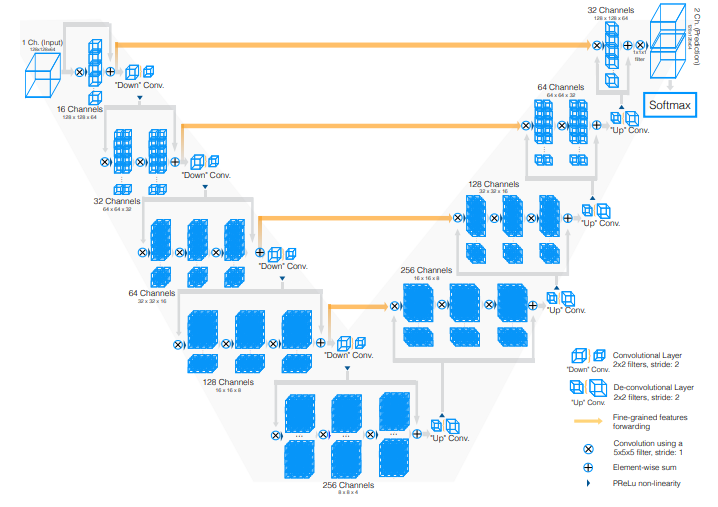

*Paper: https://arxiv.org/pdf/1606.04797.pdf*

*git-repo: https://github.com/yingkaisha/keras-unet-collection*

In [ ]:
def vnet_2d(input_size, filter_num, n_labels,
            res_num_ini=1, res_num_max=3, 
            activation='ReLU', output_activation='Softmax', 
            batch_norm=False, pool=True, unpool=True, name='vnet'):
    '''
    vnet 2d
    
    vnet_2d(input_size, filter_num, n_labels,
            res_num_ini=1, res_num_max=3, 
            activation='ReLU', output_activation='Softmax', 
            batch_norm=False, pool=True, unpool=True, name='vnet')
    
    Milletari, F., Navab, N. and Ahmadi, S.A., 2016, October. V-net: Fully convolutional neural 
    networks for volumetric medical image segmentation. In 2016 fourth international conference 
    on 3D vision (3DV) (pp. 565-571). IEEE.
    
    The Two-dimensional version is inspired by:
    https://github.com/FENGShuanglang/2D-Vnet-Keras
    
    Input
    ----------
        input_size: the size/shape of network input, e.g., `(128, 128, 3)`.
        filter_num: a list that defines the number of filters for each \
                    down- and upsampling levels. e.g., `[64, 128, 256, 512]`.
                    The depth is expected as `len(filter_num)`.
        n_labels: number of output labels.
        res_num_ini: number of convolutional layers of the first first residual block (before downsampling).
        res_num_max: the max number of convolutional layers within a residual block.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interfaces, e.g., 'ReLU'.
        output_activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interface or 'Sigmoid'.
                           Default option is 'Softmax'.
                           if None is received, then linear activation is applied.
        batch_norm: True for batch normalization.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.               
        name: prefix of the created keras layers.
            
    Output
    ----------
        model: a keras model. 
    
    * This is a modified version of V-net for 2-d inputw.
    * The original work supports `pool=False` only. 
      If pool is True, 'max', or 'ave', an additional conv2d layer will be applied. 
    * All the 5-by-5 convolutional kernels are changed (and fixed) to 3-by-3.
    '''
    
    IN = Input(input_size)
    X = IN
    # base
    X = vnet_2d_base(X, filter_num, res_num_ini=res_num_ini, res_num_max= res_num_max, 
                     activation=activation, batch_norm=batch_norm, pool=pool, unpool=unpool, name=name)
    # output layer
    OUT = CONV_output(X, n_labels, kernel_size=1, activation=output_activation, name='{}_output'.format(name))
    
    # functional API model
    model = Model(inputs=[IN,], outputs=[OUT,], name='{}_model'.format(name))
    
    return model



if seg_notclass:
  model = vnet_2d((img_dims, img_dims, 3),[64, 128, 256, 512],1, output_activation='sigmoid' )
  model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                      beta_1=0.9,
                                                      beta_2=0.999,
                                                      epsilon=None,
                                                      amsgrad=False),
                metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])

  model.summary()

## ResUNet++: An Advanced Architecture for Medical Image Segmentation

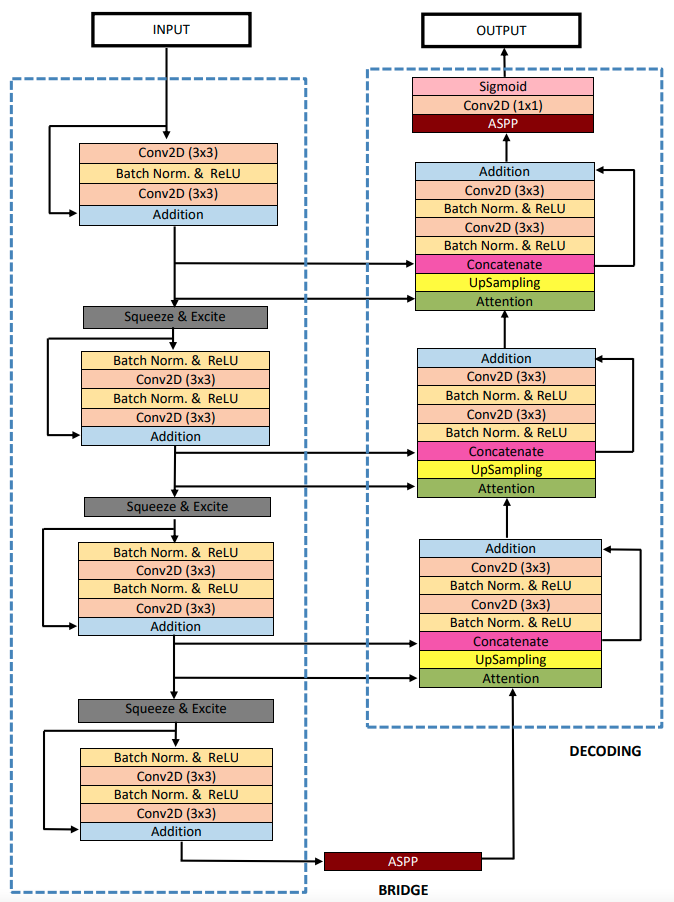

*Paper: https://arxiv.org/pdf/1911.07067.pdf*

*git-repo: https://github.com/DebeshJha/ResUNetPlusPlus-with-CRF-and-TTA/blob/master/train.py*

In [ ]:
def squeeze_excite_block(inputs, ratio=8):
    init = inputs
    channel_axis = -1
    filters = init.shape[channel_axis]
    se_shape = (1, 1, filters)

    se = GlobalAveragePooling2D()(init)
    se = Reshape(se_shape)(se)
    se = Dense(filters // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
    se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)

    x = Multiply()([init, se])
    return x

def stem_block(x, n_filter, strides):
    x_init = x

    ## Conv 1
    x = Conv2D(n_filter, (3, 3), padding="same", strides=strides)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(n_filter, (3, 3), padding="same")(x)

    ## Shortcut
    s  = Conv2D(n_filter, (1, 1), padding="same", strides=strides)(x_init)
    s = BatchNormalization()(s)

    ## Add
    x = Add()([x, s])
    x = squeeze_excite_block(x)
    return x


def resnet_block(x, n_filter, strides=1):
    x_init = x

    ## Conv 1
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(n_filter, (3, 3), padding="same", strides=strides)(x)
    ## Conv 2
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Conv2D(n_filter, (3, 3), padding="same", strides=1)(x)

    ## Shortcut
    s  = Conv2D(n_filter, (1, 1), padding="same", strides=strides)(x_init)
    s = BatchNormalization()(s)

    ## Add
    x = Add()([x, s])
    x = squeeze_excite_block(x)
    return x

def aspp_block(x, num_filters, rate_scale=1):
    x1 = Conv2D(num_filters, (3, 3), dilation_rate=(6 * rate_scale, 6 * rate_scale), padding="SAME")(x)
    x1 = BatchNormalization()(x1)

    x2 = Conv2D(num_filters, (3, 3), dilation_rate=(12 * rate_scale, 12 * rate_scale), padding="SAME")(x)
    x2 = BatchNormalization()(x2)

    x3 = Conv2D(num_filters, (3, 3), dilation_rate=(18 * rate_scale, 18 * rate_scale), padding="SAME")(x)
    x3 = BatchNormalization()(x3)

    x4 = Conv2D(num_filters, (3, 3), padding="SAME")(x)
    x4 = BatchNormalization()(x4)

    y = Add()([x1, x2, x3, x4])
    y = Conv2D(num_filters, (1, 1), padding="SAME")(y)
    return y

def attetion_block(g, x):
    """
        g: Output of Parallel Encoder block
        x: Output of Previous Decoder block
    """

    filters = x.shape[-1]

    g_conv = BatchNormalization()(g)
    g_conv = Activation("relu")(g_conv)
    g_conv = Conv2D(filters, (3, 3), padding="SAME")(g_conv)

    g_pool = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(g_conv)

    x_conv = BatchNormalization()(x)
    x_conv = Activation("relu")(x_conv)
    x_conv = Conv2D(filters, (3, 3), padding="SAME")(x_conv)

    gc_sum = Add()([g_pool, x_conv])

    gc_conv = BatchNormalization()(gc_sum)
    gc_conv = Activation("relu")(gc_conv)
    gc_conv = Conv2D(filters, (3, 3), padding="SAME")(gc_conv)

    gc_mul = Multiply()([gc_conv, x])
    return gc_mul

class ResUnetPlusPlus:
    def __init__(self, input_size=256):
        self.input_size = input_size

    def build_model(self):
        n_filters = [32, 64, 128, 256, 512]
        inputs = Input((self.input_size, self.input_size, 3))

        c0 = inputs
        c1 = stem_block(c0, n_filters[0], strides=1)

        ## Encoder
        c2 = resnet_block(c1, n_filters[1], strides=2)
        c3 = resnet_block(c2, n_filters[2], strides=2)
        c4 = resnet_block(c3, n_filters[3], strides=2)

        ## Bridge
        b1 = aspp_block(c4, n_filters[4])

        ## Decoder
        d1 = attetion_block(c3, b1)
        d1 = UpSampling2D((2, 2))(d1)
        d1 = Concatenate()([d1, c3])
        d1 = resnet_block(d1, n_filters[3])

        d2 = attetion_block(c2, d1)
        d2 = UpSampling2D((2, 2))(d2)
        d2 = Concatenate()([d2, c2])
        d2 = resnet_block(d2, n_filters[2])

        d3 = attetion_block(c1, d2)
        d3 = UpSampling2D((2, 2))(d3)
        d3 = Concatenate()([d3, c1])
        d3 = resnet_block(d3, n_filters[1])

        ## output
        outputs = aspp_block(d3, n_filters[0])
        outputs = Conv2D(1, (1, 1), padding="same")(outputs)
        outputs = Activation("sigmoid")(outputs)

        ## Model
        model = Model(inputs, outputs)
        return model





if seg_notclass:
  model= ResUnetPlusPlus(img_dims).build_model()
  model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                      beta_1=0.9,
                                                      beta_2=0.999,
                                                      epsilon=None,
                                                      amsgrad=False),
                metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])

  model.summary()


## R2U-Net : Recurrent Residual Convolutional Neural Network based on U-Net for Medical Image Segmentation
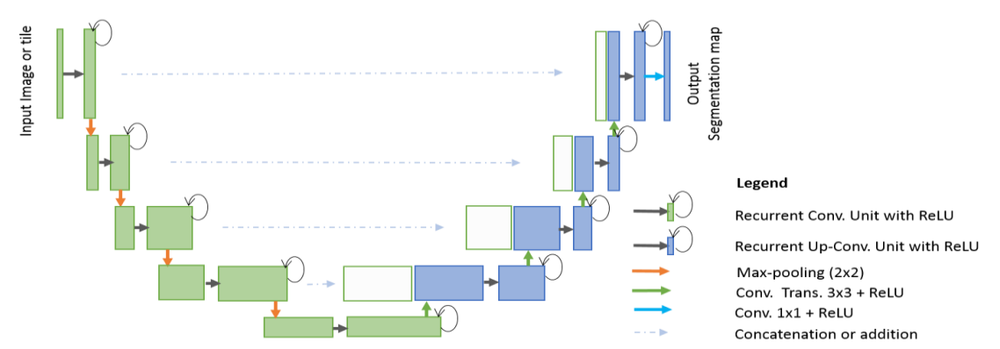

*Paper : https://arxiv.org/ftp/arxiv/papers/1802/1802.06955.pdf*

*git-repo: https://github.com/yingkaisha/keras-unet-collection*

In [ ]:
def RR_CONV(X, channel, kernel_size=3, stack_num=2, recur_num=2, activation='ReLU', batch_norm=False, name='rr'):
    '''
    Recurrent convolutional layers with skip connection.
    
    RR_CONV(X, channel, kernel_size=3, stack_num=2, recur_num=2, activation='ReLU', batch_norm=False, name='rr')
    
    Input
    ----------
        X: input tensor.
        channel: number of convolution filters.
        kernel_size: size of 2-d convolution kernels.
        stack_num: number of stacked recurrent convolutional layers.
        recur_num: number of recurrent iterations.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interfaces, e.g., 'ReLU'.
        batch_norm: True for batch normalization, False otherwise.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor.
        
    '''
    
    activation_func = eval(activation)
    
    layer_skip = Conv2D(channel, 1, name='{}_conv'.format(name))(X)
    layer_main = layer_skip
    
    for i in range(stack_num):

        layer_res = Conv2D(channel, kernel_size, padding='same', name='{}_conv{}'.format(name, i))(layer_main)
        
        if batch_norm:
            layer_res = BatchNormalization(name='{}_bn{}'.format(name, i))(layer_res)
            
        layer_res = activation_func(name='{}_activation{}'.format(name, i))(layer_res)
            
        for j in range(recur_num):
            
            layer_add = add([layer_res, layer_main], name='{}_add{}_{}'.format(name, i, j))
            
            layer_res = Conv2D(channel, kernel_size, padding='same', name='{}_conv{}_{}'.format(name, i, j))(layer_add)
            
            if batch_norm:
                layer_res = BatchNormalization(name='{}_bn{}_{}'.format(name, i, j))(layer_res)
                
            layer_res = activation_func(name='{}_activation{}_{}'.format(name, i, j))(layer_res)
            
        layer_main = layer_res

    out_layer = add([layer_main, layer_skip], name='{}_add{}'.format(name, i))
    
    return out_layer


def UNET_RR_left(X, channel, kernel_size=3, 
                 stack_num=2, recur_num=2, activation='ReLU', 
                 pool=True, batch_norm=False, name='left0'):
    '''
    The encoder block of R2U-Net.
    
    UNET_RR_left(X, channel, kernel_size=3, 
                 stack_num=2, recur_num=2, activation='ReLU', 
                 pool=True, batch_norm=False, name='left0')
    
    Input
    ----------
        X: input tensor.
        channel: number of convolution filters.
        kernel_size: size of 2-d convolution kernels.
        stack_num: number of stacked recurrent convolutional layers.
        recur_num: number of recurrent iterations.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interfaces, e.g., 'ReLU'.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        batch_norm: True for batch normalization, False otherwise.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor.
    
    *downsampling is fixed to 2-by-2, e.g., reducing feature map sizes from 64-by-64 to 32-by-32
    '''
    pool_size = 2
    
    # maxpooling layer vs strided convolutional layers
    X = encode_layer(X, channel, pool_size, pool, activation=activation, 
                     batch_norm=batch_norm, name='{}_encode'.format(name))
    
    # stack linear convolutional layers
    X = RR_CONV(X, channel, stack_num=stack_num, recur_num=recur_num, 
                activation=activation, batch_norm=batch_norm, name=name)    
    return X


def UNET_RR_right(X, X_list, channel, kernel_size=3, 
                   stack_num=2, recur_num=2, activation='ReLU',
                   unpool=True, batch_norm=False, name='right0'):
    '''
    The decoder block of R2U-Net.
    
    UNET_RR_right(X, X_list, channel, kernel_size=3, 
                  stack_num=2, recur_num=2, activation='ReLU',
                  unpool=True, batch_norm=False, name='right0')
    
    Input
    ----------
        X: input tensor.
        X_list: a list of other tensors that connected to the input tensor.
        channel: number of convolution filters.
        kernel_size: size of 2-d convolution kernels.
        stack_num: number of stacked recurrent convolutional layers.
        recur_num: number of recurrent iterations.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interfaces, e.g., 'ReLU'.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.
        batch_norm: True for batch normalization, False otherwise.
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor
    
    '''
    
    pool_size = 2
    
    X = decode_layer(X, channel, pool_size, unpool, 
                     activation=activation, batch_norm=batch_norm, name='{}_decode'.format(name))
    
    # linear convolutional layers before concatenation
    X = CONV_stack(X, channel, kernel_size, stack_num=1, activation=activation, 
                   batch_norm=batch_norm, name='{}_conv_before_concat'.format(name))
    
    # Tensor concatenation
    H = concatenate([X,]+X_list, axis=-1, name='{}_concat'.format(name))
    
    # stacked linear convolutional layers after concatenation
    H = RR_CONV(H, channel, stack_num=stack_num, recur_num=recur_num, 
                      activation=activation, batch_norm=batch_norm, name=name)
    
    return H

def r2_unet_2d_base(input_tensor, filter_num, stack_num_down=2, stack_num_up=2, recur_num=2,
                    activation='ReLU', batch_norm=False, pool=True, unpool=True, name='res_unet'):
    
    '''
    The base of Recurrent Residual (R2) U-Net.
    
    r2_unet_2d_base(input_tensor, filter_num, stack_num_down=2, stack_num_up=2, recur_num=2,
                    activation='ReLU', batch_norm=False, pool=True, unpool=True, name='res_unet')
    
    ----------
    Alom, M.Z., Hasan, M., Yakopcic, C., Taha, T.M. and Asari, V.K., 2018. Recurrent residual convolutional neural network 
    based on u-net (r2u-net) for medical image segmentation. arXiv preprint arXiv:1802.06955.
    
    Input
    ----------
        input_tensor: the input tensor of the base, e.g., `keras.layers.Inpyt((None, None, 3))`.
        filter_num: a list that defines the number of filters for each \
                    down- and upsampling levels. e.g., `[64, 128, 256, 512]`.
                    The depth is expected as `len(filter_num)`.
        stack_num_down: number of stacked recurrent convolutional layers per downsampling level/block.
        stack_num_down: number of stacked recurrent convolutional layers per upsampling level/block.
        recur_num: number of recurrent iterations.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interfaces, e.g., 'ReLU'.
        batch_norm: True for batch normalization.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.                 
        name: prefix of the created keras layers.
        
    Output
    ----------
        X: output tensor.
    
    '''
    
    activation_func = eval(activation)

    X = input_tensor
    X_skip = []
    
    # downsampling blocks
    X = RR_CONV(X, filter_num[0], stack_num=stack_num_down, recur_num=recur_num, 
                      activation=activation, batch_norm=batch_norm, name='{}_down0'.format(name))
    X_skip.append(X)
    
    for i, f in enumerate(filter_num[1:]):
        X = UNET_RR_left(X, f, kernel_size=3, stack_num=stack_num_down, recur_num=recur_num, 
                          activation=activation, pool=pool, batch_norm=batch_norm, name='{}_down{}'.format(name, i+1))        
        X_skip.append(X)
    
    # upsampling blocks
    X_skip = X_skip[:-1][::-1]
    for i, f in enumerate(filter_num[:-1][::-1]):
        X = UNET_RR_right(X, [X_skip[i],], f, stack_num=stack_num_up, recur_num=recur_num, 
                           activation=activation, unpool=unpool, batch_norm=batch_norm, name='{}_up{}'.format(name, i+1))
    
    return X


def r2_unet_2d(input_size, filter_num, n_labels, 
               stack_num_down=2, stack_num_up=2, recur_num=2,
               activation='ReLU', output_activation='Softmax', 
               batch_norm=False, pool=True, unpool=True, name='r2_unet'):
    
    '''
    Recurrent Residual (R2) U-Net
    
    r2_unet_2d(input_size, filter_num, n_labels, 
               stack_num_down=2, stack_num_up=2, recur_num=2,
               activation='ReLU', output_activation='Softmax', 
               batch_norm=False, pool=True, unpool=True, name='r2_unet')
    
    ----------
    Alom, M.Z., Hasan, M., Yakopcic, C., Taha, T.M. and Asari, V.K., 2018. Recurrent residual convolutional neural network 
    based on u-net (r2u-net) for medical image segmentation. arXiv preprint arXiv:1802.06955.
    
    Input
    ----------
        input_size: the size/shape of network input, e.g., `(128, 128, 3)`.
        filter_num: a list that defines the number of filters for each \
                    down- and upsampling levels. e.g., `[64, 128, 256, 512]`.
                    The depth is expected as `len(filter_num)`.
        n_labels: number of output labels.
        stack_num_down: number of stacked recurrent convolutional layers per downsampling level/block.
        stack_num_down: number of stacked recurrent convolutional layers per upsampling level/block.
        recur_num: number of recurrent iterations.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interfaces, e.g., 'ReLU'.
        output_activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interface or 'Sigmoid'.
                           Default option is 'Softmax'.
                           if None is received, then linear activation is applied.     
        batch_norm: True for batch normalization.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.                  
        name: prefix of the created keras layers.
        
    Output
    ----------
        model: a keras model.
    
    '''
    
    activation_func = eval(activation)

    IN = Input(input_size, name='{}_input'.format(name))

    # base
    X = r2_unet_2d_base(IN, filter_num, 
                        stack_num_down=stack_num_down, stack_num_up=stack_num_up, recur_num=recur_num,
                        activation=activation, batch_norm=batch_norm, pool=pool, unpool=unpool, name=name)
    # output layer
    OUT = CONV_output(X, n_labels, kernel_size=1, activation=output_activation, name='{}_output'.format(name))
    
    # functional API model
    model = Model(inputs=[IN], outputs=[OUT], name='{}_model'.format(name))
    
    return model 

model = r2_unet_2d((img_dims, img_dims, 3),[64, 128, 256, 512],1, output_activation='sigmoid' )
model.summary()

## TransUNet: Transformers Make Strong Encoders for Medical Image Segmentation

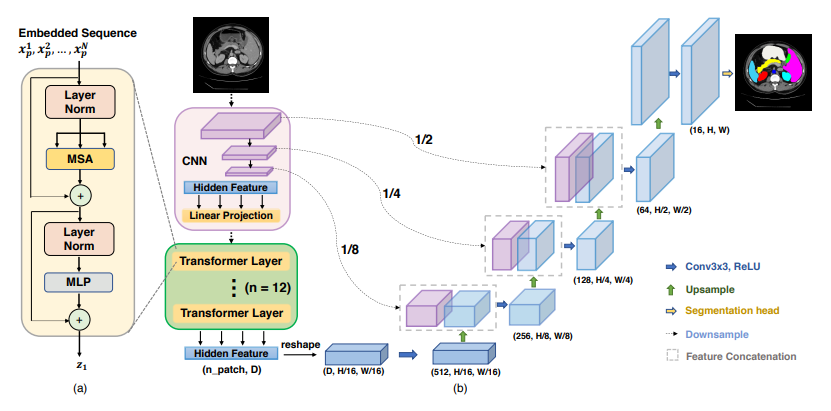

*Paper: https://arxiv.org/pdf/2102.04306.pdf*

*git-repo: https://github.com/yingkaisha/keras-unet-collection*

In [ ]:


def ViT_MLP(X, filter_num, activation='GELU', name='MLP'):
    '''
    The MLP block of ViT.
    
    ----------
    Dosovitskiy, A., Beyer, L., Kolesnikov, A., Weissenborn, D., Zhai, X., Unterthiner, 
    T., Dehghani, M., Minderer, M., Heigold, G., Gelly, S. and Uszkoreit, J., 2020. 
    An image is worth 16x16 words: Transformers for image recognition at scale. 
    arXiv preprint arXiv:2010.11929.
    
    Input
    ----------
        X: the input tensor of MLP, i.e., after MSA and skip connections
        filter_num: a list that defines the number of nodes for each MLP layer.
                        For the last MLP layer, its number of node must equal to the dimension of key.
        activation: activation of MLP nodes.
        name: prefix of the created keras layers.
        
    Output
    ----------
        V: output tensor.
    '''
    activation_func = eval(activation)
    
    for i, f in enumerate(filter_num):
        X = Dense(f, name='{}_dense_{}'.format(name, i))(X)
        X = activation_func(name='{}_activation_{}'.format(name, i))(X)
        
    return X


class patch_extract(Layer):
    '''
    Extract patches from the input feature map.
    
    patches = patch_extract(patch_size)(feature_map)
    
    ----------
    Dosovitskiy, A., Beyer, L., Kolesnikov, A., Weissenborn, D., Zhai, X., Unterthiner, 
    T., Dehghani, M., Minderer, M., Heigold, G., Gelly, S. and Uszkoreit, J., 2020. 
    An image is worth 16x16 words: Transformers for image recognition at scale. 
    arXiv preprint arXiv:2010.11929.
    
    Input
    ----------
        feature_map: a four-dimensional tensor of (num_sample, width, height, channel)
        patch_size: size of split patches (width=height)
        
    Output
    ----------
        patches: a two-dimensional tensor of (num_sample*num_patch, patch_size*patch_size)
                 where `num_patch = (width // patch_size) * (height // patch_size)`
                 
    For further information see: https://www.tensorflow.org/api_docs/python/tf/image/extract_patches
        
    '''
    
    def __init__(self, patch_size, **kwargs):
        super(patch_extract, self).__init__(**kwargs)
        self.patch_size = patch_size
        self.patch_size_x = patch_size[0]
        self.patch_size_y = patch_size[0]
    
    def call(self, images):
        
        batch_size = tf.shape(images)[0]
        
        patches = extract_patches(images=images,
                                  sizes=(1, self.patch_size_x, self.patch_size_y, 1),
                                  strides=(1, self.patch_size_x, self.patch_size_y, 1),
                                  rates=(1, 1, 1, 1), padding='VALID',)
        # patches.shape = (num_sample, patch_num, patch_num, patch_size*channel)
        
        patch_dim = patches.shape[-1]
        patch_num = patches.shape[1]
        patches = tf.reshape(patches, (batch_size, patch_num*patch_num, patch_dim))
        # patches.shape = (num_sample, patch_num*patch_num, patch_size*channel)
        
        return patches
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({'patch_size': self.patch_size,})
        return config
    
    @classmethod
    def from_config(cls, config):
        return cls(**config)
    
class patch_embedding(Layer):
    '''
    Embed patches to tokens.
    
    patches_embed = patch_embedding(num_patch, embed_dim)(pathes)
    
    ----------
    Dosovitskiy, A., Beyer, L., Kolesnikov, A., Weissenborn, D., Zhai, X., Unterthiner, 
    T., Dehghani, M., Minderer, M., Heigold, G., Gelly, S. and Uszkoreit, J., 2020. 
    An image is worth 16x16 words: Transformers for image recognition at scale. 
    arXiv preprint arXiv:2010.11929.
    
    Input
    ----------
        num_patch: number of patches to be embedded.
        embed_dim: number of embedded dimensions. 
        
    Output
    ----------
        embed: Embedded patches.
    
    For further information see: https://keras.io/api/layers/core_layers/embedding/
    
    '''
    
    def __init__(self, num_patch, embed_dim, **kwargs):
        
        super(patch_embedding, self).__init__(**kwargs)
        self.num_patch = num_patch
        self.embed_dim = embed_dim
        self.proj = Dense(embed_dim)
        self.pos_embed = Embedding(input_dim=num_patch, output_dim=embed_dim)

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'num_patch': self.num_patch,
            'embed_dim': self.embed_dim,
        })
        return config
    
    @classmethod
    def from_config(cls, config):
        return cls(**config)
    
    def call(self, patch):
        pos = tf.range(start=0, limit=self.num_patch, delta=1)
        embed = self.proj(patch) + self.pos_embed(pos)
        return embed


    
def ViT_block(V, num_heads, key_dim, filter_num_MLP, activation='GELU', name='ViT'):
    '''
    
    Vision transformer (ViT) block.
    
    ViT_block(V, num_heads, key_dim, filter_num_MLP, activation='GELU', name='ViT')
    
    ----------
    Dosovitskiy, A., Beyer, L., Kolesnikov, A., Weissenborn, D., Zhai, X., Unterthiner, 
    T., Dehghani, M., Minderer, M., Heigold, G., Gelly, S. and Uszkoreit, J., 2020. 
    An image is worth 16x16 words: Transformers for image recognition at scale. 
    arXiv preprint arXiv:2010.11929.
    
    Input
    ----------
        V: embedded input features.
        num_heads: number of attention heads.
        key_dim: dimension of the attention key (equals to the embeded dimensions).
        filter_num_MLP: a list that defines the number of nodes for each MLP layer.
                        For the last MLP layer, its number of node must equal to the dimension of key.
        activation: activation of MLP nodes.
        name: prefix of the created keras layers.
        
    Output
    ----------
        V: output tensor.
    
    '''
    # Multiheaded self-attention (MSA)
    V_atten = V # <--- skip
    V_atten = LayerNormalization(name='{}_layer_norm_1'.format(name))(V_atten)
    V_atten = MultiHeadAttention(num_heads=num_heads, key_dim=key_dim, 
                                 name='{}_atten'.format(name))(V_atten, V_atten)
    # Skip connection
    V_add = add([V_atten, V], name='{}_skip_1'.format(name)) # <--- skip
    
    # MLP
    V_MLP = V_add # <--- skip
    V_MLP = LayerNormalization(name='{}_layer_norm_2'.format(name))(V_MLP)
    V_MLP = ViT_MLP(V_MLP, filter_num_MLP, activation, name='{}_mlp'.format(name))
    # Skip connection
    V_out = add([V_MLP, V_add], name='{}_skip_2'.format(name)) # <--- skip
    
    return V_out


def transunet_2d_base(input_tensor, filter_num, stack_num_down=2, stack_num_up=2, 
                      embed_dim=768, num_mlp=3072, num_heads=12, num_transformer=12,
                      activation='ReLU', mlp_activation='GELU', batch_norm=False, pool=True, unpool=True, 
                      backbone=None, weights='imagenet', freeze_backbone=True, freeze_batch_norm=True, name='transunet'):
    '''
    The base of transUNET with an optional ImageNet-trained backbone.
    
    ----------
    Chen, J., Lu, Y., Yu, Q., Luo, X., Adeli, E., Wang, Y., Lu, L., Yuille, A.L. and Zhou, Y., 2021. 
    Transunet: Transformers make strong encoders for medical image segmentation. arXiv preprint arXiv:2102.04306.
    
    Input
    ----------
        input_tensor: the input tensor of the base, e.g., `keras.layers.Inpyt((None, None, 3))`.
        filter_num: a list that defines the number of filters for each \
                    down- and upsampling levels. e.g., `[64, 128, 256, 512]`.
                    The depth is expected as `len(filter_num)`.
        stack_num_down: number of convolutional layers per downsampling level/block. 
        stack_num_up: number of convolutional layers (after concatenation) per upsampling level/block.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interfaces, e.g., 'ReLU'.
        batch_norm: True for batch normalization.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.
        name: prefix of the created keras model and its layers.
        
        ---------- (keywords of ViT) ----------
        embed_dim: number of embedded dimensions.
        num_mlp: number of MLP nodes.
        num_heads: number of attention heads.
        num_transformer: number of stacked ViTs.
        mlp_activation: activation of MLP nodes.
        
        ---------- (keywords of backbone options) ----------
        backbone_name: the bakcbone model name. Should be one of the `tensorflow.keras.applications` class.
                       None (default) means no backbone. 
                       Currently supported backbones are:
                       (1) VGG16, VGG19
                       (2) ResNet50, ResNet101, ResNet152
                       (3) ResNet50V2, ResNet101V2, ResNet152V2
                       (4) DenseNet121, DenseNet169, DenseNet201
                       (5) EfficientNetB[0-7]
        weights: one of None (random initialization), 'imagenet' (pre-training on ImageNet), 
                 or the path to the weights file to be loaded.
        freeze_backbone: True for a frozen backbone.
        freeze_batch_norm: False for not freezing batch normalization layers.
        
    Output
    ----------
        X: output tensor.
    
    '''
    activation_func = eval(activation)
    
    X_skip = []
    depth_ = len(filter_num)
    
    # ----- internal parameters ----- #
    
    # patch size (fixed to 1-by-1)
    patch_size = 1
    
    # input tensor size
    input_size = input_tensor.shape[1]
    
    # encoded feature map size
    encode_size = input_size // 2**(depth_-1)
    
    # number of size-1 patches
    num_patches = encode_size ** 2 
    
    # dimension of the attention key (= dimension of embedings)
    key_dim = embed_dim
    
    # number of MLP nodes
    filter_num_MLP = [num_mlp, embed_dim]
    
    # ----- UNet-like downsampling ----- #
    
    # no backbone cases
    if backbone is None:

        X = input_tensor

        # stacked conv2d before downsampling
        X = CONV_stack(X, filter_num[0], stack_num=stack_num_down, activation=activation, 
                       batch_norm=batch_norm, name='{}_down0'.format(name))
        X_skip.append(X)

        # downsampling blocks
        for i, f in enumerate(filter_num[1:]):
            X = UNET_left(X, f, stack_num=stack_num_down, activation=activation, pool=pool, 
                          batch_norm=batch_norm, name='{}_down{}'.format(name, i+1))        
            X_skip.append(X)

    # backbone cases
    else:
        # handling VGG16 and VGG19 separately
        if 'VGG' in backbone:
            backbone_ = backbone_zoo(backbone, weights, input_tensor, depth_, freeze_backbone, freeze_batch_norm)
            # collecting backbone feature maps
            X_skip = backbone_([input_tensor,])
            depth_encode = len(X_skip)
            
        # for other backbones
        else:
            backbone_ = backbone_zoo(backbone, weights, input_tensor, depth_-1, freeze_backbone, freeze_batch_norm)
            # collecting backbone feature maps
            X_skip = backbone_([input_tensor,])
            depth_encode = len(X_skip) + 1


        # extra conv2d blocks are applied
        # if downsampling levels of a backbone < user-specified downsampling levels
        if depth_encode < depth_:

            # begins at the deepest available tensor  
            X = X_skip[-1]

            # extra downsamplings
            for i in range(depth_-depth_encode):
                i_real = i + depth_encode

                X = UNET_left(X, filter_num[i_real], stack_num=stack_num_down, activation=activation, pool=pool, 
                              batch_norm=batch_norm, name='{}_down{}'.format(name, i_real+1))
                X_skip.append(X)
        
    # subtrack the last tensor (will be replaced by the ViT output)
    X = X_skip[-1]
    X_skip = X_skip[:-1]

    # 1-by-1 linear transformation before entering ViT blocks
    X = Conv2D(filter_num[-1], 1, padding='valid', use_bias=False, name='{}_conv_trans_before'.format(name))(X)

    X = patch_extract((patch_size, patch_size))(X)
    X = patch_embedding(num_patches, embed_dim)(X)

    # stacked ViTs 
    for i in range(num_transformer):
        X = ViT_block(X, num_heads, key_dim, filter_num_MLP, activation=mlp_activation, 
                      name='{}_ViT_{}'.format(name, i))

    # reshape patches to feature maps
    X = tf.reshape(X, (-1, encode_size, encode_size, embed_dim))

    # 1-by-1 linear transformation to adjust the number of channels
    X = Conv2D(filter_num[-1], 1, padding='valid', use_bias=False, name='{}_conv_trans_after'.format(name))(X)

    X_skip.append(X)
    
    # ----- UNet-like upsampling ----- #
    
    # reverse indexing encoded feature maps
    X_skip = X_skip[::-1]
    # upsampling begins at the deepest available tensor
    X = X_skip[0]
    # other tensors are preserved for concatenation
    X_decode = X_skip[1:]
    depth_decode = len(X_decode)

    # reverse indexing filter numbers
    filter_num_decode = filter_num[:-1][::-1]

    # upsampling with concatenation
    for i in range(depth_decode):
        X = UNET_right(X, [X_decode[i],], filter_num_decode[i], stack_num=stack_num_up, activation=activation, 
                       unpool=unpool, batch_norm=batch_norm, name='{}_up{}'.format(name, i))

    # if tensors for concatenation is not enough
    # then use upsampling without concatenation 
    if depth_decode < depth_-1:
        for i in range(depth_-depth_decode-1):
            i_real = i + depth_decode
            X = UNET_right(X, None, filter_num_decode[i_real], stack_num=stack_num_up, activation=activation, 
                       unpool=unpool, batch_norm=batch_norm, concat=False, name='{}_up{}'.format(name, i_real))
            
    return X

def transunet_2d(input_size, filter_num, n_labels, stack_num_down=2, stack_num_up=2,
                 embed_dim=768, num_mlp = 3072, num_heads=12, num_transformer=12,
                 activation='ReLU', mlp_activation='GELU', output_activation='Softmax', batch_norm=False, pool=True, unpool=True, 
                 backbone=None, weights='imagenet', freeze_backbone=True, freeze_batch_norm=True, name='transunet'):
    '''
    TransUNET with an optional ImageNet-trained bakcbone.
    
    
    ----------
    Chen, J., Lu, Y., Yu, Q., Luo, X., Adeli, E., Wang, Y., Lu, L., Yuille, A.L. and Zhou, Y., 2021. 
    Transunet: Transformers make strong encoders for medical image segmentation. arXiv preprint arXiv:2102.04306.
    
    Input
    ----------
        input_size: the size/shape of network input, e.g., `(128, 128, 3)`.
        filter_num: a list that defines the number of filters for each \
                    down- and upsampling levels. e.g., `[64, 128, 256, 512]`.
                    The depth is expected as `len(filter_num)`.
        n_labels: number of output labels.
        stack_num_down: number of convolutional layers per downsampling level/block. 
        stack_num_up: number of convolutional layers (after concatenation) per upsampling level/block.
        activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interfaces, e.g., 'ReLU'.
        output_activation: one of the `tensorflow.keras.layers` or `keras_unet_collection.activations` interface or 'Sigmoid'.
                           Default option is 'Softmax'.
                           if None is received, then linear activation is applied.
        batch_norm: True for batch normalization.
        pool: True or 'max' for MaxPooling2D.
              'ave' for AveragePooling2D.
              False for strided conv + batch norm + activation.
        unpool: True or 'bilinear' for Upsampling2D with bilinear interpolation.
                'nearest' for Upsampling2D with nearest interpolation.
                False for Conv2DTranspose + batch norm + activation.                 
        name: prefix of the created keras model and its layers.
        
        ---------- (keywords of ViT) ----------
        embed_dim: number of embedded dimensions.
        num_mlp: number of MLP nodes.
        num_heads: number of attention heads.
        num_transformer: number of stacked ViTs.
        mlp_activation: activation of MLP nodes.
        
        ---------- (keywords of backbone options) ----------
        backbone_name: the bakcbone model name. Should be one of the `tensorflow.keras.applications` class.
                       None (default) means no backbone. 
                       Currently supported backbones are:
                       (1) VGG16, VGG19
                       (2) ResNet50, ResNet101, ResNet152
                       (3) ResNet50V2, ResNet101V2, ResNet152V2
                       (4) DenseNet121, DenseNet169, DenseNet201
                       (5) EfficientNetB[0-7]
        weights: one of None (random initialization), 'imagenet' (pre-training on ImageNet), 
                 or the path to the weights file to be loaded.
        freeze_backbone: True for a frozen backbone.
        freeze_batch_norm: False for not freezing batch normalization layers.
        
    Output
    ----------
        model: a keras model.
    
    '''
    
    activation_func = eval(activation)
        
    IN = Input(input_size)
    
    # base    
    X = transunet_2d_base(IN, filter_num, stack_num_down=stack_num_down, stack_num_up=stack_num_up, 
                          embed_dim=embed_dim, num_mlp=num_mlp, num_heads=num_heads, num_transformer=num_transformer,
                          activation=activation, mlp_activation=mlp_activation, batch_norm=batch_norm, pool=pool, unpool=unpool,
                          backbone=backbone, weights=weights, freeze_backbone=freeze_backbone, freeze_batch_norm=freeze_batch_norm, name=name)
    
    # output layer
    OUT = CONV_output(X, n_labels, kernel_size=1, activation=output_activation, name='{}_output'.format(name))
    
    # functional API model
    model = Model(inputs=[IN,], outputs=[OUT,], name='{}_model'.format(name))
    
    return model

model = transunet_2d((img_dims, img_dims, 3), [64, 128, 256, 512], 1, output_activation='sigmoid')
model.summary()


## ❌❌❌ MultiResUNet : Rethinking the U-Net architecture for multimodal biomedical image segmentation 



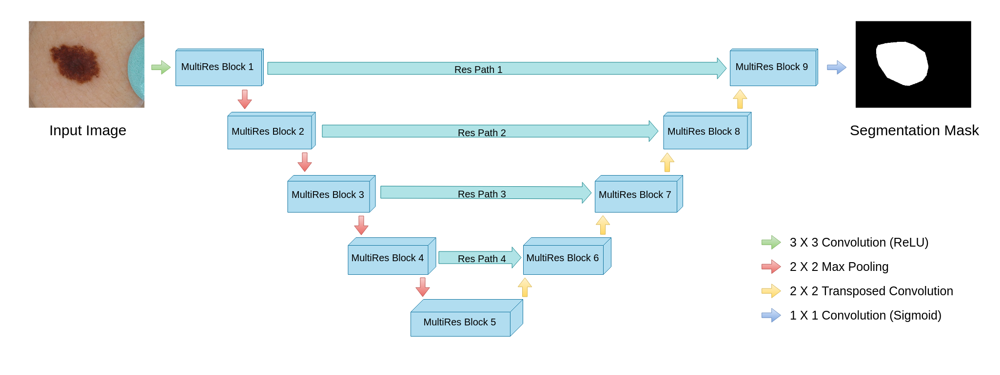

*Paper: https://www.sciencedirect.com/science/article/pii/S0893608019302503*   (Cited by 434)

*git-repo: https://github.com/nibtehaz/MultiResUNet*

In [ ]:
def conv2d_bn(x, filters, num_row, num_col, padding='same', strides=(1, 1), activation='relu', name=None):
    '''
    2D Convolutional layers
    
    Arguments:
        x {keras layer} -- input layer 
        filters {int} -- number of filters
        num_row {int} -- number of rows in filters
        num_col {int} -- number of columns in filters
    
    Keyword Arguments:
        padding {str} -- mode of padding (default: {'same'})
        strides {tuple} -- stride of convolution operation (default: {(1, 1)})
        activation {str} -- activation function (default: {'relu'})
        name {str} -- name of the layer (default: {None})
    
    Returns:
        [keras layer] -- [output layer]
    '''

    x = Conv2D(filters, (num_row, num_col), strides=strides, padding=padding, use_bias=False)(x)
    x = BatchNormalization(axis=3, scale=False)(x)

    if(activation == None):
        return x

    x = Activation(activation, name=name)(x)

    return x


def trans_conv2d_bn(x, filters, num_row, num_col, padding='same', strides=(2, 2), name=None):
    '''
    2D Transposed Convolutional layers
    
    Arguments:
        x {keras layer} -- input layer 
        filters {int} -- number of filters
        num_row {int} -- number of rows in filters
        num_col {int} -- number of columns in filters
    
    Keyword Arguments:
        padding {str} -- mode of padding (default: {'same'})
        strides {tuple} -- stride of convolution operation (default: {(2, 2)})
        name {str} -- name of the layer (default: {None})
    
    Returns:
        [keras layer] -- [output layer]
    '''

    x = Conv2DTranspose(filters, (num_row, num_col), strides=strides, padding=padding)(x)
    x = BatchNormalization(axis=3, scale=False)(x)
    
    return x


def MultiResBlock(U, inp, alpha = 1.67):
    '''
    MultiRes Block
    
    Arguments:
        U {int} -- Number of filters in a corrsponding UNet stage
        inp {keras layer} -- input layer 
    
    Returns:
        [keras layer] -- [output layer]
    '''

    W = alpha * U

    shortcut = inp

    shortcut = conv2d_bn(shortcut, int(W*0.167) + int(W*0.333) +
                         int(W*0.5), 1, 1, activation=None, padding='same')

    conv3x3 = conv2d_bn(inp, int(W*0.167), 3, 3,
                        activation='relu', padding='same')

    conv5x5 = conv2d_bn(conv3x3, int(W*0.333), 3, 3,
                        activation='relu', padding='same')

    conv7x7 = conv2d_bn(conv5x5, int(W*0.5), 3, 3,
                        activation='relu', padding='same')

    out = concatenate([conv3x3, conv5x5, conv7x7], axis=3)
    out = BatchNormalization(axis=3)(out)

    out = add([shortcut, out])
    out = Activation('relu')(out)
    out = BatchNormalization(axis=3)(out)

    return out


def ResPath(filters, length, inp):
    '''
    ResPath
    
    Arguments:
        filters {int} -- [description]
        length {int} -- length of ResPath
        inp {keras layer} -- input layer 
    
    Returns:
        [keras layer] -- [output layer]
    '''


    shortcut = inp
    shortcut = conv2d_bn(shortcut, filters, 1, 1,
                         activation=None, padding='same')

    out = conv2d_bn(inp, filters, 3, 3, activation='relu', padding='same')

    out = add([shortcut, out])
    out = Activation('relu')(out)
    out = BatchNormalization(axis=3)(out)

    for i in range(length-1):

        shortcut = out
        shortcut = conv2d_bn(shortcut, filters, 1, 1,
                             activation=None, padding='same')

        out = conv2d_bn(out, filters, 3, 3, activation='relu', padding='same')

        out = add([shortcut, out])
        out = Activation('relu')(out)
        out = BatchNormalization(axis=3)(out)

    return out


def MultiResUnet(height=img_dims, width=img_dims, n_channels=3):
    '''
    MultiResUNet
    
    Arguments:
        height {int} -- height of image 
        width {int} -- width of image 
        n_channels {int} -- number of channels in image
    
    Returns:
        [keras model] -- MultiResUNet model
    '''


    inputs = Input((height, width, n_channels))

    mresblock1 = MultiResBlock(32, inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2))(mresblock1)
    mresblock1 = ResPath(32, 4, mresblock1)

    mresblock2 = MultiResBlock(32*2, pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(mresblock2)
    mresblock2 = ResPath(32*2, 3, mresblock2)

    mresblock3 = MultiResBlock(32*4, pool2)
    pool3 = MaxPooling2D(pool_size=(2, 2))(mresblock3)
    mresblock3 = ResPath(32*4, 2, mresblock3)

    mresblock4 = MultiResBlock(32*8, pool3)
    pool4 = MaxPooling2D(pool_size=(2, 2))(mresblock4)
    mresblock4 = ResPath(32*8, 1, mresblock4)

    mresblock5 = MultiResBlock(32*16, pool4)

    up6 = concatenate([Conv2DTranspose(
        32*8, (2, 2), strides=(2, 2), padding='same')(mresblock5), mresblock4], axis=3)
    mresblock6 = MultiResBlock(32*8, up6)

    up7 = concatenate([Conv2DTranspose(
        32*4, (2, 2), strides=(2, 2), padding='same')(mresblock6), mresblock3], axis=3)
    mresblock7 = MultiResBlock(32*4, up7)

    up8 = concatenate([Conv2DTranspose(
        32*2, (2, 2), strides=(2, 2), padding='same')(mresblock7), mresblock2], axis=3)
    mresblock8 = MultiResBlock(32*2, up8)

    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(
        2, 2), padding='same')(mresblock8), mresblock1], axis=3)
    mresblock9 = MultiResBlock(32, up9)

    conv10 = conv2d_bn(mresblock9, 1, 1, 1, activation='sigmoid')
    
    model = Model(inputs=[inputs], outputs=[conv10])

    return model


if seg_notclass:
  model = MultiResUnet()
  model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                      beta_1=0.9,
                                                      beta_2=0.999,
                                                      epsilon=None,
                                                      amsgrad=False),
                metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])

  model.summary()  

## MSRF-Net: A Multi-Scale Residual Fusion Network for Biomedical Image Segmentation
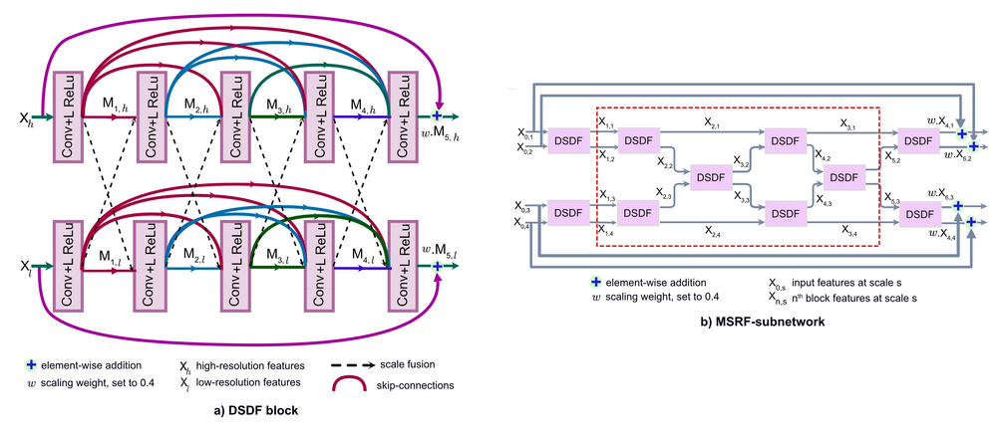

*Paper:  https://arxiv.org/pdf/2105.07451.pdf *

*git-repo:  https://github.com/NoviceMAn-prog/MSRF-Net *


In [ ]:
from keras.initializers import RandomNormal

def spatial_att_block(x,intermediate_channels):
    out = Conv2D(intermediate_channels,kernel_size=(1,1),strides=(1,1),padding='same')(x)
    out = BatchNormalization()(out)
    out = Activation('relu')(out)
    out = Conv2D(1,kernel_size=(1,1),strides=(1,1),padding='same')(out)
    out = Activation('sigmoid')(out)
    return out


def resblock(x,ip_channels,op_channels,stride=(1,1)):
    residual = x
    out = Conv2D(op_channels,kernel_size=(3,3),strides=stride,padding='same')(x)
    out = BatchNormalization()(out)
    out = Activation('relu')(out)
    out = Conv2D(op_channels,kernel_size=(3,3),strides=stride,padding='same')(x)
    out = BatchNormalization()(out)
    out = Add()([out,residual])
    out = Activation('relu')(out)
    return out

def dual_att_blocks(skip,prev,out_channels):
    up = Conv2DTranspose(out_channels,4, strides=(2, 2), padding='same')(prev)
    up = BatchNormalization()(up)
    up = Activation('relu')(up)
    inp_layer = Concatenate()([skip,up])
    inp_layer = Conv2D(out_channels,3,strides=(1,1),padding='same')(inp_layer)
    inp_layer = BatchNormalization()(inp_layer)
    inp_layer = Activation('relu')(inp_layer)
    se_out = se_block(inp_layer,out_channels)
    sab = spatial_att_block(inp_layer,out_channels//4)
    #sab = Add()([sab,1])
    sab = Lambda(lambda y : y+1)(sab)
    final = Multiply()([sab,se_out])
    return final
    

def gsc(input_features,gating_features,in_channels,out_channels,kernel_size=1,stride=1,dilation=1,groups=1):
    x = Concatenate()([input_features,gating_features])
    x = BatchNormalization()(x)
    x = Conv2D(in_channels+1, (1,1), strides =(1,1), padding='same')(x)
    x = Activation('relu')(x)
    x = Conv2D(1,kernel_size=(1,1),strides=1,padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('sigmoid')(x)
    #x = sigmoid(x)
    return x

def se_block(in_block, ch, ratio=16):
    x = GlobalAveragePooling2D()(in_block)
    x = Dense(ch//ratio, activation='relu')(x)
    x = Dense(ch, activation='sigmoid')(x)
    return Multiply()([in_block, x])

def Attention_B(X, G, k):
    FL = int(X.shape[-1])
    init = RandomNormal(stddev=0.02)
    theta = Conv2D(k,(2,2), strides = (2,2), padding='same')(X)
    Phi = Conv2D(k, (1,1), strides =(1,1), padding='same', use_bias=True)(G)
   
    ADD = Add()([theta, Phi])
   
    #ADD = LeakyReLU(alpha=0.1)(ADD)
    ADD = Activation('relu')(ADD)
   
    #Psi = Conv2D(FL,(1,1), strides = (1,1), padding="same",kernel_initializer=init)(ADD)
    Psi = Conv2D(1,(1,1), strides = (1,1), padding="same",kernel_initializer=init)(ADD)
    Psi = Activation('sigmoid')(Psi)
    Up = Conv2DTranspose(1, (2,2), strides=(2, 2), padding='valid')(Psi)
   
    #Psi = Activation('tanh')(Psi)
   
    #Up = Conv2DTranspose(FL, (2,2), strides=(2, 2), padding='valid')(Psi)
   
    Final = Multiply()([X, Up])
    #Final = Conv2D(1, (1,1), strides = (1,1), padding="same",kernel_initializer=init)(Final)
    #Final = Conv2D(FL, (1,1), strides = (1,1), padding="same",kernel_initializer=init)(Final)
    Final = BatchNormalization(axis=-1, momentum=0.99, epsilon=1e-5)(Final)
    print(Final.shape)
    return Final
def Unet3(input_shape,n_filters,kernel=(3,3),strides=(1,1),pad='same'):
    x = input_shape
    conv1 = Conv2D(n_filters,kernel_size=kernel,strides=strides,padding=pad)(input_shape)
    conv1 = BatchNormalization(axis=-1)(conv1)
    conv1 = LeakyReLU(alpha=0.1)(conv1)
   
    conv2 = Conv2D(n_filters,kernel_size=kernel,strides=strides,padding=pad)(conv1)
    conv2 = BatchNormalization(axis=-1)(conv2)
    conv2 =  LeakyReLU(alpha=0.1)(conv2)
   
    x = Conv2D(n_filters,kernel_size = (1,1),strides = (1,1),padding = 'same')(x)
   
    return Add()([x,conv2])
def Up3(input1,input2,kernel=(3,3),stride=(1,1), pad='same'):
    #up = UpSampling2D(2)(input2)
    up = Conv2DTranspose(int(input1.shape[-1]),(1, 1), strides=(2, 2), padding='same')(input2)
    up = Concatenate()([up,input1])
    
    #up1 = BatchNormalization()(up)
    #up1 =  LeakyReLU(alpha=0.25)(up1)
    #up1 = Conv2D(int(input1.shape[-1]),kernel_size=(3,3),strides=(1,1),padding='same')(up1)
    #up1 = BatchNormalization()(up1)
    #up1 =  LeakyReLU(alpha=0.25)(up1)
    #up1 = Conv2D(int(input1.shape[-1]),kernel_size=(3,3),strides=(1,1),padding='same')(up1)
    #up2 = Add()([up1,up])
    return up
    
    return Unet3(up,int(input1.shape[-1]),kernel,stride,pad)
def gatingSig(input_shape,n_filters,kernel=(1,1),strides=(1,1),pad='same'):
    conv = Conv2D(n_filters,kernel_size=kernel,strides=strides,padding=pad)(input_shape)
    conv = BatchNormalization(axis=-1)(conv)
    return LeakyReLU(alpha=0.1)(conv)

def DSup(x, var):
    d = Conv2D(1,(1,1), strides=(1,1), padding = "same")(x)
    d = UpSampling2D(var)(d)
    return d

def DSup1(x, var):
    d = Conv2D(1,(2,2), strides=(2,2), padding = "same")(x)
    d = UpSampling2D(var)(d)
    return d

#Keras
ALPHA = 0.5
BETA = 0.5
GAMMA=1


def TverskyLoss(targets, inputs, alpha=ALPHA, beta=BETA, smooth=1e-6):
        
        #flatten label and prediction tensors
        inputs = K.flatten(inputs)
        targets = K.flatten(targets)
        
        #True Positives, False Positives & False Negatives
        TP = K.sum((inputs * targets))
        FP = K.sum(((1-targets) * inputs))
        FN = K.sum((targets * (1-inputs)))
       
        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
        
        return 1 - Tversky

def FocalTverskyLoss(targets, inputs, alpha=ALPHA, beta=BETA, gamma=GAMMA, smooth=1e-6):
    
        #flatten label and prediction tensors
        inputs = K.flatten(inputs)
        targets = K.flatten(targets)
        
        #True Positives, False Positives & False Negatives
        TP = K.sum((inputs * targets))
        FP = K.sum(((1-targets) * inputs))
        FN = K.sum((targets * (1-inputs)))
               
        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
        FocalTversky = K.pow((1 - Tversky), gamma)
        
        return FocalTversky


def msrf(input_size=(img_dims,img_dims,3), input_size_2=(img_dims,img_dims,1)):
    n_labels=1
    feature_scale=8
    #input_shape= Image.shape
    filters = [64, 128, 256, 512,1024]
    atrous_rates = (6, 12, 18)
    n_labels=1
    feature_scale=8
    #input_shape= Image.shape
    filters = [64, 128, 256, 512,1024]

    inputs_img = Input(input_size)
    # canny = Input(input_size_2,name='checkdim')
    n11 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs_img)
    n11 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n11)
    n11 = BatchNormalization()(n11)
    n11 = se_block(n11,32)

    
    n12 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n11)
    n12 = BatchNormalization()(n12)
    #here
    n12 = Add()([n12,n11])
    pred1 = Conv2D(1,(1,1), strides=(1,1), padding="same",activation='sigmoid')(n12)
    
    pool1 = MaxPooling2D(pool_size=(2, 2))(n11)
    pool1 = Dropout(0.2)(pool1)
    n21 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    n21 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n21)
    n21 = BatchNormalization()(n21)
    n21 = se_block(n21,64)
    #here
    
    
    n22 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n21)
    n22 = BatchNormalization()(n22)
    n22 = Add()([n22,n21])
    
    pool2 = MaxPooling2D(pool_size=(2, 2))(n21)
    pool2 = Dropout(0.2)(pool2)
    
    n31 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    n31 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n31)
    n31 = BatchNormalization()(n31)
    n31 = se_block(n31,128)
   
    
    n32 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n31)
    n32 = BatchNormalization()(n32)
    n32 = Add()([n32,n31])
    
    pool3 = MaxPooling2D(pool_size=(2, 2))(n31)
    pool3 = Dropout(0.2)(pool3)
    n41 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    n41 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n41)
    n41 = BatchNormalization()(n41)
    #############################################ASPP
    shape_before = n41.shape
    
    
    
    #############################################
    
    n12,n22 = RDDB(n11,n21,32,64,16)
    pred2 = Conv2D(1,(1,1), strides=(1,1), padding="same",activation='sigmoid')(n12)
    
    n32,n42 = RDDB(n31,n41,128,256,64)
    
    n12,n22 = RDDB(n12,n22,32,64,16)
    pred3 = Conv2D(1,(1,1), strides=(1,1), padding="same",activation='sigmoid')(n12)
    
    n32,n42 = RDDB(n32,n42,128,256,64)
    
    n22,n32 = RDDB(n22,n32,64,128,32)
    
    
    n13,n23 = RDDB(n12,n22,32,64,16)
    
    n33,n43 = RDDB(n32,n42,128,256,64)

    n23,n33 = RDDB(n23,n33,64,128,32)

    n13,n23 = RDDB(n13,n23,32,64,16)
    
    n33,n43 = RDDB(n33,n43,128,256,64)

    n13 = Lambda(lambda x: x * 0.4)(n13)
    n23 = Lambda(lambda x: x * 0.4)(n23)
    n33 = Lambda(lambda x: x * 0.4)(n33)
    n43 = Lambda(lambda x: x * 0.4)(n43)

   
    n13,n23 = Add()([n11,n13]),Add()([n21,n23])
    n33,n43 = Add()([n31,n33]),Add()([n41,n43])

    ###############Shape Stream

    
    d0 = Conv2D(32,kernel_size=(1,1),strides=(1,1),padding='same')(n23)
    ss = keras.layers.UpSampling2D(size=(2, 2), data_format=None, interpolation='bilinear')(d0)
    ss = resblock(ss,32,32)
    c3 = Conv2D(1, kernel_size=(1,1),strides=(1,1),padding='same')(n33)
    c3 = keras.layers.UpSampling2D(size=(4, 4), data_format=None, interpolation='bilinear')(c3)
    ss = Conv2D(16,kernel_size=(1,1),strides=(1,1),padding='same')(ss)
    ss = gsc(ss,c3,32,32)
    ss = resblock(ss,16,16)
    ss = Conv2D(8,kernel_size=(1,1),strides=(1,1),padding='same')(ss)
    c4 = Conv2D(1, kernel_size=(1,1),strides=(1,1),padding='same')(n43)
    c4 = keras.layers.UpSampling2D(size=(8, 8), data_format=None, interpolation='bilinear')(c4)
    ss = gsc(ss,c4,16,16)
    ss = resblock(ss,8,8)
    ss = Conv2D(4,kernel_size=(1,1),strides=(1,1),padding='same')(ss)
    ss = Conv2D(1,kernel_size=(1,1),padding='same')(ss)
    edge_out = Activation('sigmoid',name='edge_out')(ss)
    #######canny edge
    #canny = cv2.Canny(np.asarray(inputs),10,100)
    # cat = Concatenate()([edge_out,canny])
    cw = Conv2D(1,kernel_size=(1,1),padding='same')(edge_out)
    acts = Activation('sigmoid')(cw)
    edge = Conv2D(1, kernel_size=(1,1),strides=(1,1),padding='same')(acts)
    edge = BatchNormalization()(edge)
    edge = Activation('relu')(edge)
    
    
    #########################
    
   
    n34_preinput=Attention_B(n33,n43,128)
    n34 = Up3(n34_preinput,n43)
    n34_d = dual_att_blocks(n33,n43,128)
    n34_t = Concatenate()([n34,n34_d])
    n34_t = Conv2D(128,kernel_size=(1,1),strides=(1,1),padding='same')(n34_t)
    n34_2 = BatchNormalization()(n34_t)
    n34_2 = Activation('relu')(n34_2)
    n34_2 = Conv2D(128,kernel_size=(3,3),strides=(1,1),padding='same')(n34_2)
    n34_2 = BatchNormalization()(n34_2)
    n34_2 = Activation('relu')(n34_2)
    n34_2 = Conv2D(128,kernel_size=(3,3),strides=(1,1),padding='same')(n34_2)
    n34 = Add()([n34_2,n34_t])
    pred4 = Conv2D(1,kernel_size=(1,1),strides=(1,1),padding='same',activation="sigmoid")(n34)
    pred4 = UpSampling2D(size=(4,4),interpolation='bilinear',name='pred4')(pred4)

    
   
    n24_preinput =Attention_B(n23,n34,64)
    n24 = Up3(n24_preinput,n34)
    n24_d = dual_att_blocks(n23,n34,64)
    n24_t = Concatenate()([n24,n24_d])
    n24_t = Conv2D(64,kernel_size=(1,1),strides=(1,1),padding='same')(n24_t)
    n24_2 = BatchNormalization()(n24_t)
    n24_2 = Activation('relu')(n24_2)
    n24_2 = Conv2D(64,kernel_size=(3,3),strides=(1,1),padding='same')(n24_2)
    n24_2 = BatchNormalization()(n24_2)
    n24_2 = Activation('relu')(n24_2)
    n24_2 = Conv2D(64,kernel_size=(3,3),strides=(1,1),padding='same')(n24_2)
    n24 = Add()([n24_2,n24_t])
    pred2 = Conv2D(1,kernel_size=(1,1),strides=(1,1),padding="same" , activation="sigmoid")(n24)
    pred2 = UpSampling2D(size=(2,2),interpolation='bilinear',name='pred2')(pred2)
   
    n14_preinput = Conv2DTranspose(32,4, strides=(2, 2), padding='same')(n24)
    n14_input = Concatenate()([n14_preinput,n13])
    n14_input = Conv2D(32, 1, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n14_input)
    n14 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n14_input)
    n14 = BatchNormalization()(n14)
    n14 = Add()([n14,n14_input])
    n14 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(n14)
    x = Conv2D(1,(1,1), strides=(1,1), padding="same",activation='sigmoid',name='x')(n14)
    model = Model(inputs= [inputs_img],outputs = [x])
    return model

def RDDB(x,y,nf1=128,nf2=1212,gc=64,bias=True):
    x1 = Conv2D(filters=gc, kernel_size=3, strides=1,padding='same', use_bias=bias)(x)
    x1 = LeakyReLU(alpha=0.25)(x1)
    
    y1 = Conv2D(filters=gc, kernel_size=3, strides=1,padding='same', use_bias=bias)(y)
    y1 = LeakyReLU(alpha=0.25)(y)
    
    x1c = Conv2D(filters=gc, kernel_size=3, strides=2,padding='same', use_bias=bias)(x)
    x1c = LeakyReLU(alpha=0.25)(x1c)
    y1t = Conv2DTranspose(filters=gc, kernel_size=3, strides=2,padding='same', use_bias=bias)(y)
    y1t = LeakyReLU(alpha=0.25)(y1t)
    
    
    x2_input = concatenate([x,x1,y1t],axis=-1)
    x2 = Conv2D(filters= gc, kernel_size=3,strides=1, padding='same',use_bias=bias)(x2_input)
    x2 = LeakyReLU(alpha=0.25)(x2)
    
    y2_input = concatenate([y,y1,x1c],axis=-1)
    y2 = Conv2D(filters= gc, kernel_size=3,strides=1, padding='same',use_bias=bias)(y2_input)
    y2 = LeakyReLU(alpha=0.25)(y2)
    
    x2c = Conv2D(filters=gc, kernel_size=3, strides=2,padding='same', use_bias=bias)(x1)
    x2c = LeakyReLU(alpha=0.25)(x2c)
    y2t = Conv2DTranspose(filters=gc, kernel_size=3, strides=2,padding='same', use_bias=bias)(y1)
    y2t = LeakyReLU(alpha=0.25)(y2t)
    
    
    
    x3_input = concatenate([x,x1,x2,y2t] , axis=-1)
    x3 = Conv2D(filters= gc, kernel_size=3,strides=1, padding='same', use_bias=bias)(x3_input)
    x3 = LeakyReLU(alpha=0.25)(x3)
    
    y3_input = concatenate([y,y1,y2,x2c] , axis=-1)
    y3 = Conv2D(filters= gc, kernel_size=3,strides=1, padding='same', use_bias=bias)(y3_input)
    y3 = LeakyReLU(alpha=0.25)(y3)
    
    x3c = Conv2D(filters=gc, kernel_size=3, strides=2,padding='same', use_bias=bias)(x3)
    x3c = LeakyReLU(alpha=0.25)(x3c)
    y3t = Conv2DTranspose(filters=gc, kernel_size=3, strides=2,padding='same', use_bias=bias)(y3)
    y3t = LeakyReLU(alpha=0.25)(y3t)
    
    
        
    x4_input = concatenate([x,x1,x2,x3,y3t] , axis=-1)
    x4 = Conv2D(filters= gc, kernel_size=3,strides=1, padding='same', use_bias=bias)(x4_input)
    x4 = LeakyReLU(alpha=0.25)(x4)
    
    
    y4_input = concatenate([y,y1,y2,y3,x3c] , axis=-1)
    y4 = Conv2D(filters= gc, kernel_size=3,strides=1, padding='same', use_bias=bias)(y4_input)
    y4 = LeakyReLU(alpha=0.25)(y4)
    
    x4c = Conv2D(filters=gc, kernel_size=3, strides=2,padding='same', use_bias=bias)(x4)
    x4c = LeakyReLU(alpha=0.25)(x4c)
    y4t = Conv2DTranspose(filters=gc, kernel_size=3, strides=2,padding='same', use_bias=bias)(y4)
    y4t = LeakyReLU(alpha=0.25)(y4t)
    
        
    x5_input = concatenate([x,x1,x2,x3,x4,y4t] , axis=-1)
    x5 = Conv2D(filters= nf1, kernel_size=3,strides=1, padding='same', use_bias=bias)(x5_input)
    x5 = LeakyReLU(alpha=0.25)(x5)
    
    y5_input = concatenate([y,y1,y2,y3,y4,x4c] , axis=-1)
    y5 = Conv2D(filters= nf2, kernel_size=3,strides=1, padding='same', use_bias=bias)(y5_input)
    y5 = LeakyReLU(alpha=0.25)(y5)
        
    x5 = Lambda(lambda x: x * 0.4)(x5)
    y5 = Lambda(lambda x: x * 0.4)(y5)
        
    return Add()([x5,x]),Add()([y5,y])



if seg_notclass:
  model = msrf()
  model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                      beta_1=0.9,
                                                      beta_2=0.999,
                                                      epsilon=None,
                                                      amsgrad=False),
                metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])

  model.summary()


In [ ]:
# plot_model(model)

## PraNet: Parallel Reverse Attention Network for Polyp Segmentation >>(2 variants)
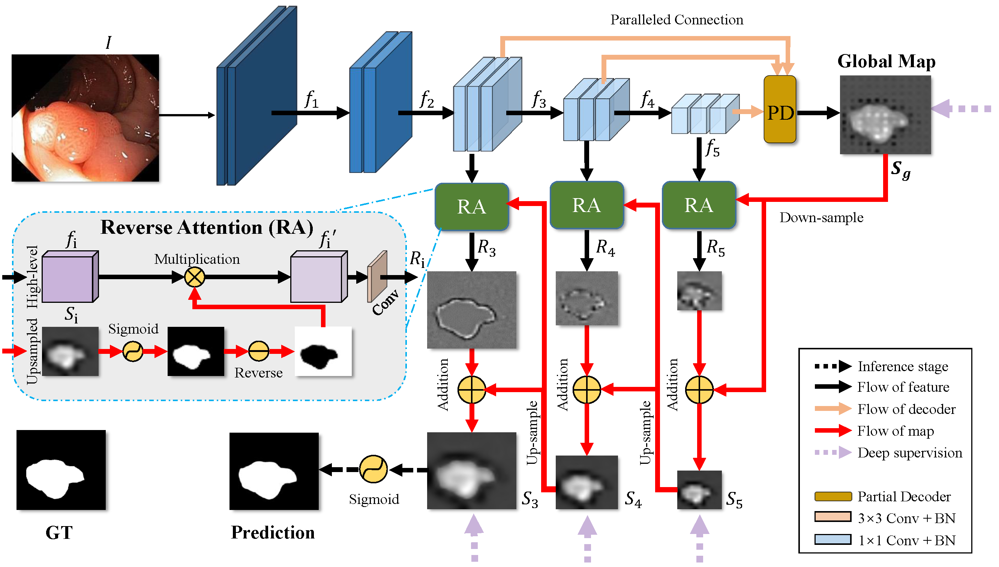

*Paper : https://arxiv.org/pdf/2006.11392.pdf*

*git-repo: https://github.com/Thehunk1206/PRANet-Polyps-Segmentation* 

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.layers.experimental import preprocessing

backbone = ['resnet50', 'mobilenetv2']

select_bacbone = 1    #>>>>>>>>>>>>>>>> select 0 or 1


class FE_backbone():
    def __init__(self, model_architecture: str = 'resnet50' , inshape: tuple = (352, 352, 3), is_trainable: bool = True):
        self.inshape = inshape
        self._supported_arch = ['resnet50', 'mobilenetv2']
        self.model_architecture = model_architecture
        if self.model_architecture not in self._supported_arch:
            tf.print(
                f"Model Architecture should be one of {self._supported_arch}")
            sys.exit()

        self.is_trainable = is_trainable
        self.resnet_feature_extractor_layer_name = [
            'conv2_block3_out',  # 256
            'conv3_block4_out',  # 512
            'conv4_block6_out',  # 1024
            'conv5_block3_out',  # 2048
        ]
        self.mobilenet_feature_extractor_layer_name = [
            'block_3_expand_relu',  # 56x56x144
            'block_6_expand_relu',  # 28x28x192
            'block_13_expand_relu',  # 14x14x576
            'out_relu',             # 7x7x1280
        ]

        if self.model_architecture == 'resnet50':
            self.backbone = ResNet50(
                include_top=False, input_shape=self.inshape
            )

        if self.model_architecture == 'mobilenetv2':
            self.backbone = MobileNetV2(
                include_top=False, input_shape=self.inshape
            )

        self.backbone.trainable = self.is_trainable

    def get_fe_backbone(self) -> tf.keras.Model:

        layer_out = []
        if self.model_architecture == 'resnet50':
            for layer_name in self.resnet_feature_extractor_layer_name:
                layer_out.append(self.backbone.get_layer(layer_name).output)

        if self.model_architecture == 'mobilenetv2':
            for layer_name in self.mobilenet_feature_extractor_layer_name:
                layer_out.append(self.backbone.get_layer(layer_name).output)

        fe_backbone_model = tf.keras.models.Model(
            inputs=self.backbone.input, outputs=layer_out, name='resnet50_include_top_false' if self.model_architecture == 'resnet50' else 'mobilenetv2_include_top_false')

        return fe_backbone_model




class ConvModule(tf.keras.layers.Layer):
    def __init__(
        self, filters: int,
        kernel_size: tuple,
        strides: tuple = (1, 1),
        padding: str = "same",
        dilation_rate: tuple = (1, 1),
    ):
        super(ConvModule, self).__init__()
        self.filters = filters
        self.kernel_size = kernel_size
        self.strides = strides
        self.padding = padding
        self.dilation_rate = dilation_rate

        self.conv = tf.keras.layers.Conv2D(
            filters=self.filters,
            kernel_size=self.kernel_size,
            strides=self.strides,
            padding=self.padding,
            dilation_rate=self.dilation_rate
        )

        self.bn = tf.keras.layers.BatchNormalization()

        self.relu = tf.keras.layers.ReLU()

    def call(self, x: tf.Tensor, training: bool = False) -> tf.Tensor:
        x = self.conv(x)
        x = self.bn(x, training=training)
        x = self.relu(x)

        return x

    def get_config(self) -> dict:
        config = super(ConvModule, self).get_config()
        config.update({
            "filters": self.filters,
            "kernel_size": self.kernel_size,
            "strides": self.strides,
            "padding": self.padding,
            "dilation_rate": self.dilation_rate
        })
        return config

    @classmethod
    def from_config(cls, config):
        return super().from_config(config)


class ReverseAttention(tf.keras.layers.Layer):
    def __init__(self, name: str, filters: int = 64, kernel_size: tuple = (3, 3), branch: str = 'ssmap', **kwargs):
        super(ReverseAttention, self).__init__(name=name, **kwargs)
        assert branch in ['ssmap', 'gsmap']
        self.filters = filters
        self.kernel_size = kernel_size
        self.branch = branch

        if self.branch == 'ssmap':
            self.ssmap_conv = tf.keras.Sequential([
                ConvModule(filters=self.filters, kernel_size=(1, 1)),
                ConvModule(filters=self.filters, kernel_size=self.kernel_size),
                tf.keras.layers.ReLU(),
                ConvModule(filters=self.filters, kernel_size=self.kernel_size),
                tf.keras.layers.ReLU(),
                ConvModule(filters=1, kernel_size=self.kernel_size)
            ])

        if self.branch == 'gsmap':
            self.gsmap_conv = tf.keras.Sequential([
                ConvModule(filters=self.filters, kernel_size=(1, 1)),
                ConvModule(filters=self.filters, kernel_size=self.kernel_size),
                tf.keras.layers.ReLU(),
                ConvModule(filters=self.filters, kernel_size=self.kernel_size),
                tf.keras.layers.ReLU(),
                ConvModule(filters=self.filters, kernel_size=self.kernel_size),
                tf.keras.layers.ReLU(),
                ConvModule(filters=1, kernel_size=(1, 1))
            ])

    def call(self, side_feat: tf.Tensor, saliency_m: tf.Tensor) -> tf.Tensor:
        x = tf.sigmoid(saliency_m)
        x = -1*(x)+1
        x = tf.math.multiply(x, side_feat)

        if self.branch == 'ssmap':
            ra_feat = self.ssmap_conv(x)
        else:
            ra_feat = self.gsmap_conv(x)
        ra_feat = ra_feat + saliency_m

        return ra_feat

    def get_config(self) -> dict:
        config = super().get_config()
        config.update({
            "filters": self.filters,
            "kernel_size": self.kernel_size,
            "branch" : self.branch
        })

        return config

    @classmethod
    def from_config(cls, config):
        return super().from_config(config)



class PartialDecoder(tf.keras.layers.Layer):
    def __init__(self, filters: int, name:str):
        super(PartialDecoder, self).__init__(name=name)
        self.filters = filters

        self.upsampling = tf.keras.layers.UpSampling2D(
            size=(2, 2), interpolation='bilinear')
        self.conv_up1 = ConvModule(filters=filters, kernel_size=(3, 3))
        self.conv_up2 = ConvModule(filters=filters, kernel_size=(3, 3))
        self.conv_up3 = ConvModule(filters=filters, kernel_size=(3, 3))
        self.conv_up4 = ConvModule(filters=filters, kernel_size=(3, 3))
        self.conv_up5 = ConvModule(filters=2*filters, kernel_size=(3, 3))

        self.conv_concat_1 = ConvModule(filters=2*filters, kernel_size=(3, 3))
        self.conv_concat_2 = ConvModule(filters=3*filters, kernel_size=(3, 3))

        self.conv4 = ConvModule(filters=3*filters, kernel_size=(3, 3))
        self.conv5 = tf.keras.layers.Conv2D(filters=1, kernel_size=(1, 1))

    def call(self, rfb_feat1: tf.Tensor, rfb_feat2: tf.Tensor, rfb_feat3: tf.Tensor) -> tf.Tensor:
        rfb_feat1 = tf.nn.relu(rfb_feat1)
        rfb_feat2 = tf.nn.relu(rfb_feat2)
        rfb_feat3 = tf.nn.relu(rfb_feat3)

        x1_1 = rfb_feat1
        x2_1 = self.conv_up1(self.upsampling(rfb_feat1)) * rfb_feat2
        x3_1 = self.conv_up2(self.upsampling(self.upsampling(rfb_feat1)))  \
            * self.conv_up3(self.upsampling(rfb_feat2)) * rfb_feat3

        x2_2 = tf.concat([x2_1, self.conv_up4(
            self.upsampling(x1_1))], axis=-1)
        x2_2 = self.conv_concat_1(x2_2)

        x3_2 = tf.concat([x3_1, self.conv_up5(self.upsampling(x2_2))], axis=-1)
        x3_2 = self.conv_concat_2(x3_2)

        x = self.conv4(x3_2)
        x = self.conv5(x)

        return x

    def get_config(self) -> dict:
        config = super().get_config()
        config.update({"filters": self.filters})
        return config

    @classmethod
    def from_config(cls, config):
        return super().from_config(config)


class RFB(tf.keras.layers.Layer):
    def __init__(self, filters: int, name: str):
        super(RFB, self).__init__(name=name)
        self.filters = filters

        self.branch_1 = tf.keras.Sequential([
            ConvModule(filters=self.filters, kernel_size=(1, 1))
        ])
        self.branch_2 = tf.keras.Sequential([
            ConvModule(filters=self.filters, kernel_size=(1, 1)),
            ConvModule(filters=self.filters, kernel_size=(1, 3)),
            ConvModule(filters=self.filters, kernel_size=(3, 1)),
            ConvModule(filters=self.filters, kernel_size=(
                3, 3), dilation_rate=(3, 3))
        ])

        self.branch_3 = tf.keras.Sequential([
            ConvModule(filters=self.filters, kernel_size=(1, 1)),
            ConvModule(filters=self.filters, kernel_size=(1, 5)),
            ConvModule(filters=self.filters, kernel_size=(5, 1)),
            ConvModule(filters=self.filters, kernel_size=(
                3, 3), dilation_rate=(5, 5))
        ])

        self.branch_4 = tf.keras.Sequential([
            ConvModule(filters=self.filters, kernel_size=(1, 1)),
            ConvModule(filters=self.filters, kernel_size=(1, 7)),
            ConvModule(filters=self.filters, kernel_size=(7, 1)),
            ConvModule(filters=self.filters, kernel_size=(
                3, 3), dilation_rate=(7, 7))
        ])

        self.concate_branch = ConvModule(
            filters=self.filters, kernel_size=(1, 1))

        self.shortcut_branch = ConvModule(
            filters=self.filters, kernel_size=(1, 1))

        self.relu = tf.keras.layers.ReLU()

    def call(self, inputs: tf.Tensor) -> tf.Tensor:
        inputs = tf.nn.relu(inputs)
        x1 = self.branch_1(inputs)
        x2 = self.branch_2(inputs)
        x3 = self.branch_3(inputs)
        x4 = self.branch_4(inputs)
        x_res = self.shortcut_branch(inputs)

        x_con = tf.concat([x1, x2, x3, x4], axis=-1)

        x_concat_conv = self.concate_branch(x_con)

        x = self.relu(x_concat_conv + x_res)

        return x

    def get_config(self) -> dict:
        config = super().get_config()
        config.update({"filters": self.filters})
        return config

    @classmethod
    def from_config(cls, config):
        return super().from_config(config)



class PRAnet(tf.keras.Model):
    def __init__(self, IMG_H: int = 352, IMG_W: int = 352, filters: int = 32, backbone_arch:str = backbone[select_bacbone], backbone_trainable: bool = True, **kwargs):
        super(PRAnet, self).__init__(**kwargs)
        self.IMG_H = IMG_H
        self.IMG_W = IMG_W
        self.filters = filters
        self.backbone_arc = backbone_arch
        self.backbone_trainable = backbone_trainable

        # pretrained resnet
        self.fe_backbone = FE_backbone(model_architecture=self.backbone_arc,inshape=(self.IMG_H, self.IMG_W, 3), is_trainable=self.backbone_trainable )
        self.backbone_feature_extractor = self.fe_backbone.get_fe_backbone()

        # Receptive field blocks
        # 3 blocks for three high level features from resnet
        self.rfb_2 = RFB(filters=self.filters, name="rfb_2")
        self.rfb_3 = RFB(filters=self.filters, name="rfb_3")
        self.rfb_4 = RFB(filters=self.filters, name="rfb_4")

        # Paraller Partial Decoder Block
        self.ppd = PartialDecoder(filters=self.filters, name="partial_decoder")
        self.resize_sg = preprocessing.Resizing(self.IMG_H, self.IMG_W, name='salient_out_5')

        # reverse attention branch 4
        self.resize_4 = preprocessing.Resizing(self.IMG_H//32, self.IMG_W//32, name="resize4")
        self.ra_4 = ReverseAttention(
            filters=256, kernel_size=(5, 5),branch='gsmap', name="reverse_attention_br4")
        self.resize_s4 = preprocessing.Resizing(self.IMG_H, self.IMG_W,name="salient_out_4")

        # reverse attention branch 3
        self.resize_3 = preprocessing.Resizing(self.IMG_H//16, self.IMG_W//16, name="resize3")
        self.ra_3 = ReverseAttention(filters=64, name="reverse_attention_br3")
        self.resize_s3 = preprocessing.Resizing(self.IMG_H, self.IMG_W, name="salient_out_3")

        # reverse attention branch 2
        self.resize_2 = preprocessing.Resizing(self.IMG_H//8, self.IMG_W//8, name="resize2")
        self.ra_2 = ReverseAttention(filters=64, name="reverse_attention_br2")
        self.resize_s2 = preprocessing.Resizing(self.IMG_H, self.IMG_W, name="final_salient_out_2")


    def call(self, x: tf.Tensor):
        self.features = self.backbone_feature_extractor(x) # self.var for writing in summary

        # RFB
        feat2_rfb = self.rfb_2(self.features[1])  # => level_2(batch,h/8,w/8,32)
        feat3_rfb = self.rfb_3(self.features[2])  # => level_3(batch,h/16,w/16,32)
        feat4_rfb = self.rfb_4(self.features[3])  # => level_4(batch,h/32,w/32,32)

        # Partial decoder 
        sg = self.ppd(feat4_rfb, feat3_rfb, feat2_rfb) # => (batch,h/8,w/8,1) Global saliency map
        lateral_out_sg = self.resize_sg(sg)# resize (batch,h/8,w/8,1) => (batch,h,w,1) #out 5

        # reverse attention branch 4 
        resized_sg = self.resize_4(sg)# resize (batch, h/8,w/8,1) => (batch, h/32,w/32,1)
        s4 = self.ra_4(self.features[3],resized_sg)
        lateral_out_s4 = self.resize_s4(s4)# resize (batch,h/32,w/32,1) => (batch,h,w,1) #out 4


        # reverse attention branch 3
        resized_s4 = self.resize_3(s4)# resize (batch, h/32,w/32,1) => (batch, h/16,w/16,1)
        s3 = self.ra_3(self.features[2],resized_s4)
        lateral_out_s3 = self.resize_s3(s3)# resize (batch,h/16,w/16,1) => (batch,h,w,1) #out 3
        
        # reverse attention branch 2
        resized_s3 = self.resize_2(s3)# resize (batch, h/16,w/16,1) => (batch, h/8,w/8,1)
        s2 = self.ra_2(self.features[1],resized_s3)
        lateral_out_s2 = self.resize_s2(s2)# resize (batch,h/8,w/8,1) => (batch,h,w,1) #out 2

        return lateral_out_s2


    def get_config(self):
        return {
            "IMG_H": self.IMG_H,
            "IMG_W": self.IMG_W,
            "filters": self.filters,
            "backbone_arc": self.backbone_arc,
            "backbone_trainable": self.backbone_trainable
        }
    
    @classmethod
    def from_config(cls, config):
        return cls(**config)

    def build_graph(self, inshape:tuple) -> tf.keras.Model:
        '''
        Custom method just to see graph summary of model
        reference: https://github.com/tensorflow/tensorflow/issues/31647#issuecomment-692586409
        '''
        x = tf.keras.layers.Input(shape=inshape)
        return tf.keras.Model(inputs=[x], outputs = self.call(x), name='PRAnet')




if seg_notclass:
  model = PRAnet(img_dims,img_dims).build_graph([img_dims,img_dims,3])
  model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                      beta_1=0.9,
                                                      beta_2=0.999,
                                                      epsilon=None,
                                                      amsgrad=False),
                metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])

  model.summary()


# Experimental Models_1

In [ ]:
# def lowdim_attention_variance_select(x, y, name_, keep_high=True):
def FAVGate(x, y, name_, keep_high=False):

    def shift_norm(x):
        a = K.min(x)
        b = K.max(x)
        return 1.0+((x-b)/(b-a))

    y = UpSampling2D((2,2))(y)
    y = shift_norm(y)

    for i in range(2+int(np.log2(x.shape[-1]//16))):
        y = DepthwiseConv2D((3,3),padding='same', activation=None)(y)

    y = Conv2D(1, (1,1), padding='same', name= name_+'attfilter')(y)
    y = LayerNormalization(axis=[1,2],name= name_+'attLN')(y)
    y = K.sigmoid(y)

    x = shift_norm(x)
    x = add([x,y], name=name_+'att')
    # print('a',2+x.shape[-1]//16)

    x_vars = K.var(x, axis=[0, 1, 2]) 
    mean_vars = K.mean(x_vars)

    gates = tf.cast(tf.math.greater(x_vars, mean_vars),'int32', name=name_+'gate')

    if keep_high:
        gates = tf.cast(gates, 'float32')
    else:
        gates = 1.0-tf.cast(gates, 'float32')

    gates = K.reshape(gates, (1,1,1,-1))
    # print('b',gates.shape)
    x =  multiply([x, gates], name=name_+'gated')
    # print('c',x.shape)
    # print('***********************')
    return x


In [ ]:
def modded1_unet(img_dims, start_neurons):

    input_layer = Input((img_dims, img_dims, 3))
    conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_a')(input_layer)
    conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_b')(conv1)
    pool1 = MaxPooling2D((2, 2), name='pool1')(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_a')(pool1)
    conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_b')(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='conv3_a')(pool2)
    conv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='conv3_b')(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='conv4_a')(pool3)
    conv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='conv4_b')(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons * 16, (3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons * 16, (3, 3), activation="relu", padding="same")(convm)

    conv1_ = lowdim_attention_variance_select(conv1, conv2, 'conv1_')
    conv2_ = lowdim_attention_variance_select(conv2, conv3, 'conv2_')
    conv3_ = lowdim_attention_variance_select(conv3, conv4, 'conv3_')
    conv4_ = lowdim_attention_variance_select(conv4, convm, 'conv4_')
    # print(conv1_.shape, conv2_.shape, conv3_.shape, conv4_.shape, )
    # print(conv1_.shape)
    
    deconv4 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same", name='deconv4_c')(convm)
    uconv4 = concatenate([deconv4, conv4_])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='deconv4_b')(uconv4)
    uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='deconv4_a')(uconv4)

    deconv3 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same", name='deconv3_c')(uconv4)
    uconv3 = concatenate([deconv3, conv3_])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='deconv3_b')(uconv3)
    uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='deconv3_a')(uconv3)

    deconv2 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same", name='deconv2_c')(uconv3)
    uconv2 = concatenate([deconv2, conv2_])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='deconv2_b')(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='deconv2_a')(uconv2)

    deconv1 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same", name='deconv1_c')(uconv2)
    uconv1 = concatenate([deconv1, conv1_])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='deconv1_b')(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='deconv1_a')(uconv1)
    
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid", name='out_')(uconv1)

    model = Model(input_layer, output_layer)
    model.compile(loss= dice_coef_loss, #'binary_crossentropy'
                  optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                     beta_1=0.9,
                                                     beta_2=0.999,
                                                     epsilon=None,
                                                     amsgrad=False),
                  metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])
    
    return model


if seg_notclass:
    model = modded1_unet(img_dims, 16)
    model.summary()

# Experimental Models_2

## Update Layer Names

In [4]:
def layer_names(model):
 for i, layer in enumerate(model.layers):
          if layer._name == 'top_activation' or layer._name == 'relu' : 
            print(True)
            layer._name = 'convm_b'
          elif layer._name == 'pool4_conv' or layer._name == 'block6a_expand_activation' : 
            print(True)
            layer._name = 'conv5_b'
          elif layer._name == 'pool3_conv' or layer._name == 'block4a_expand_activation' : 
            print(True)
            layer._name = 'conv4_b'
          elif layer._name == 'pool2_conv' or layer._name == 'block3a_expand_activation' : 
            print(True)
            layer._name = 'conv3_b'
          elif layer._name == 'conv1/relu' or layer._name == 'block2a_expand_activation' : 
            print(True)
            layer._name = 'conv2_b'
          # layer._name = 'layer_' + str(i)

## Build Decoder

In [5]:
def decoder_0(convm, conv5, conv4, conv3, conv2, conv1, start_neurons=16):
    if backbone_variant>0:
      deconv5 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(convm)
      uconv5 = concatenate([deconv5, conv5])
      uconv5 = Dropout(0.5)(uconv5)
      uconv5 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv5)
      uconv5 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv5) 
      convm_ = uconv5
    else:
      convm_=conv5
    
    deconv4 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(convm_)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(uconv1)
    
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)

    return output_layer

def decoder_1(convm, conv5, conv4, conv3, conv2, conv1, start_neurons=16):
    def conv_block(x, f, ker):
      x = Conv2D(f,ker, padding='same')(x)
      x = BatchNormalization()(x)
      return tf.keras.activations.swish(x)

    def depth_conv_block(x, ker):
      x = DepthwiseConv2D(ker, padding='same')(x)
      x = BatchNormalization()(x)
      return tf.keras.activations.swish(x)

    def reversed_eff(x, neurons):
      # x = Conv2DTranspose(neurons, (3, 3), strides=(2, 2), padding="same")(x)
      print(x.shape)
      x = depth_conv_block(x, 3)
      x = conv_block(x, neurons//4, 3)
      x1 = conv_block(x, x.shape[-1], 3)
      x2 = GlobalAveragePooling2D()(x1)
      x2 = Reshape((1,1,-1))(x2)
      x2 = Conv2D(x2.shape[-1]*4, (1,3), padding='same')(x2)
      x2 = Conv2D(x2.shape[-1]//4, (1,3), padding='same', activation='sigmoid')(x2)
      x1 = multiply([x1,x2])
      x1 = depth_conv_block(x1, 3)
      x = subtract([x, x1])
      x = conv_block(x, x.shape[-1]*2, 3)
      print(x.shape)
      print('__________')
      return x

      

    # X = Input((16, 16, 512))
    # X = Conv2DTranspose(32 * 16, (3, 3), strides=(2, 2), padding="same")(X)

    # X = reversed_eff(X, 32 * 16)
    # X = Conv2DTranspose(32 * 8, (3, 3), strides=(2, 2), padding="same")(X)
    # X = reversed_eff(X, 32 * 8)
    # X = Conv2DTranspose(32 * 4, (3, 3), strides=(2, 2), padding="same")(X)
    # X = reversed_eff(X, 32 * 4)
    # X = Conv2DTranspose(32 * 2, (3, 3), strides=(2, 2), padding="same")(X)
    # X = reversed_eff(X, 32 * 2)


    if backbone_variant>0:
      deconv5 = Conv2DTranspose(start_neurons * 32, (3, 3), strides=(2, 2), padding="same")(convm)
      uconv5 = concatenate([deconv5, conv5])
      # uconv5 = Dropout(0.5)(uconv5)
      # uconv5 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv5)
      # uconv5 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv5) 
      uconv5 = reversed_eff(uconv5, start_neurons * 32)
      convm_ = uconv5
    else:
      convm_=conv5

    deconv4 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(convm_)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = reversed_eff(uconv4, start_neurons * 16)

    deconv3 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = reversed_eff(uconv3, start_neurons * 8)

    deconv2 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = reversed_eff(uconv2, start_neurons * 4)

    deconv1 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = reversed_eff(uconv1, start_neurons * 2)

    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    # deconv4 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(convm_)
    # uconv4 = concatenate([deconv4, conv4])
    # uconv4 = Dropout(0.5)(uconv4)
    # uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv4)
    # uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv4)

    # deconv3 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv4)
    # uconv3 = concatenate([deconv3, conv3])
    # uconv3 = Dropout(0.5)(uconv3)
    # uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same")(uconv3)
    # uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same")(uconv3)

    # deconv2 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(uconv3)
    # uconv2 = concatenate([deconv2, conv2])
    # uconv2 = Dropout(0.5)(uconv2)
    # uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(uconv2)
    # uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(uconv2)

    # deconv1 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv2)
    # uconv1 = concatenate([deconv1, conv1])
    # uconv1 = Dropout(0.5)(uconv1)
    # uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(uconv1)
    # uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(uconv1)
    
    # output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)

    return output_layer

# decoder_1()

## Build Encoder

In [6]:
def build__model(summary_=False):
  if backbone_variant==-99:
      print('YOU CHOSE UNET+MODIFIED DECODER 1')
      input_layer = Input((img_dims, img_dims, 3))
      input_ = input_layer

      conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_a')(input_layer)
      conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_b')(conv1)
      x1 = conv1
      pool1 = MaxPooling2D((2, 2), name='pool1')(conv1)
      pool1 = Dropout(0.25)(pool1)

      conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_a')(pool1)
      conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_b')(conv2)
      x2 = conv2
      pool2 = MaxPooling2D((2, 2))(conv2)
      pool2 = Dropout(0.5)(pool2)

      conv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='conv3_a')(pool2)
      conv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='conv3_b')(conv3)
      x3 = conv3
      pool3 = MaxPooling2D((2, 2))(conv3)
      pool3 = Dropout(0.5)(pool3)

      conv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='conv4_a')(pool3)
      conv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='conv4_b')(conv4)
      x4 = conv4
      pool4 = MaxPooling2D((2, 2))(conv4)
      pool4 = Dropout(0.5)(pool4)

      # Middle
      conv5 = Conv2D(start_neurons * 16, (3, 3), activation="relu", padding="same")(pool4)
      conv5 = Conv2D(start_neurons * 16, (3, 3), activation="relu", padding="same")(conv5)
      x5 = conv5
      xm = None


      # out = decoder_1(None, conv5, conv4, conv3, conv2, conv1, start_neurons=start_neurons)
      # model = Model(input_layer, out)

  elif np.abs(backbone_variant)==1:
    model = tf.keras.applications.InceptionV3(False, input_shape=(img_dims, img_dims, 3) )
    input_ = model.input
    if backbone_variant<0:
      x4 = GlobalAveragePooling2D()(model.layers[-83].output) 


  elif np.abs(backbone_variant)>=12 and np.abs(backbone_variant)<20:
    print("You Chose EFFNET")
    
    if np.abs(backbone_variant)==12: model = tf.keras.applications.EfficientNetB2(False, input_shape=(img_dims, img_dims, 3)  )
    elif np.abs(backbone_variant)==13: model = tf.keras.applications.EfficientNetB3(False, input_shape=(img_dims, img_dims, 3)  )
    elif np.abs(backbone_variant)==14: model = tf.keras.applications.EfficientNetB4(False, input_shape=(img_dims, img_dims, 3)  )
    
    input_ = model.input

    if backbone_variant>0:
      xm = model.get_layer('top_activation').output #'convm_b'
    else:
      xm= None
    x5 = model.get_layer('block6a_expand_activation').output #'conv5_b'
    x4 = model.get_layer('block4a_expand_activation').output #'conv4_b'
    x3 = model.get_layer('block3a_expand_activation').output #'conv3_b'
    x2 = model.get_layer('block2a_expand_activation').output #'conv2_b'
    x1 = Conv2D(start_neurons , (3, 3), activation="relu", padding="same")(model.input)
    x1 = Conv2D(start_neurons , (3, 3), activation="relu", padding="same", name='conv1_b')(x1)



  elif np.abs(backbone_variant)>=21 and np.abs(backbone_variant)<30:
    print("You Chose DENSENET")
    if np.abs(backbone_variant)==21: model = tf.keras.applications.DenseNet121(False, input_shape=(img_dims, img_dims, 3)  )
    elif np.abs(backbone_variant)==22: model = tf.keras.applications.DenseNet169(False, input_shape=(img_dims, img_dims, 3)  )
    elif np.abs(backbone_variant)==23: model = tf.keras.applications.DenseNet201(False, input_shape=(img_dims, img_dims, 3)  )
    
    input_ = model.input

    if backbone_variant>0:
      xm = model.get_layer('relu').output #'convm_b'
    else:
      xm= None
    x5 = model.get_layer('pool4_conv').output #'conv5_b'
    x4 = model.get_layer('pool3_conv').output #'conv4_b'
    x3 = model.get_layer('pool2_conv').output #'conv3_b'
    x2 = model.get_layer('conv1/relu').output #'conv2_b'
    x1 = Conv2D(start_neurons , (3, 3), activation="relu", padding="same")(model.input)
    x1 = Conv2D(start_neurons , (3, 3), activation="relu", padding="same", name='conv1_b')(x1)


  if decoder_variant==0:
    out = decoder_0(xm, x5, x4, x3, x2, x1, start_neurons)
  elif decoder_variant==1:
    out = decoder_1(xm, x5, x4, x3, x2, x1, start_neurons)


  model = Model(input_, out)

  # print(x1.shape, x2.shape, x3.shape, x4.shape, x5.shape, xm)

  layer_names(model)
    
    
      
  model.compile(loss= bce_dice_loss, # fbeta_loss, # bce_dice_loss, # dice_coef_loss, #'binary_crossentropy'
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                      beta_1=0.9,
                                                      beta_2=0.999,
                                                      epsilon=None,
                                                      amsgrad=False),
                metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])

  if summary_: 
    model.summary()
  return model, 2


## Build Model

In [7]:
backbone_variant = -21
                        #  type number mapping ...  -99: unet
                        #                            1: inception_untr,   -1:inception_tr
                        #                           12: EffB2_untr,      -12: EffB2_tr ,     13: EffB3_untr,      -13: EffB3_tr,     14: EffB4_untr,      -14: EffB4_tr 
                        #                           21: dense121_untr,   -21: dense121_tr,   22: dense169_untr,   -22: dense169_tr,  23: dense201_untr,   -23: dense201_tr

decoder_variant = 0     #  type number mapping ...  0: vanilla,            1: reverse_effnet

if backbone_variant == -99:  #Compute unet encoder with modified decoder
  decoder_variant = 1

start_neurons = 16      #  decoder size: either 16 (light) or 32 (heavy)

'''
when saving weights [BV=backbone variant, DV= decoder variant]..
Naming convention examples: (i) HAM_BV23_DV0_light.h5   (ii) HAM_BV-12_DV1_heavy.h5
'''

print('Experiment 2 >>>')
print('BV :', backbone_variant, '     DV :', decoder_variant, '    image level neurons :', start_neurons)
print('  ')


model,_ = build__model()

Experiment 2 >>>
BV : -21      DV : 0     image level neurons : 16
  
You Chose DENSENET
True
True
True
True


In [ ]:
plot_model(model)

# Experimental Models_3

## 3_Update Layer Names

In [4]:
def layer_names(model):
 for i, layer in enumerate(model.layers):
          if layer._name == 'top_activation' or layer._name == 'relu' : 
            print(True)
            layer._name = 'convm_b'
          elif layer._name == 'pool4_conv' or layer._name == 'block6a_expand_activation' : 
            print(True)
            layer._name = 'conv5_b'
          elif layer._name == 'pool3_conv' or layer._name == 'block4a_expand_activation' : 
            print(True)
            layer._name = 'conv4_b'
          elif layer._name == 'pool2_conv' or layer._name == 'block3a_expand_activation' : 
            print(True)
            layer._name = 'conv3_b'
          elif layer._name == 'conv1/relu' or layer._name == 'block2a_expand_activation' : 
            print(True)
            layer._name = 'conv2_b'
          # layer._name = 'layer_' + str(i)

## 3_The Bridge (Batch_gating)

In [5]:
def FAVGate(x, y, name_, keep_high=False):  #FAVGate : Feedback Attentive Variance Gate
  # print(x.shape)
    def shift_norm(x):
        a = K.min(x)
        b = K.max(x)
        return 1.0+((x-b)/(b-a))

    y = UpSampling2D((2,2))(y)
    y = shift_norm(y)

    for i in range(2+int(np.log2(x.shape[-1]//16))):
        y = DepthwiseConv2D((3,3),padding='same', activation=None)(y)

    y = Conv2D(1, (1,1), padding='same', name= name_+'attfilter')(y)
    y = LayerNormalization(axis=[1,2],name= name_+'attLN')(y)
    y = K.sigmoid(y)

    x = shift_norm(x)
    
    x = add([x,y], name=name_+'att')

    x_vars = K.var(x, axis=[0, 1, 2])
    mean_vars = K.mean(x_vars)

    gates = tf.cast(tf.math.greater(x_vars, mean_vars),'int32')

    if keep_high:
        gates = tf.cast(gates, 'float32')
    else:
        gates = 1.0-tf.cast(gates, 'float32')

    gates = K.reshape(gates, (1,1,1,-1))
    # print('b',gates.shape)
    x =  multiply([x, gates], name=name_+'gated')
    # print('c',x.shape)
    # 
    # print(x.shape)
    # print('***********************')
    return x


def Bridges(u):
    xm = u[-1]
    w=[]
    for i in range(4):
        w.append(FAVGate(u[i], u[i+1], 'conv'+str(i+1)+'_'))

    if xm==None:
        w.append(u[4])
    else:
        w.append(FAVGate(u[4], u[4+1], 'conv'+str(5)+'_'))  

    w.append(xm)
    # print(len(w))
    # print(w)
    return w

## 3_The Bridge (Sample_gating)

In [6]:
def FAVGate(x, y, name_, keep_high=True):  #FAVGate : Feedback Attentive Variance Gate
  # print(x.shape)
    def shift_norm(x):
        a = K.min(x)
        b = K.max(x)
        return 1.0+((x-b)/(b-a))

    y = UpSampling2D((2,2))(y)
    y = shift_norm(y)

    for i in range(2+int(np.log2(x.shape[-1]//16))):
        y = DepthwiseConv2D((3,3),padding='same', activation=None)(y)

    y = Conv2D(1, (1,1), padding='same', name= name_+'attfilter')(y)
    y = LayerNormalization(axis=[1,2],name= name_+'attLN')(y)
    y = K.sigmoid(y)

    x = shift_norm(x)
    
    x = add([x,y], name=name_+'att')

    x_vars = K.var(x, axis=[1, 2])    
    mean_vars = K.mean(x_vars, axis=1)
    mean_vars = K.reshape(mean_vars, (-1,1))

    gates = tf.cast(tf.math.greater(x_vars, mean_vars),'float32')

    if not keep_high:
        gates = 1.0 - gates

    gates = K.reshape(gates, (-1,1,1,gates.shape[1]))

    x =  multiply([x, gates], name=name_+'gated')
    # print('c',x.shape)
    # 
    # print(x.shape)
    # print('***********************')
    return x


def Bridges(u):
    xm = u[-1]
    w=[]
    for i in range(4):
        w.append(FAVGate(u[i], u[i+1], 'conv'+str(i+1)+'_'))

    if xm==None:
        w.append(u[4])
    else:
        w.append(FAVGate(u[4], u[4+1], 'conv'+str(5)+'_'))  

    w.append(xm)
    # print(len(w))
    # print(w)
    return w

## 3_Build Decoder

In [7]:
def decoder_0(convm, conv5, conv4, conv3, conv2, conv1, start_neurons=16):
    if backbone_variant>0:
      deconv5 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(convm)
      uconv5 = concatenate([deconv5, conv5])
      uconv5 = Dropout(0.5)(uconv5)
      uconv5 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv5)
      uconv5 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv5) 
      convm_ = uconv5
    else:
      convm_=conv5
    
    deconv4 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(convm_)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons * 1, (3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same")(uconv1)
    
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)

    return output_layer

def decoder_1(convm, conv5, conv4, conv3, conv2, conv1, start_neurons=16):
    def conv_block(x, f, ker):
      x = Conv2D(f,ker, padding='same')(x)
      x = BatchNormalization()(x)
      return tf.keras.activations.swish(x)

    def depth_conv_block(x, ker):
      x = DepthwiseConv2D(ker, padding='same')(x)
      x = BatchNormalization()(x)
      return tf.keras.activations.swish(x)

    def reversed_eff(x, neurons):
      # x = Conv2DTranspose(neurons, (3, 3), strides=(2, 2), padding="same")(x)
      # print(x.shape)
      x = depth_conv_block(x, 3)
      x = conv_block(x, neurons//4, 3)
      x1 = conv_block(x, x.shape[-1], 3)
      x2 = GlobalAveragePooling2D()(x1)
      x2 = Reshape((1,1,-1))(x2)
      x2 = Conv2D(x2.shape[-1]*4, (1,3), padding='same')(x2)
      x2 = Conv2D(x2.shape[-1]//4, (1,3), padding='same', activation='sigmoid')(x2)
      x1 = multiply([x1,x2])
      x1 = depth_conv_block(x1, 3)
      x = subtract([x, x1])
      x = conv_block(x, x.shape[-1]*2, 3)
      # print(x.shape)
      # print('__________')
      return x


    if backbone_variant>0:
      deconv5 = Conv2DTranspose(start_neurons * 32, (3, 3), strides=(2, 2), padding="same")(convm)
      uconv5 = concatenate([deconv5, conv5])
      # uconv5 = Dropout(0.5)(uconv5)
      # uconv5 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv5)
      # uconv5 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same")(uconv5) 
      uconv5 = reversed_eff(uconv5, start_neurons * 32)
      convm_ = uconv5
    else:
      convm_=conv5

    deconv4 = Conv2DTranspose(start_neurons * 16, (3, 3), strides=(2, 2), padding="same")(convm_)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = reversed_eff(uconv4, start_neurons * 16)

    deconv3 = Conv2DTranspose(start_neurons * 8, (3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = reversed_eff(uconv3, start_neurons * 8)

    deconv2 = Conv2DTranspose(start_neurons * 4, (3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = reversed_eff(uconv2, start_neurons * 4)

    deconv1 = Conv2DTranspose(start_neurons * 2, (3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = reversed_eff(uconv1, start_neurons * 2)

    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    

    return output_layer

# decoder_1()

## 3_Build Encoder

In [10]:
def build_encoder_3(summary_=False):
    if backbone_variant==-99:
        print('YOU CHOSE UNET+MODIFIED DECODER 1')
        input_layer = Input((img_dims, img_dims, 3))
        input_ = input_layer

        conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_a')(input_layer)
        conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_b')(conv1)
        x1 = conv1
        pool1 = MaxPooling2D((2, 2), name='pool1')(conv1)
        pool1 = Dropout(0.25)(pool1)

        conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_a')(pool1)
        conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_b')(conv2)
        x2 = conv2
        pool2 = MaxPooling2D((2, 2))(conv2)
        pool2 = Dropout(0.5)(pool2)

        conv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='conv3_a')(pool2)
        conv3 = Conv2D(start_neurons * 4, (3, 3), activation="relu", padding="same", name='conv3_b')(conv3)
        x3 = conv3
        pool3 = MaxPooling2D((2, 2))(conv3)
        pool3 = Dropout(0.5)(pool3)

        conv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='conv4_a')(pool3)
        conv4 = Conv2D(start_neurons * 8, (3, 3), activation="relu", padding="same", name='conv4_b')(conv4)
        x4 = conv4
        pool4 = MaxPooling2D((2, 2))(conv4)
        pool4 = Dropout(0.5)(pool4)

        # Middle
        conv5 = Conv2D(start_neurons * 16, (3, 3), activation="relu", padding="same")(pool4)
        conv5 = Conv2D(start_neurons * 16, (3, 3), activation="relu", padding="same")(conv5)
        x5 = conv5

        u = [x1,x2,x3,x4,x5,None]
        x1,x2,x3,x4,x5,xm = Bridges(u)

        # out = decoder_1(None, conv5, conv4, conv3, conv2, conv1, start_neurons=start_neurons)
        # model = Model(input_layer, out)

    elif np.abs(backbone_variant)==1:
      model = tf.keras.applications.InceptionV3(False, input_shape=(img_dims, img_dims, 3) )
      input_ = model.input
      if backbone_variant<0:
        x4 = GlobalAveragePooling2D()(model.layers[-83].output) 


    elif np.abs(backbone_variant)>=12 and np.abs(backbone_variant)<20:
      print("You Chose EFFNET")
      
      if np.abs(backbone_variant)==12: model = tf.keras.applications.EfficientNetB2(False, input_shape=(img_dims, img_dims, 3)  )
      elif np.abs(backbone_variant)==13: model = tf.keras.applications.EfficientNetB3(False, input_shape=(img_dims, img_dims, 3)  )
      elif np.abs(backbone_variant)==14: model = tf.keras.applications.EfficientNetB4(False, input_shape=(img_dims, img_dims, 3)  )
      
      input_ = model.input

      if backbone_variant>0:
        xm = model.get_layer('top_activation').output
      else:
        xm= None
      x5 = model.get_layer('block6a_expand_activation').output
      x4 = model.get_layer('block4a_expand_activation').output
      x3 = model.get_layer('block3a_expand_activation').output
      x2 = model.get_layer('block2a_expand_activation').output
      x1 = Conv2D(start_neurons , (3, 3), activation="relu", padding="same")(model.input)
      x1 = Conv2D(start_neurons , (3, 3), activation="relu", padding="same", name='conv1_b')(x1)

      

      u = [x1,x2,x3,x4,x5,xm]
      x1,x2,x3,x4,x5,xm = Bridges(u)

    elif np.abs(backbone_variant)>=21 and np.abs(backbone_variant)<30:
      print("You Chose DENSENET")
      if np.abs(backbone_variant)==21: model = tf.keras.applications.DenseNet121(False, input_shape=(img_dims, img_dims, 3)  )
      elif np.abs(backbone_variant)==22: model = tf.keras.applications.DenseNet169(False, input_shape=(img_dims, img_dims, 3)  )
      elif np.abs(backbone_variant)==23: model = tf.keras.applications.DenseNet201(False, input_shape=(img_dims, img_dims, 3)  )
      
      input_ = model.input

      if backbone_variant>0:
        xm = model.get_layer('relu').output
      else:
        xm= None
      x5 = model.get_layer('pool4_conv').output
      x4 = model.get_layer('pool3_conv').output
      x3 = model.get_layer('pool2_conv').output
      x2 = model.get_layer('conv1/relu').output
      x1 = Conv2D(start_neurons , (3, 3), activation="relu", padding="same")(model.input)
      x1 = Conv2D(start_neurons , (3, 3), activation="relu", padding="same")(x1)

      # print(x5.shape)
      u = [x1,x2,x3,x4,x5,xm]
      x1,x2,x3,x4,x5,xm = Bridges(u)
      # print(len(u), u[4]==None)


    if decoder_variant==0:
      out = decoder_0(xm, x5, x4, x3, x2, x1, start_neurons)
    elif decoder_variant==1:
      out = decoder_1(xm, x5, x4, x3, x2, x1, start_neurons)


    model = Model(input_, out)

    layer_names(model)

    # print(x1.shape, x2.shape, x3.shape, x4.shape, x5.shape, xm)
      
      
        
    model.compile(loss= bce_dice_loss, #dice_coef_loss, #'binary_crossentropy'
                  optimizer=tf.keras.optimizers.Adam(learning_rate=lr_,
                                                        beta_1=0.9,
                                                        beta_2=0.999,
                                                        epsilon=None,
                                                        amsgrad=False),
                  metrics=['accuracy',precision, recall, dice_coef, iou, mcc, XOR_Error])

    if summary_:
      model.summary()
    return model, 3


## 3_Build Model

In [11]:
backbone_variant = -21
                        #  type number mapping ...  -99: unet
                        #                            1: inception_untr,   -1:inception_tr
                        #                           12: EffB2_untr,      -12: EffB2_tr ,     13: EffB3_untr,      -13: EffB3_tr,     14: EffB4_untr,      -14: EffB4_tr 
                        #                           21: dense121_untr,   -21: dense121_tr,   22: dense169_untr,   -22: dense169_tr,  23: dense201_untr,   -23: dense201_tr

decoder_variant = 0     #  type number mapping ...  0: vanilla,            1: reverse_effnet

if backbone_variant == -99:  #Compute unet encoder with modified decoder
  decoder_variant = 1

start_neurons = 16      #  decoder size: either 16 (light) or 32 (heavy)

'''
when saving weights [BV=backbone variant, DV= decoder variant]..
Naming convention examples: (i) BV23_DV0_light_FAV.h5   (ii) BV-12_DV1_heavy_FAV.h5
'''

print('Experiment 3 >>>')
print('BV :', backbone_variant, '     DV :', decoder_variant, '    image level neurons :', start_neurons)
print('  ')


model,_ = build_encoder_3(True)

Experiment 3 >>>
BV : -21      DV : 0     image level neurons : 16
  
You Chose DENSENET


NameError: name 'Bridges' is not defined

# Exp Models_4 (Classify)

## Set The Segmentor

In [14]:
what_sort = 2           # set this 2: w/o FAVGate or 3: with FAVGate

backbone_variant = 21
                        #  type number mapping ...  -99: unet
                        #                            1: inception_untr,   -1:inception_tr
                        #                           12: EffB2_untr,      -12: EffB2_tr ,     13: EffB3_untr,      -13: EffB3_tr,     14: EffB4_untr,      -14: EffB4_tr 
                        #                           21: dense121_untr,   -21: dense121_tr,   22: dense169_untr,   -22: dense169_tr,  23: dense201_untr,   -23: dense201_tr

decoder_variant = 0     #  type number mapping ...  0: vanilla,            1: reverse_effnet

if backbone_variant == -99:  #Compute unet encoder with modified decoder
  decoder_variant = 1

start_neurons = 16      #  decoder size: either 16 (light) or 32 (heavy)

'''
when saving weights [BV=backbone variant, DV= decoder variant]..
Naming convention examples: (i) HAM_BV23_DV0_light.h5   (ii) HAM_BV-12_DV1_heavy.h5
'''

print('Experiment 2 >>>')
print('BV :', backbone_variant, '     DV :', decoder_variant, '    image level neurons :', start_neurons)
print('  ')


test_dict = {"2": build__model, "3" : build_encoder_3}

model,T = test_dict[str(what_sort)](False)

T

Experiment 2 >>>
BV : 21      DV : 0     image level neurons : 16
  
You Chose DENSENET
True
True
True
True
True


2

## Segmentor Setup (Load+Freeze+Declare)

In [15]:
seg_weights = 'Weights/HAM_BV'+str(backbone_variant)+'_DV'+str(decoder_variant)+'_light.h5'

model.load_weights(seg_weights)

for L in model.layers[:]:
  L.trainable = False

In [17]:
LOI = ['conv1_', 'conv2_', 'conv3_', 'conv4_', 'conv5_', 'convm_']  #LOI:layer of interest

if T==2:    LOI_name = 'b'
elif T==3:  LOI_name = 'gated'

layer_outs = []
for i in range(len(LOI)-(backbone_variant<0)*1):
  LOI[i] = LOI[i]+LOI_name
  layer_outs.append(model.get_layer(LOI[i]).output)
  print(layer_outs[-1])

class_model = Model(model.input, [layer_outs[:]])
class_model.summary()



KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256, 16), dtype=tf.float32, name=None), name='conv1_b/Relu:0', description="created by layer 'conv1_b'")
KerasTensor(type_spec=TensorSpec(shape=(None, 128, 128, 64), dtype=tf.float32, name=None), name='conv1/relu/Relu:0', description="created by layer 'conv2_b'")
KerasTensor(type_spec=TensorSpec(shape=(None, 64, 64, 128), dtype=tf.float32, name=None), name='pool2_conv/Conv2D:0', description="created by layer 'conv3_b'")
KerasTensor(type_spec=TensorSpec(shape=(None, 32, 32, 256), dtype=tf.float32, name=None), name='pool3_conv/Conv2D:0', description="created by layer 'conv4_b'")
KerasTensor(type_spec=TensorSpec(shape=(None, 16, 16, 512), dtype=tf.float32, name=None), name='pool4_conv/Conv2D:0', description="created by layer 'conv5_b'")
KerasTensor(type_spec=TensorSpec(shape=(None, 8, 8, 1024), dtype=tf.float32, name=None), name='relu/Relu:0', description="created by layer 'convm_b'")
Model: "model_2"
_____________________________________

## Classifier Model

In [18]:
def classify_1(N, neurons=16):
  X0 = Input((img_dims, img_dims, 3))
  lois = class_segmodel(X0)
  print(len(lois[0]))

  for i in range(len(lois[0])):
    if i==0:
      x = lois[0][i]
    else:
      x = concatenate([x,lois[0][i]])
    print(x.shape)
    for j in range(N):
      x = Conv2D(neurons*2**(i), 3, padding='same', activation=LeakyReLU(0.1))(x)
    if not (i==len(lois[0])-1):
      x = MaxPool2D((2,2))(x)
    print(x.shape,'________')


  x = GlobalAveragePooling2D()(x)
  x = Dense(512, 'relu')(x)
  x = Dense(128, 'relu')(x)
  if class_type=='binary':
     x = Dense(1, 'sigmoid')(x)
  else:
    x = Dense(7, 'softmax')(x)
    
  model = Model(X0, x)

  return model
    

# (lois[0][0]).shape



In [19]:
class_model = classify_1(N=1)
class_model.compile(loss= class_type+'_crossentropy',#'categorical_crossentropy', 
                optimizer= tf.keras.optimizers.Adam(learning_rate=lr_),
                metrics=['accuracy'])
class_model.summary()

6
(None, 256, 256, 16)
(None, 128, 128, 16) ________
(None, 128, 128, 80)
(None, 64, 64, 32) ________
(None, 64, 64, 160)
(None, 32, 32, 64) ________
(None, 32, 32, 320)
(None, 16, 16, 128) ________
(None, 16, 16, 640)
(None, 8, 8, 256) ________
(None, 8, 8, 1280)
(None, 8, 8, 512) ________
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_1 (Functional)           [[(None, 256, 256,   7040272     ['input_2[0][0]']                
                                16),                                                             

# Data Generator

## For Classification

In [20]:
dir = 'HAM10000/Split_class/Train' 
dir_val = 'HAM10000/Split_class/Val' 


def adjust_data(img, label):
    #.........augmentations, if need be    
    return (img, label)

def train_gen(batch_size_=batch_):
  datagen=ImageDataGenerator(rescale=1./255,
                              rotation_range=0.1,
                              width_shift_range=0.05,
                              height_shift_range=0.05,
                              shear_range=0.05,
                              zoom_range=0.05,
                              horizontal_flip=True,
                              vertical_flip=True,
                              fill_mode='nearest')
  train_gen = datagen.flow_from_directory(directory=dir,
                                                  subset='training',
                                                  target_size=(img_dims, img_dims), 
                                                  color_mode = 'rgb',
                                                  batch_size=batch_size_,
                                                  class_mode=class_type,
                                                  shuffle=True,
                                                  seed= seed_)
  
  for (x,y) in train_gen:
    # print('*******************')
    # print(x.shape, y.shape)
    # print(y[:])
    # plt.imshow(x[0,:,:,:])
    # plt.show()
    # break
    # loop+=1
    # if loop>5: break
    yield (x,y)
  


def val_gen(batch_size_=batch_):

  datagen=ImageDataGenerator(rescale=1./255)

  val_gen = datagen.flow_from_directory(directory=dir_val,
                                                subset='training',
                                                target_size=(img_dims, img_dims), 
                                                color_mode = 'rgb',
                                                batch_size=batch_size_,
                                                class_mode=class_type,
                                                shuffle=True,
                                                seed= seed_,)
  for (x,y) in val_gen:
    # print('*******************')
    # print(x.shape, y.shape)
    # print(y[:])
    # plt.imshow(x[0,:,:,:])
    # plt.show()
    # break
    # loop+=1
    # if loop>5: break
    yield (x,y)

## For Segmentation

In [8]:
source_path = 'ISIC/ISIC_2018_1_2/Train'
source_path_val = 'ISIC/ISIC_2018_1_2/Val'


def adjust_data(img,mask):
    #.........augmentations, if need be
    img = img / 255.
    mask = mask / 255.
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    
    return (img, mask)

folders = ['Img','Mask_globule']
folders_val=['Img', 'Mask_globule']

def my_generator(batch_size_):
    imggen = ImageDataGenerator(rotation_range=0.1,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            vertical_flip=True,
                            fill_mode='nearest')
    
    data_generator = imggen.flow_from_directory(directory = source_path,
                                                target_size = (img_dims,img_dims),
                                                color_mode = 'rgb',
                                                classes = [folders[0]],
                                                class_mode = None,
                                                batch_size = batch_,
                                                seed = seed_,
                                                shuffle = True)
    
    mask_generator = imggen.flow_from_directory(directory = source_path,
                                                target_size = (img_dims,img_dims),
                                                 color_mode = 'grayscale',
                                                 classes = [folders[1]],
                                                class_mode = None,
                                                batch_size = batch_,
                                                seed = seed_,
                                                shuffle = True)
    
    train_gen = zip(data_generator, mask_generator)
    
    for (img, mask) in train_gen:
        img, mask = adjust_data(img, mask)
        yield (img,mask)
    
    # while True:
    #     x_batch = data_generator.next()
    #     y_batch = mask_generator.next()
    #     yield x_batch, y_batch





def my_generator_val(batch_size_):

    imggen = ImageDataGenerator()
    
    data_generator = imggen.flow_from_directory(directory = source_path_val,
                                                            target_size = (img_dims,img_dims),
                                                            color_mode = 'rgb',
                                                            classes = [folders_val[0]],
                                                            class_mode = None,
                                                            batch_size = batch_,
                                                            seed = seed_,
                                                            shuffle = False)
    mask_generator = imggen.flow_from_directory(directory = source_path_val,
                                                target_size = (img_dims,img_dims),
                                                color_mode = 'grayscale',
                                                classes = [folders_val[1]],
                                                class_mode = None,
                                                batch_size = batch_,
                                                seed = seed_,
                                                shuffle = False)
    # while True:
    #     x_batch = data_generator.next()
    #     y_batch = mask_generator.next()
    #     yield x_batch, y_batch
    train_gen = zip(data_generator, mask_generator)
    
    for (img, mask) in train_gen:
        img, mask = adjust_data(img, mask)
        yield (img,mask)

In [ ]:
len(os.listdir(source_path_val+'/'+folders_val[1])), len(os.listdir(source_path_val+'/'+folders_val[0])), len(os.listdir(source_path+'/'+folders[1])), len(os.listdir(source_path+'/'+folders[0]))

# Training

In [10]:
log_destination = 'Logs'
weight_destinattion = 'Weights'


run_id = 'ISIC18_BV-21_DV0_light_globule_balanceLoss'

weight_file = weight_destinattion + '/' + run_id + '.h5'
log_dir = log_destination + '/' + run_id

print(weight_file)
print(log_dir)

class_weight = {0:1., 1:100.}

Weights/ISIC18_BV-21_DV0_light_globule_balanceLoss.h5
Logs/ISIC18_BV-21_DV0_light_globule_balanceLoss


In [11]:
# model.load_weights(weight_file)

if seg_notclass == 0:
    monitor_param = 'val_accuracy'
else:
    monitor_param = 'val_dice_coef'
    
weight_saver = ModelCheckpoint(weight_file, 
                               monitor=monitor_param,
                               mode ='max',
                               save_best_only=True,
                               save_weights_only=True,
                               verbose=1)

annealer = ReduceLROnPlateau(monitor='loss',
                             factor=0.5,
                             patience=5,
                             min_lr=1e-8,
                             verbose=1)

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [14]:
if seg_notclass == 0:
  ##>>> *** For Classification
  history= model.fit(train_gen(),
                        steps_per_epoch=8019//(batch_),
                        epochs=100,
                
                     verbose=1,
                        validation_data=val_gen(),
                        validation_steps=998//batch_, 
                        # callbacks=[annealer, weight_saver, tensorboard_callback]
                     )
else:
  ##>>> *** For Segmentation
  history= model.fit(my_generator(batch_),
          steps_per_epoch = len(os.listdir(source_path+'/'+folders[1]))//batch_,
          validation_data = my_generator_val(batch_), 
          validation_steps= len(os.listdir(source_path_val+'/'+folders_val[1]))//batch_,                          
          epochs=200,
          verbose=1,
          sample_weight=class_weight,
          callbacks = [weight_saver , annealer, tensorboard_callback]
          )

ValueError: `sample_weight` argument is not supported when using python generator as input.

#Evalutation (For Segmentation)




##Quantitative Results

In [14]:
weight_ = 'Weights/ISIC16_BV-21_DV0_light.h5'

model.load_weights(weight_)

validation_path = ['ISIC/ISIC_2016_1/Test']

for idx in range(len(validation_path)):
    source_path_val = validation_path[idx]
    print(source_path_val)
    evals= model.evaluate(my_generator_val(1), verbose=1, steps=len(os.listdir(source_path_val+'/'+folders_val[1])))


ISIC/ISIC_2016_1/Test
Found 379 images belonging to 1 classes.
Found 379 images belonging to 1 classes.
379/379 [==============================] - 87s 231ms/step - loss: 0.0708 - accuracy: 0.9620 - precision: 0.9475 - recall: 0.9123 - dice_coef: 0.9281 - iou: 0.8670 - mcc: 0.9014 - XOR_Error: 0.1421


## Visual Results

In [ ]:

gt_names = [] 

weight_ = '/content/drive/MyDrive/Data/Skin Cancer Datasets/Weights/unet_001.h5'
model.load_weights(weight_)

print(source_path_val)
print(weight_)

how_many= 20

X= np.zeros((how_many,img_dims,img_dims,3), dtype=float)
Yh = np.zeros(((how_many, img_dims, img_dims, 1)), dtype=float)
Y = np.zeros(((how_many, img_dims, img_dims)), dtype=float)

instance= 285 %len(os.listdir(source_path_val+'/'+folders_val[1]))

for i in range(how_many):
  print(i)
  rotate_im = 0
  temp = cv2.imread(source_path_val+'/'+folders_val[0]+'/'+np.sort(os.listdir(source_path_val+'/'+folders_val[0]))[instance+i])


  temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)
  tempx = cv2.resize(temp, (img_dims,img_dims))
  X[i] = np.rot90(tempx,rotate_im//90,)

  def power_law(x , t, rgb=False):
    x = x**t
    if rgb: 
      x = (x*255).astype(int)  
    return x

  a = 0.5 #random.random()
  contrast = a+0.5
  # print('contrast:', contrast)

  Yh[i] = model.predict(power_law(X[i:i+1]/255.0, contrast))

  temp = cv2.imread(source_path_val+'/'+folders_val[1]+'/'+np.sort(os.listdir(source_path_val+'/'+folders_val[1]))[instance+i])
  gt_names.append(np.sort(os.listdir(source_path_val+'/'+folders_val[1]))[instance+i])
  Y[i] = np.rot90(cv2.resize(temp, (img_dims,img_dims))[:,:,0], rotate_im//90,)


np.unique(Yh), np.mean(Yh), (np.max(Yh[0,:,:,0])+np.min(Yh[0,:,:,0]))*0.5




In [ ]:
def colour_code_pred(x,y):
  y = np.expand_dims(y,-1)
  x = np.expand_dims(x,-1)
  y = np.concatenate((y,y,y),-1)
  x[x>=20]=255
  x[x<20]=0


  def colourize(x,r,g,b):
    x[:,:,0][x[:,:,0]>0.1]=r
    x[:,:,1][x[:,:,1]>0.1]=g
    x[:,:,2][x[:,:,2]>0.1]=b
    return x.astype(int)

  tp = (x/255)*y
  fp = (1.0-(x/255))*y
  fn = (x/255)*(1.0-y)

  tp = colourize(tp,0,255,0) #green
  fn = colourize(fn,255,0,0) #red
  fp = colourize(fp,0,80,255) #blue

  return x,y, fp+tp+fn



for i in range(how_many):
  plt.figure(figsize=(16,16))
  plt.subplot(1,4,1), plt.imshow(power_law(X[i]/255, contrast , True))
  plt.title('Main Image')
  plt.subplot(1,4,2), plt.imshow(Y[i],cmap='gray')
  plt.title('Ground Truth')
  plt.subplot(1,4,3), plt.imshow(Yh[i][:,:,0],cmap='gray')
  plt.title('Segmented Lesion')
  Yh_ = 1.0*(Yh[i][:,:,0]>1/4)
  A,B,C= colour_code_pred(Y[i]*1,Yh_)
  # break
  plt.subplot(1,4,4), plt.imshow(C,cmap='gray')
  plt.title('Regions of Interests')

  # plt.title('All Abnormality')
  plt.show()

  Yh_thresh = 1.0*(Yh[i,:,:,0]>1/4)
  print(gt_names[i])
  print('model___dice:', np.array(dice_coef(Y[i,:,:]/255, Yh_thresh)), 'precision:', np.array(precision(Y[i,:,:]/255, Yh_thresh)),'recall:', np.array(recall(Y[i,:,:]/255, Yh_thresh)))
  
  print('**********')



## Weeding out Tough Images (wrt Unet_light)

In [ ]:
import csv 

X= np.zeros((1,img_dims,img_dims,3), dtype=float)
Yh = np.zeros(((1, img_dims, img_dims, 1)), dtype=float)
Y = np.zeros(((1, img_dims, img_dims)), dtype=float)


fields = ['Image_ID', 'Val/Test', 'Dice'] 
    
# data rows of csv file 
rows = [ ['Nikhil', 'COE', '2', '9.0']] 
    
# name of csv file 
filename = "HAM_Tough_Images_0.0_to_0.6_Test.csv"

flag = 1
for folders in os.listdir('/content'):
    if folders==filename: 
      flag=0
      break

if flag ==1:
  with open(filename, 'w') as csvfile: 
    # creating a csv writer object 
    csvwriter = csv.writer(csvfile) 
        
    # writing the fields 
    csvwriter.writerow(fields) 


# writing to csv file 
with open(filename, 'a', newline='') as csvfile: 
    # creating a csv writer object 
    csvwriter = csv.writer(csvfile) 
        

    
    for i in range(len(os.listdir(source_path_val+'/'+folders_val[0]))):
      temp = cv2.imread(source_path_val+'/'+folders_val[0]+'/'+np.sort(os.listdir(source_path_val+'/'+folders_val[0]))[i])
      temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)
      X[0] = cv2.resize(temp, (img_dims,img_dims))
      Yh[0] = model.predict(X[0:0+1]/255.0)

      temp = cv2.imread(source_path_val+'/'+folders_val[1]+'/'+np.sort(os.listdir(source_path_val+'/'+folders_val[1]))[i])
      Y[0] = cv2.resize(temp, (img_dims,img_dims))[:,:,0]

      # plt.figure(figsize=(16,16))
      # plt.subplot(1,4,1), plt.imshow(X[0].astype(int))
      # plt.title('Main Image')
      # plt.subplot(1,4,2), plt.imshow(Y[0],cmap='gray')
      # plt.title('Ground Truth')
      # plt.subplot(1,4,3), plt.imshow(Yh[0][:,:,0],cmap='gray')
      # plt.title('Segmented Lesion')
      # plt.show()
      # writing the data rows 
      # csvwriter.writerows(rows)
      

      if np.array(dice_coef(Y[0,:,:]/255, Yh[0])) <= 0.6:# and np.array(dice_coef(Y[0,:,:]/255, Yh[0])) > 0.6:
          print(i, '  ', np.array(dice_coef(Y[0,:,:]/255, Yh[0])) )
          rows = [[np.sort(os.listdir(source_path_val+'/'+folders_val[0]))[i], 'Test', np.array(dice_coef(Y[0,:,:]/255, Yh[0]))]]
          csvwriter.writerows(rows)

      # if i>10: break

In [ ]:
np.sort(os.listdir(source_path_val+'/'+folders_val[0]))[i]


# Confusion Matrix (For Classification)

In [ ]:
data_dir = dir_val #validation data  
weights_saved_path_ = '/content/drive/MyDrive/Data/Skin Cancer Datasets/Weights/C7_Incep_truncated.h5'

model.load_weights(weights_saved_path_)
# dir_val="/content/drive/MyDrive/Terms/Thesis/WCE DATA/Binary And Multiple Class/Validation/Val_Normal_Angiectasia"

files_list= np.sort(os.listdir(data_dir))
# model.evaluate(val_gen)

tot=0
tot_classes = len(files_list)
conf_array=np.zeros((tot_classes,tot_classes), dtype=int)

for k in range(tot_classes):
  main_path = data_dir+'/'+files_list[k]  
  for i in range(len(os.listdir(main_path))):
    im = cv2.imread(main_path+'/'+np.sort(os.listdir(main_path))[i])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = resize(im, (img_dims, img_dims, 3))
    im = np.reshape(im, (1, 256, 256,3))
    if np.max(np.unique(im))>1.0:
      im = im/255.0

    p = (model.predict(im[0:1]))[0]
    p_rounded = np.round(p)
    tot+=1
    if class_type=='binary':
       conf_array[k,int(p_rounded[0])]+=1
       if not (i%10): print('class: ', k, ' name: ', files_list[k],'; img ', i, ' of ' ,len(os.listdir(main_path)),'; prediction =', p)
    else:
      conf_array[k,np.argmax(p_rounded)]+=1
      if not (i%10): print('class: ', k, ' name: ', files_list[k],'; img ', i, ' of ' ,len(os.listdir(main_path)),'; prediction =', p_rounded, ' (',tot,')' )
    
    # plt.imshow(im[0])
    # if i>20: break
  # break
print('********************')
# conf_array


In [ ]:
print(files_list)
print('\n')
conf_array

## Micro Prec=Rec=F1=Acc

In [ ]:
"""
Relavant sites for implementing micro, macro and weighted quantities

 https://towardsdatascience.com/multi-class-metrics-made-simple-part-ii-the-f1-score-ebe8b2c2ca1
 https://androidkt.com/micro-macro-averages-for-imbalance-multiclass-classification/

"""

In [ ]:
# conf_array_1 = np.zeros((3,3), dtype=int)               #some random conf_matrix for testing :v
# conf_array_1[0,0]=30
# conf_array_1[1,1]=24
# conf_array_1[2,2]=20

# conf_array_1[0,1]=3
# conf_array_1[0,2]=4
# conf_array_1[1,0]=6

# conf_array_1[1,2]=1
# conf_array_1[2,0]=2
# conf_array_1[2,1]=9
# conf_array_1

In [ ]:
tp = 0
f = 0 


for i in range(conf_array.shape[0]):
  for j in range(conf_array.shape[1]):
      if i==j:  
        tp = tp +conf_array[i,j] 

print('Micro Avg & Accuracy:', tp/(np.sum(conf_array)))

## Macro Quantities

In [ ]:
tp = []
fn = [] 
fp = []

precs = []
recs = []

for i in range(conf_array.shape[0]):
  for j in range(conf_array.shape[1]):
      if i==j:  
        tp.append(conf_array[i,j])
      else:
        fn.append(conf_array[i,j]) 
        fp.append(conf_array[j,i]) 
  recs.append(np.sum(tp)/(np.sum(tp)+np.sum(fn)))
  precs.append(np.sum(tp)/(np.sum(tp)+np.sum(fp)))

  # print(tp, fn, fp)
  # print(recs , precs, '__')
  tp=[]
  fn=[]
  fp=[]
  
PREC = np.mean(precs)
REC = np.mean(recs)

print("Macro Precision:", PREC)
print("Macro Recall:", REC)
print("Macro F1-Score:", 2*PREC*REC/(PREC+REC))



## Weighted Quantities

In [ ]:
# print(precs)
# print(recs)

In [ ]:
label_counts = np.sum(conf_array,axis=1)

weighted_PREC = np.sum([precs[i]*label_counts[i] for i in range(len(precs))])/np.sum(label_counts)
weighted_REC = np.sum([recs[i]*label_counts[i] for i in range(len(recs))])/np.sum(label_counts)

print("Weighted Precision:", weighted_PREC)
print("Weighted Recall:", weighted_REC)
print("Weighted F1-Score:", 2*weighted_PREC*weighted_REC/(weighted_PREC+weighted_REC))


In [ ]:
print(files_list)
label_counts

# Layer Inspection

In [ ]:
# weight_ = weight_
weight_ = "/content/drive/MyDrive/Data/Skin Cancer Datasets/Weights/Unet1ModTest.h5"
model.load_weights(weight_)

In [ ]:
X= np.zeros((1,img_dims,img_dims,3), dtype=float)

instance= 35 %len(os.listdir(source_path_val+'/'+folders_val[1]))

temp = cv2.imread(source_path_val+'/'+folders_val[0]+'/'+np.sort(os.listdir(source_path_val+'/'+folders_val[0]))[instance])
temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)
X[0] = cv2.resize(temp, (img_dims,img_dims))

Yh = model.predict(X[0:1]/255.0)


temp = cv2.imread(source_path_val+'/'+folders_val[1]+'/'+np.sort(os.listdir(source_path_val+'/'+folders_val[1]))[instance])
Y = cv2.resize(temp, (img_dims,img_dims))


def int_image(x):
  def shift_norm(x):
    a = np.min(x)
    b = np.max(x)
    return 1.0+((x-b)/(b-a+1e-7))
  return (shift_norm(x)*255).astype(int)



plt.figure(figsize=(18,18))
plt.subplot(1,3,1), plt.imshow(X[0].astype(int))
plt.subplot(1,3,2), plt.imshow(Y, cmap='gray')
plt.subplot(1,3,3), plt.imshow(Yh[0,:,:,0], cmap='gray')
plt.show()

plt.figure(figsize=(18.5,3))
plt.subplot(1,3,1), plt.hist(int_image(X[0]).ravel(), 256, (0, 256))
plt.axis('off')
plt.subplot(1,3,2), plt.hist(int_image(Y).ravel(), 256, (0, 256))
plt.axis('off')
plt.subplot(1,3,3), plt.hist(int_image(Yh[0,:,:,0]).ravel(), 256, (0, 256))
plt.axis('off')
plt.show()

# plt.figure(figsize=(18,18))
# plt.subplot(1,3,1), plt.imshow(1.0*(Yh[0,:,:,0]>((np.max(Yh[0,:,:,0])+np.min(Yh[0,:,:,0]))*0.5)), cmap='gray')
# plt.subplot(1,3,2), plt.imshow(1.0*(Yh[0,:,:,0]>0.25), cmap='gray')
# plt.subplot(1,3,3), plt.imshow(1.0*(Yh[0,:,:,0]>0.1), cmap='gray')
# plt.show()


# np.unique(Yh), np.mean(Yh), (np.max(Yh[0,:,:,0])+np.min(Yh[0,:,:,0]))*0.5




In [ ]:
model2 = Model(model.input, model.get_layer('conv1_gated').output)
# model2.summary()
Y_l = model2.predict(X[0:1]/255.0)

features = Y_l.shape[-1]
j=1
Y_l_vars=[]



for i in range(features//4):
    if i>31: break
    plt.figure(figsize=(14,14))
    plt.subplot(1,4,1), plt.imshow(Y_l[0,:,:,j-1], cmap='gray')
    plt.subplot(1,4,2), plt.imshow(Y_l[0,:,:,j], cmap='gray')
    plt.subplot(1,4,3), plt.imshow(Y_l[0,:,:,j+1], cmap='gray')
    plt.subplot(1,4,4), plt.imshow(Y_l[0,:,:,j+2], cmap='gray')
    plt.show()

    plt.figure(figsize=(14.5,3))
    plt.subplot(1,4,1), plt.hist(int_image(Y_l[0,:,:,j-1]).ravel(), 256, (0, 256))
    plt.axis('off')
    plt.subplot(1,4,2), plt.hist(int_image(Y_l[0,:,:,j]).ravel(), 256, (0, 256))
    plt.axis('off')
    plt.subplot(1,4,3), plt.hist(int_image(Y_l[0,:,:,j+1]).ravel(), 256, (0, 256))
    plt.axis('off')
    plt.subplot(1,4,4), plt.hist(int_image(Y_l[0,:,:,j+2]).ravel(), 256, (0, 256))
    plt.axis('off')
    plt.show()

    for k in range(4):
      a = np.var(Y_l[0,:,:,j-1+k])
      b = np.unique(Y_l[0,:,:,j-1+k])
      print(a,"//", np.min(b),"//", np.max(b))
      Y_l_vars.append(np.var(Y_l[0,:,:,j-1+k]))
    j+=4

# plt.hist()
print('>>>>>>>>', features)

In [ ]:
# Y_l_vars = np.var(Y_l[0,:,:,:], axis=(1))   
len(Y_l_vars)
plt.figure(figsize=(10,5))
plt.plot(Y_l_vars)
print(np.mean(Y_l_vars))

# for i range(len(Y_l_vars)):


# np.cast()

In [ ]:
start_neurons=16
input_layer = Input((img_dims, img_dims, 3))
conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_a')(input_layer)
conv1 = Conv2D(start_neurons * 1, (3, 3), activation="relu", padding="same", name='conv1_b')(conv1)
pool1 = MaxPooling2D((2, 2), name='pool1')(conv1)
pool1 = Dropout(0.25)(pool1)

conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_a')(pool1)
conv2 = Conv2D(start_neurons * 2, (3, 3), activation="relu", padding="same", name='conv2_b')(conv2)
pool2 = MaxPooling2D((2, 2))(conv2)
pool2 = Dropout(0.5)(pool2)

In [ ]:
x = tf.constant([5, 4, 6,-1,3,8,99])
y = tf.constant([5])
tf.cast(tf.math.greater(x, y),'float32')

In [ ]:
x_vars[0]+ x_vars[1]

In [ ]:
model2 = Model(model.input, model.get_layer('tf.cast_36').output)
# model2.summary()
Y_l = model2.predict(X[0:1]/255.0)
Y_l

In [ ]:
model2 = Model(model.input, model.get_layer('tf.math.reduce_variance_'+str(752+i)).output)
# model2.summary()
Y_l = model2.predict(X[0:1]/255.0)
print(Y_l)

In [ ]:
# plt.hist(Y_l[0,:,:,31].ravel(), 256, (0, 256))
# np.unique(Y_l[0,:,:,30].ravel())



show_histo(Y_l[0,:,:,30].ravel())